# BCDS Project Case No. 4 (HOTEL H2)
### Group D

| Student Name | Student Number |
| :- | :- |
| Diogo Martins | 20221361 |
| Jaime Duarte | 20220675 |
| David Martins | 20221006 |
| Shanjida Roman | 20221395 |
| Yousef Ebrahimi | 20221382 |


## Table of Contents

* [Dataset description](#Datasetdescription)
* [1. Initial setup and modules](#Initialsetupandmodules)
* [2. Data understanding](#Dataunderstanding)
    * [2.1 Duplicated Values & Missing Values](#2.1)
    * [2.2 Coherence Check](#CoherenceCheck)
* [3.Data Cleaning and Preprocessing](#DataCleaningandPreprocessing)
    * [3.1 Missing Values](#missingvalues)
    * [3.2 Outliers](#outliers)
    * [3.3 Feature Engeneering](#featureengeneering)
    * [3.4 Feature selection/elimination](#featureselection)
* [4. Data visualization](#Datavisualization)
* [5. Data Normalization and Encoding](#normalization&encoding)
    * [5.1 Normalization](#normalization)
    * [5.2 Encoding](#encoding)
    * [5.3 Merging](#merging)
* [6. PCA](#pca)
* [7. Clustering](#Clustering)
* [8. Summary](#Summary)
* [9. Modelling](#Modelling)
    * [8.1 Train Test Slipt](#TrainTestSlipt)
    * [8.2 Model Selection](#ModelSelection)
    * [8.3 Lazy Classifier](#LazyClassifier)
    * [8.4 Grid Search for DTT RFE  BAGGING and XGBOOST](#GridSearchforDTT&RFE&BAGGINGandXGBOOST)
* [10. Final Model Implementation](#FinalModelImplementation)
    * [10.1 Random Forest Solution](#RandomForestSolution)
    * [10.2 Dense Neural Network Solution](#DenseNeuralNetworkSolution)
    * [10.3 Bagging Classifier Solution](#BaggingClassifierSolution)
    * [10.4 Extratree Classifier Solution](#ExtratreeClassifierSolution)
    * [10.5 XGBooster Classifier](#XGBoosterClassifier)

## Introduction
The hotel industry, like many travel-related industries, relies on advanced bookings or reservations. However, cancellations put hotels at risk of lost revenue and vacant rooms. The cancellation rate by reservation value in Europe rose from 33% to 40% from 2014 to 2018, making it a growing concern for hotels. To address this, the Revenue Manager Director of hotel chain C hired a consultant to develop predictive models for net demand, defined as demand minus cancellations, for their resort and city hotels in Portugal. The consultant was provided with datasets of bookings due to arrive between July 1, 2015, and August 31, 2017, for one resort hotel and one city hotel.

### Background <a class="anchor" id="Background"></a>
+ Online Travel Agencies (OTAs) have enabled the growth of "deal-seeking" customers who make multiple bookings or continue to search for better deals.
+ OTAs charge commissions ranging from 15% to 30% and force rate parity among different distribution channels.
+ Fierce competition among hotels, together with OTAs' push for free cancellation policies, leads to hotels employing controls such as overbooking to fight cancellations.
+ Overbooking creates problems such as reallocation costs, social reputation damage, and loss of immediate and future revenue.
+ Restrictive cancellation policies such as non-refundable rates can also decrease revenue and the number of bookings.

### Key Problems <a class="anchor" id="KeyProblems"></a>
#### (Cancellations in C Hotel Chain)
+ C hotel chain has a high cancellation rate, with cancellations representing almost 28% in H1 and almost 42% in H2.
+ To address this issue, A limited the number of rooms sold with restrictive cancellation policies and implemented a more aggressive overbooking policy, but this resulted in costs and unsold inventory on high-demand dates.
+ A wanted to implement prediction models to forecast net demand based on reservations on-the-books, which would allow for better pricing and overbooking policies and identification of bookings with a high likelihood of canceling.
+ By identifying these bookings, hotels can contact customers and make offers to prevent cancellation, with a goal of reducing cancellations to a rate of 20%.

### Assignment <a class="anchor" id="Assignment"></a>
1. Explore the data and build a model to predict cancellations:
    + a. Define a machine learning success criteria
    + b. Take into consideration the business objectives and requirements when selecting the algorithm
2. Elaborate on the business implications of employing the model and the insights obtained from model development
3. Make suggestions on how could the model be deployed and its impact on the hotel’s business processes

### Dataset Variables: <a class="anchor" id="DatasetVariables"></a>
+ ADR: Average Daily Rate
+ Adults: Number of adults
+ Agent: ID of the travel agency that made the booking
+ ArrivalDateDayOfMonth: Day of the month of the arrival date
+ ArrivalDateMonth: Month of arrival date with 12 categories: “January” to “December”
+ ArrivalDateWeekNumber: Week number of the arrival date
+ ArrivalDateYear: Year of the arrival date
+ AssignedRoomType: Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons
+ Babies: Number of babies
+ BookingChanges: Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
+ Children: Number of children
+ Company: ID of the company/entity that made the booking or is responsible for paying the booking. ID is presented instead of designation for anonymity reasons
+ Country: Country of origin. Categories are represented in the ISO 3155-3:2013 format
+ CustomerType: Type of booking, assuming one of four categories:
+ Contract - when the booking has an allotment or other type of contract associated to it;
+ Group – when the booking is associated to a group;
+ Transient – when the booking is not part of a group or contract, and is not associated to other transient booking;
+ Transient-party – when the booking is transient, but is associated to at least other transient booking
+ DaysInWaitingList: Number of days the booking was in the waiting list before it was confirmed to the customer
+ DepositType: Indication if the customer made a deposit to guarantee the booking. This variable can assume three categories:
+ No Deposit – no deposit was made;
+ Non Refund – a deposit was made in the value of the total stay cost;
+ Refundable – a deposit was made with a value under the total cost of the stay.
+ DistributionChannel: Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
+ IsCanceled: Value indicating if the booking was canceled (1) or not (0)
+ IsRepeatedGuest: Value indicating if the booking name was from a repeated guest (1) or not (0)
+ LeadTime: Number of days that elapsed between the entering date of the booking into the PMS and the arrival date
+ MarketSegment: Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”
+ Meal: Type of meal booked. Categories are presented in standard hospitality meal packages:
+ Undefined/SC – no meal package;
+ BB – Bed & Breakfast;
+ HB – Half board (breakfast and one other meal – usually dinner);
+ FB – Full board (breakfast, lunch and dinner)
+ PreviousBookingsNotCanceled: Number of previous bookings not cancelled by the customer prior to the current booking
+ PreviousCancellations: Number of previous bookings that were cancelled by the customer prior to the current booking
+ RequiredCarParkingSpaces: Number of car parking spaces required by the customer
+ ReservationStatus: Reservation last status, assuming one of three categories:
+ Canceled – booking was canceled by the customer;
+ Check-Out – customer has checked in but already departed;
+ No-Show – customer did not check-in and did inform the hotel of the reason why
+ ReservationStatusDate: Date at which the last status was set. This variable can be used in conjunction with the
+ ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel
+ ReservedRoomType: Code of room type reserved. Code is presented instead of designation for anonymity reasons
+ StaysInWeekendNights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
+ StaysInWeekNights: Number of weeknights (Monday to Friday) the guest stayed or booked to stay at the hotel
+ TotalOfSpecialRequests: Number of special requests made by the customer (e.g. twin bed or high floor)

## 1.Initial setup and modules <a class="anchor" id="Initialsetupandmodules"></a>

In [1]:
#These packages may be needed.
#!pip install joypy
#!pip install yellowbrick
#!pip install --upgrade category_encoders
#!pip install folium
#!pip install lazypredict
#!pip install scikit-learn-extra
#!pip install -U kaleido

In [2]:
# Packages

import os
import csv
import numpy as np
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import KNNImputer
from math import ceil
import joypy
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import plotly.express as px
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

#now this works:
import plotly.graph_objects as go

import category_encoders as ce
import collections
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import InterclusterDistance
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score, silhouette_samples
from math import ceil
from sklearn_extra.cluster import KMedoids
from datetime import datetime

# notice we are adding two new imports for visualizations; This was not here last class
from itertools import product

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

from lazypredict.Supervised import LazyClassifier, LazyRegressor

import folium
from folium.plugins import HeatMap
import plotly.express as px
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
# Global definitions
baseFolder = os.getcwd()
exportsFolder = baseFolder + os.sep +'Exports' + os.sep

In [4]:
subPlots_Title_fontSize = 12
subPlots_xAxis_fontSize = 10
subPlots_yAxis_fontSize = 10
subPlots_label_fontSize = 10
heatmaps_text_fontSize = 8

plots_Title_fontSize = 14
plots_Title_textColour = 'black'

plots_Legend_fontSize = 12
plots_Legend_textColour = 'black'

## 2. Data understanding <a class="anchor" id="Dataunderstanding"></a>

In [5]:
# Load data and checking the datatypes
ds = pd.read_csv('Case4_H2.csv')
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

Data Info.:
* The total rows are 79330 rows and 31 columns

In [6]:
#check columns
ds.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'Country', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'DepositType', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'ReservationStatus', 'ReservationStatusDate'],
      dtype='object')

In [7]:
# Display top 5 rows
ds.head(5)

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.00,...,No Deposit,6,NULL,0,Transient,0.00,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.00,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.00,...,No Deposit,9,NULL,0,Transient,68.00,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.00,...,No Deposit,9,NULL,0,Transient,76.50,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.00,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-04-02


In [8]:
# Summary statistics for all variables
ds.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IsCanceled,79330.00,NaN,NaN,NaN,0.42,0.49,0.00,0.00,0.00,1.00,1.00
LeadTime,79330.00,NaN,NaN,NaN,109.74,110.95,0.00,23.00,74.00,163.00,629.00
ArrivalDateYear,79330.00,NaN,NaN,NaN,2016.17,0.70,2015.00,2016.00,2016.00,2017.00,2017.00
ArrivalDateMonth,79330,12,August,8983,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ArrivalDateWeekNumber,79330.00,NaN,NaN,NaN,27.18,13.40,1.00,17.00,27.00,38.00,53.00
ArrivalDateDayOfMonth,79330.00,NaN,NaN,NaN,15.79,8.73,1.00,8.00,16.00,23.00,31.00
StaysInWeekendNights,79330.00,NaN,NaN,NaN,0.80,0.89,0.00,0.00,1.00,2.00,16.00
StaysInWeekNights,79330.00,NaN,NaN,NaN,2.18,1.46,0.00,1.00,2.00,3.00,41.00
Adults,79330.00,NaN,NaN,NaN,1.85,0.51,0.00,2.00,2.00,2.00,4.00
Children,79326.00,NaN,NaN,NaN,0.09,0.37,0.00,0.00,0.00,0.00,3.00


### 2.1 Duplicated Values <a class="anchor" id="2.1"></a>

In [9]:
ds_original=ds.copy()

In [10]:
# Duplicated observations
ds.duplicated().sum()

25902

In [11]:
ds_duplicated = ds[ds.duplicated(keep=False)]

In [12]:
ds_duplicated

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
8,1,62,2015,July,27,2,2,3,2,0.00,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
9,1,62,2015,July,27,2,2,3,2,0.00,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
10,0,43,2015,July,27,3,0,2,2,0.00,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
12,0,43,2015,July,27,3,0,2,2,0.00,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.00,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,0,63,2017,August,35,31,0,3,3,0.00,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.00,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.00,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79312,0,175,2017,August,35,31,1,3,1,0.00,...,No Deposit,42,NULL,0,Transient,82.35,0,1,Check-Out,2017-09-04


In [13]:
# Not suposed to delete duplicates (?)

### 2.2 Coherence Check <a class="anchor" id="CoherenceCheck"></a>

In [14]:
ds.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IsCanceled,79330.00,NaN,NaN,NaN,0.42,0.49,0.00,0.00,0.00,1.00,1.00
LeadTime,79330.00,NaN,NaN,NaN,109.74,110.95,0.00,23.00,74.00,163.00,629.00
ArrivalDateYear,79330.00,NaN,NaN,NaN,2016.17,0.70,2015.00,2016.00,2016.00,2017.00,2017.00
ArrivalDateMonth,79330,12,August,8983,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ArrivalDateWeekNumber,79330.00,NaN,NaN,NaN,27.18,13.40,1.00,17.00,27.00,38.00,53.00
ArrivalDateDayOfMonth,79330.00,NaN,NaN,NaN,15.79,8.73,1.00,8.00,16.00,23.00,31.00
StaysInWeekendNights,79330.00,NaN,NaN,NaN,0.80,0.89,0.00,0.00,1.00,2.00,16.00
StaysInWeekNights,79330.00,NaN,NaN,NaN,2.18,1.46,0.00,1.00,2.00,3.00,41.00
Adults,79330.00,NaN,NaN,NaN,1.85,0.51,0.00,2.00,2.00,2.00,4.00
Children,79326.00,NaN,NaN,NaN,0.09,0.37,0.00,0.00,0.00,0.00,3.00


In [15]:
ds["MarketSegment"].value_counts()

Online TA        38748
Offline TA/TO    16747
Groups           13975
Direct            6093
Corporate         2986
Complementary      542
Aviation           237
Undefined            2
Name: MarketSegment, dtype: int64

In [16]:
#Replacing the Undefined in Market segment designation with mode
ds['MarketSegment'] = np.where(ds['MarketSegment']== "Undefined", "Online TA", ds['MarketSegment'])

In [17]:
ds["DistributionChannel"].value_counts()

TA/TO        68945
Direct        6780
Corporate     3408
GDS            193
Undefined        4
Name: DistributionChannel, dtype: int64

In [18]:
#Replacing the Undefined in distribution_channel with mode
ds['DistributionChannel'] = np.where(ds['DistributionChannel']== "Undefined", "TA/TO", ds['DistributionChannel'])

In [19]:
ds.loc[ds['Company'] == "       NULL", 'Company'] = 0
ds.loc[ds['Agent'] == '       NULL', 'Agent'] = 0

In [20]:
ds['Meal'] = ds['Meal'].str.strip()
ds['Agent'] = ds['Agent'].str.strip()
ds['Company'] = ds['Company'].str.strip()
ds['ReservedRoomType'] = ds['ReservedRoomType'].str.strip()
ds['AssignedRoomType'] = ds['AssignedRoomType'].str.strip()
ds['DepositType'] = ds['DepositType'].str.strip()

## 3.Data Cleaning and Preprocessing <a class="anchor" id="DataCleaningandPreprocessing"></a>

### 3.1 Missing Values <a class="anchor" id="missingvalues"></a>

In [21]:
#checking rhe missing values
ds.isna().sum()

IsCanceled                         0
LeadTime                           0
ArrivalDateYear                    0
ArrivalDateMonth                   0
ArrivalDateWeekNumber              0
ArrivalDateDayOfMonth              0
StaysInWeekendNights               0
StaysInWeekNights                  0
Adults                             0
Children                           4
Babies                             0
Meal                               0
Country                           24
MarketSegment                      0
DistributionChannel                0
IsRepeatedGuest                    0
PreviousCancellations              0
PreviousBookingsNotCanceled        0
ReservedRoomType                   0
AssignedRoomType                   0
BookingChanges                     0
DepositType                        0
Agent                           8131
Company                        75641
DaysInWaitingList                  0
CustomerType                       0
ADR                                0
R

In [22]:
# Replace missing values with the mode of each column
for column in ds.columns:
    ds[column].fillna(ds[column].mode()[0], inplace=True)

# Show the updated dataframe with filled values
ds

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.00,...,No Deposit,6,40,0,Transient,0.00,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.00,...,No Deposit,9,40,0,Transient,76.50,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.00,...,No Deposit,9,40,0,Transient,68.00,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.00,...,No Deposit,9,40,0,Transient,76.50,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.00,...,No Deposit,9,40,0,Transient,76.50,0,1,Canceled,2015-04-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0,23,2017,August,35,30,2,5,2,0.00,...,No Deposit,394,40,0,Transient,96.14,0,0,Check-Out,2017-09-06
79326,0,102,2017,August,35,31,2,5,3,0.00,...,No Deposit,9,40,0,Transient,225.43,0,2,Check-Out,2017-09-07
79327,0,34,2017,August,35,31,2,5,2,0.00,...,No Deposit,9,40,0,Transient,157.71,0,4,Check-Out,2017-09-07
79328,0,109,2017,August,35,31,2,5,2,0.00,...,No Deposit,89,40,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [23]:
ds.isna().sum()

IsCanceled                     0
LeadTime                       0
ArrivalDateYear                0
ArrivalDateMonth               0
ArrivalDateWeekNumber          0
ArrivalDateDayOfMonth          0
StaysInWeekendNights           0
StaysInWeekNights              0
Adults                         0
Children                       0
Babies                         0
Meal                           0
Country                        0
MarketSegment                  0
DistributionChannel            0
IsRepeatedGuest                0
PreviousCancellations          0
PreviousBookingsNotCanceled    0
ReservedRoomType               0
AssignedRoomType               0
BookingChanges                 0
DepositType                    0
Agent                          0
Company                        0
DaysInWaitingList              0
CustomerType                   0
ADR                            0
RequiredCarParkingSpaces       0
TotalOfSpecialRequests         0
ReservationStatus              0
Reservatio

### 3.2 Outlier Removal  <a class="anchor" id="outliers"></a>

In [24]:
ds.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateYear', 'ArrivalDateMonth',
       'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'Babies', 'Meal', 'Country', 'MarketSegment', 'DistributionChannel',
       'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'DepositType', 'Agent', 'Company',
       'DaysInWaitingList', 'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests', 'ReservationStatus', 'ReservationStatusDate'],
      dtype='object')

In [25]:
metric_features = ['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
                   'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
                   'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled',
                   'BookingChanges', 'DaysInWaitingList', 'ADR',
                   'RequiredCarParkingSpaces', 'TotalOfSpecialRequests']
non_metric_features = ds.columns.drop(metric_features).to_list()

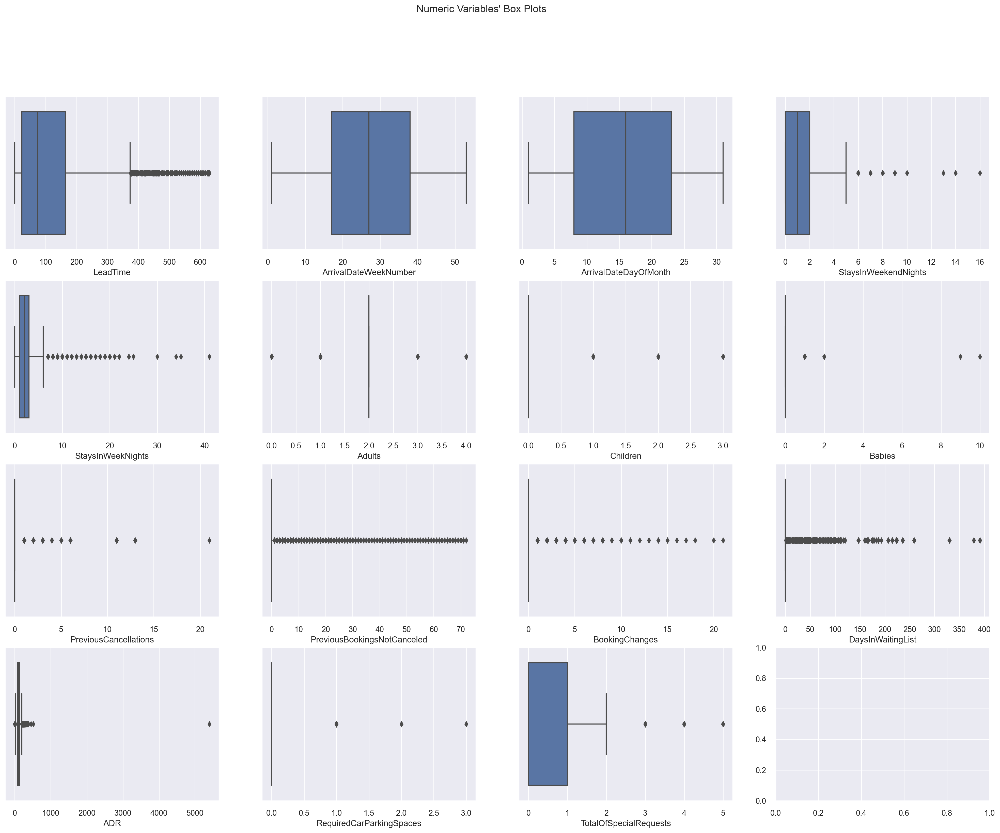

In [26]:
#Metric features Boxplots
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(25, 18))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(),metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=ds[feat],ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

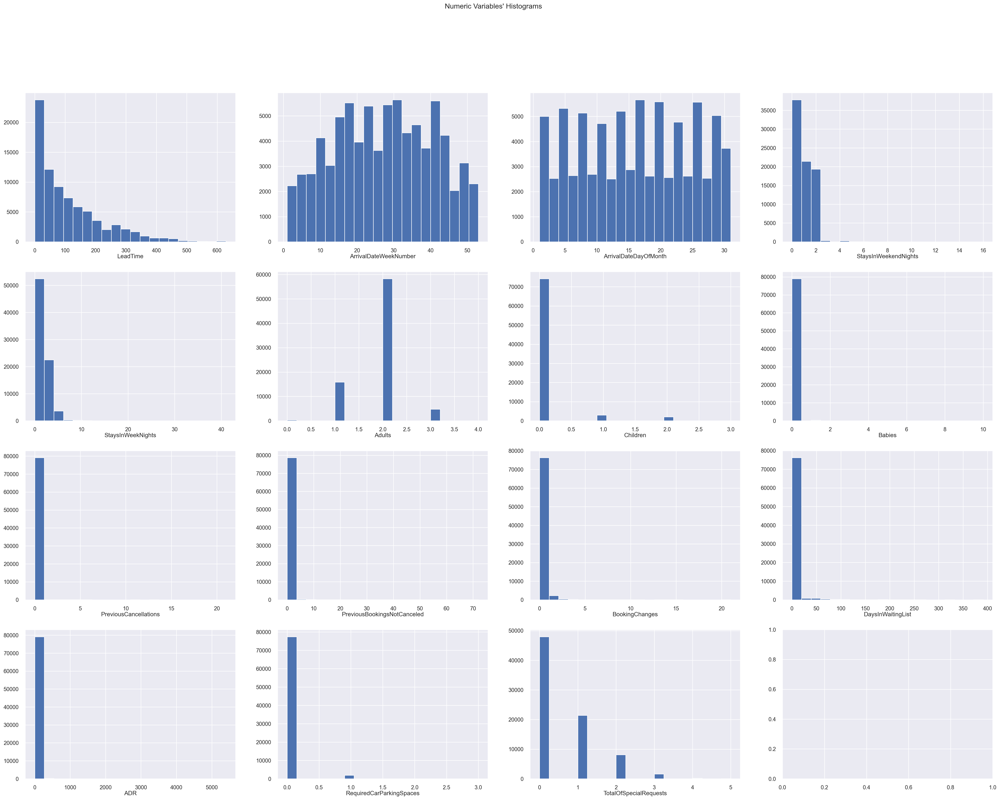

In [27]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(35, 25)) #defining the layout

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    ax.hist(ds[feat],bins=20)
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

##### IQR

In [28]:
#IQR
q20 = ds.quantile(.20)
q80 = ds.quantile(.80)
iqr = (q80 - q20)

upper_lim = q80 + 1.5 * iqr
lower_lim = q20 - 1.5 * iqr

filters1 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters1.append(ds[metric].between(llim, ulim, inclusive=True))

filters1 = pd.Series(np.all(filters1, 0),index=ds[metric_features].index)
ds2 = ds[filters1]
print('Percentage of data kept after removing outliers:', np.round(ds2.shape[0]  / ds.shape[0], 4))

#takes to much data

Percentage of data kept after removing outliers: 0.6648


##### Manual Removal

In [29]:
#Removing outliers manually
filters2 = (
    (ds['LeadTime'] <= 600)
    &
    (ds['StaysInWeekendNights'] <= 10)
    &
    (ds['StaysInWeekNights'] < 30)
    &
    (ds['Babies'] <= 5)
    &
    (ds['PreviousCancellations'] <= 10)
    &
    (ds['PreviousBookingsNotCanceled'] <= 50)
    &
    (ds['BookingChanges'] <= 7)
    &
    (ds['DaysInWaitingList'] <= 200)
    &
    (ds['ADR'] <= 1000)
)

ds3 = ds[filters2]

print('Percentage of data kept after removing outliers:', np.round(ds3.shape[0] / ds.shape[0], 4))

Percentage of data kept after removing outliers: 0.9939


### 3.3 Feature Engeneering<a class="anchor" id="featureengeneering"></a>

#### Region Variable from the Nationality <a class="anchor" id="newvariables"></a>

In [30]:
#For grouping the nationalities we used a csv file that represents the countries based on the ISO-3166 format
#Adding continent, for this part please use the csv file that attached or you can download it from url blow:
#https://github.com/lukes/ISO-3166-Countries-with-Regional-Codes/blob/master/all/all.csv
#https://github.com/lukes/ISO-3166-Countries-with-Regional-Codes

ISO_region = pd.read_csv('countriesISO.csv')

ISO_region.drop(['name', 'alpha-2', 'iso_3166-2','country-code',
                 'intermediate-region', 'region-code', 
                 'sub-region-code', 'intermediate-region-code'], axis=1, inplace=True)

ISO_region.rename(columns={"alpha-3": "Country"}, inplace=True)
ISO_region.rename(columns={"region": "Region"}, inplace=True)
ISO_region.head()

,Country,Region,sub-region
0,AFG,Asia,Southern Asia
1,ALA,Europe,Northern Europe
2,ALB,Europe,Southern Europe
3,DZA,Africa,Northern Africa
4,ASM,Oceania,Polynesia


In [31]:
# Merge the 'sub-region' column to the 'data'
ds_new = pd.merge(ds3, ISO_region[['Country','Region','sub-region']], on='Country')
ds_new

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate,Region,sub-region
0,0,6,2015,July,27,1,0,2,1,0.00,...,40,0,Transient,0.00,0,0,Check-Out,2015-07-03,Europe,Southern Europe
1,1,88,2015,July,27,1,0,4,2,0.00,...,40,0,Transient,76.50,0,1,Canceled,2015-07-01,Europe,Southern Europe
2,1,65,2015,July,27,1,0,4,1,0.00,...,40,0,Transient,68.00,0,1,Canceled,2015-04-30,Europe,Southern Europe
3,1,92,2015,July,27,1,2,4,2,0.00,...,40,0,Transient,76.50,0,2,Canceled,2015-06-23,Europe,Southern Europe
4,1,100,2015,July,27,2,0,2,2,0.00,...,40,0,Transient,76.50,0,1,Canceled,2015-04-02,Europe,Southern Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0,116,2017,July,27,2,2,0,2,0.00,...,40,0,Transient,126.00,0,0,Check-Out,2017-07-04,Africa,Sub-Saharan Africa
78275,0,84,2017,July,30,27,2,5,2,0.00,...,40,0,Transient,121.43,0,1,Check-Out,2017-08-03,Africa,Sub-Saharan Africa
78276,0,2,2017,August,32,9,0,3,2,0.00,...,40,0,Transient,183.33,0,1,Check-Out,2017-08-12,Asia,South-eastern Asia
78277,0,3,2017,August,32,10,0,2,2,0.00,...,40,0,Transient,180.00,0,1,Check-Out,2017-08-12,Asia,South-eastern Asia


In [32]:
#replace missing values (csv doesn't contain Antartica's ISO code)
ds_new.loc[ds_new["Region"].isna(), "Region"] = "Antarctica"
ds_new.loc[ds_new["sub-region"].isna(), "sub-region"] = "Antarctica"

#### Arrival Date 

In [33]:
ds_new['ArrivalDate'] = pd.to_datetime(ds_new['ArrivalDateYear'].astype(str) + '-' +
                                   ds_new['ArrivalDateMonth'].astype(str) + '-' +
                                   ds_new['ArrivalDateDayOfMonth'].astype(str))


ds_new['ArrivalDate'] = pd.to_datetime(ds_new['ArrivalDate'])

#### Booking Date

In [34]:
# Create the bookingDate column by subtracting the LeadTime from the arrivalDate
ds_new['BookingDate'] = ds_new['ArrivalDate'] - pd.to_timedelta(ds_new['LeadTime'], unit='days')

#### Day of the week + Quarter 

In [35]:
# Extract the day of the week, week of the year, and quarter
ds_new['dayoftheweek'] = ds_new['ArrivalDate'].dt.dayofweek
ds_new['quarter'] = ds_new['ArrivalDate'].dt.quarter
ds_new['season'] = ds_new['ArrivalDate'].dt.month.apply(lambda x: 'Winter' if x in [1, 2, 12] else
                                                     'Spring' if x in [3, 4, 5] else
                                                     'Summer' if x in [6, 7, 8] else
                                                     'Autumn' if x in [9, 10, 11] else None)

In [36]:
# Creating a new feature named TotalBookings
ds_new['TotalBookings'] = ds_new['PreviousCancellations']+ ds_new['PreviousBookingsNotCanceled']

#### Length of Stay

In [37]:
# Convert 'ReservationStatusDate' to datetime
ds_new['ReservationStatusDate'] = pd.to_datetime(ds_new['ReservationStatusDate'])

# Calculate Length of Stay
ds_new['Length of Stay'] = (ds_new['ReservationStatusDate'] - ds_new['ArrivalDate']).dt.days

# Adjust Length of Stay based on ReservationStatus
ds_new.loc[ds_new['ReservationStatus'].isin(['Canceled', 'No-Show']), 'Length of Stay'] = 0

#### Time in the system

In [38]:
# Calculate Length of Stay
ds_new['Time in the System'] = (ds_new['ReservationStatusDate'] - ds_new['BookingDate']).dt.days

#### Room Change Status

In [39]:
ds_new['RoomChange'] = (ds_new['AssignedRoomType'] != ds_new['ReservedRoomType']).astype(int)

##### Update the metric and non metric feature lists

In [40]:
metric_features = ['LeadTime', 'ArrivalDateWeekNumber', 'ArrivalDateDayOfMonth',
                   'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
                   'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled',
                   'BookingChanges', 'DaysInWaitingList', 'ADR',
                   'RequiredCarParkingSpaces', 'TotalOfSpecialRequests','TotalBookings','Length of Stay', 'Time in the System']
non_metric_features = ds_new.columns.drop(metric_features).to_list()

### 3.4 Feature selection/elimination <a class="anchor" id="featureselection"></a>

#### Metric Variables

<AxesSubplot: >

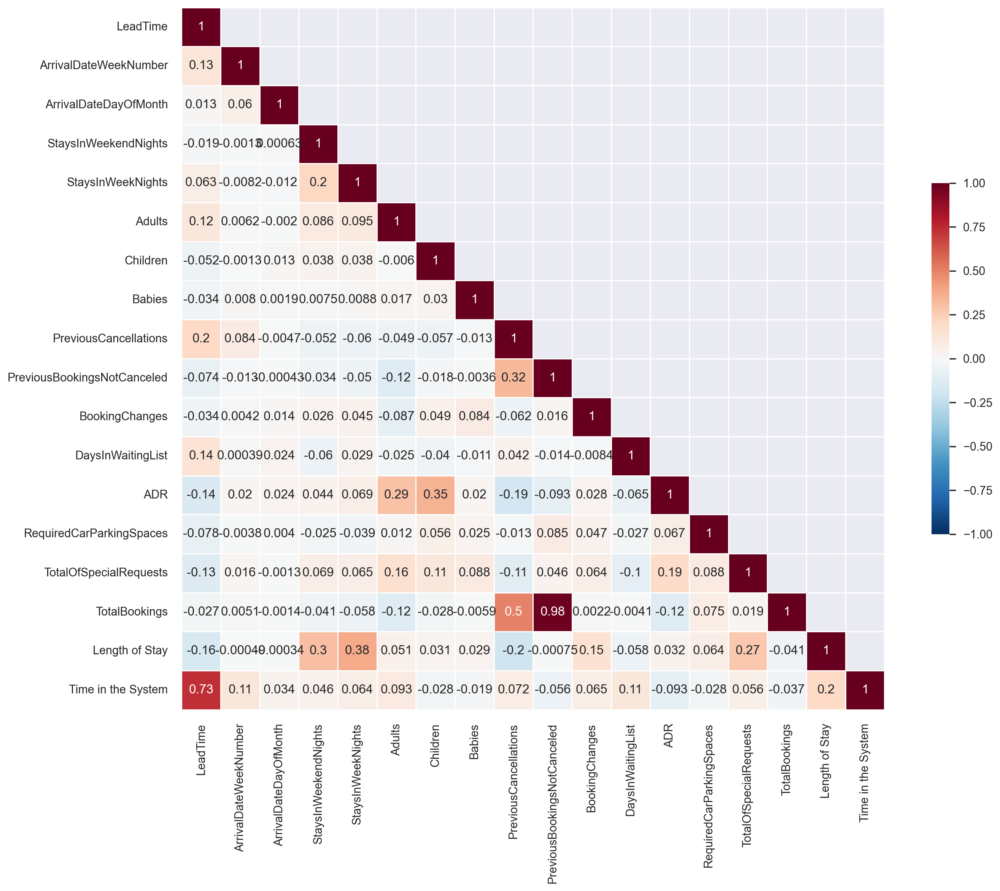

In [41]:
#Pearson
corr = ds_new[metric_features].corr(method='pearson')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
mask[np.diag_indices_from(mask)] = False
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask = mask, cmap = 'RdBu_r', vmax = 1, vmin=-1, center = 0,
            square = True, annot = True, linewidths = .5, cbar_kws = {"shrink": .5})

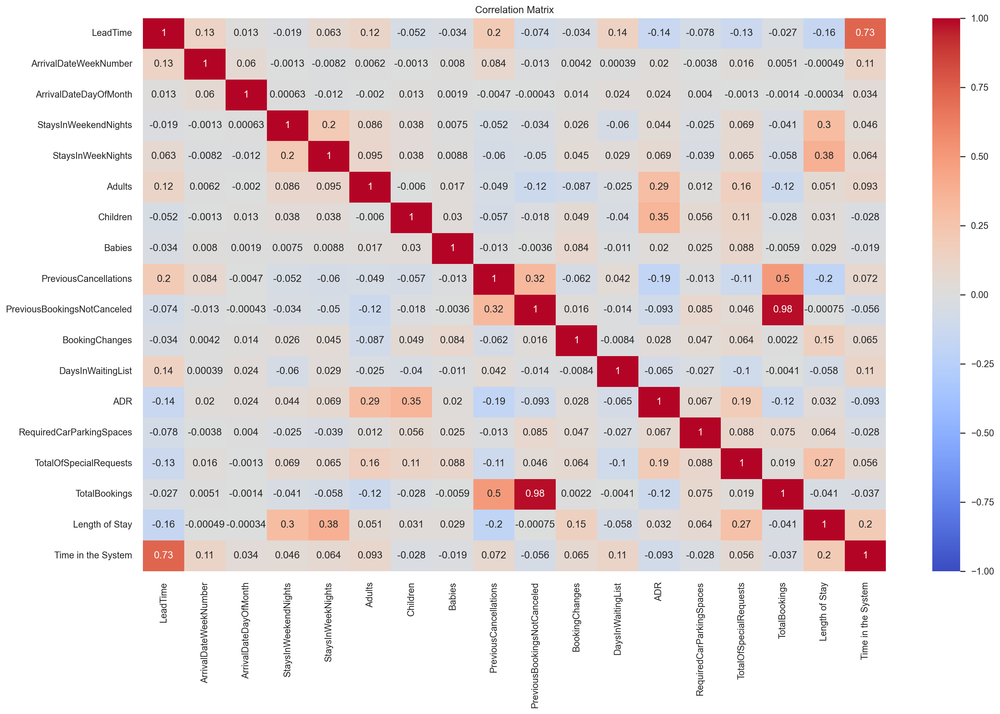

In [42]:
# Correlation matrix with the target variable
corr_matrix = ds_new[metric_features].corr(method='pearson')

# Create a correlation matrix plot
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

#### RFE for Random Forest

In [43]:
# The "accuracy" scoring is proportional to the number of correct classifications
#rf = RandomForestClassifier() 
#rfecv = RFECV(estimator=rf, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
#rfecv = rfecv.fit(ds_new[metric_features], (ds_new['IsCanceled']))

#print('Optimal number of features :', rfecv.n_features_)
#print('Best features :', ds_new[metric_features].columns[rfecv.support_])

#### Non Metric Variables

In [44]:
#2Qhi-square

def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [45]:
for var in ds_new[non_metric_features]:
    TestIndependence(ds_new[non_metric_features][var],ds_new['IsCanceled'], var)

IsCanceled is IMPORTANT for Prediction
ArrivalDateYear is IMPORTANT for Prediction
ArrivalDateMonth is IMPORTANT for Prediction
Meal is IMPORTANT for Prediction
Country is IMPORTANT for Prediction
MarketSegment is IMPORTANT for Prediction
DistributionChannel is IMPORTANT for Prediction
IsRepeatedGuest is IMPORTANT for Prediction
ReservedRoomType is IMPORTANT for Prediction
AssignedRoomType is IMPORTANT for Prediction
DepositType is IMPORTANT for Prediction
Agent is IMPORTANT for Prediction
Company is IMPORTANT for Prediction
CustomerType is IMPORTANT for Prediction
ReservationStatus is IMPORTANT for Prediction
ReservationStatusDate is IMPORTANT for Prediction
Region is IMPORTANT for Prediction
sub-region is IMPORTANT for Prediction
ArrivalDate is IMPORTANT for Prediction
BookingDate is IMPORTANT for Prediction
dayoftheweek is IMPORTANT for Prediction
quarter is IMPORTANT for Prediction
season is IMPORTANT for Prediction
RoomChange is IMPORTANT for Prediction


In [46]:
ds_new[non_metric_features].columns

Index(['IsCanceled', 'ArrivalDateYear', 'ArrivalDateMonth', 'Meal', 'Country',
       'MarketSegment', 'DistributionChannel', 'IsRepeatedGuest',
       'ReservedRoomType', 'AssignedRoomType', 'DepositType', 'Agent',
       'Company', 'CustomerType', 'ReservationStatus', 'ReservationStatusDate',
       'Region', 'sub-region', 'ArrivalDate', 'BookingDate', 'dayoftheweek',
       'quarter', 'season', 'RoomChange'],
      dtype='object')

In [47]:
#2qhi-square atributes importance to all non metric features

#### Feature selection/elimination conclusion
In both metric and non metric features it seems that the algorithms both classify basically all variables as important for our target variable. In that sense we are keeping all of them (except some that don't make sense for clustering, which will be taken out further up ahead in the notebook) and then when we proceed with modelling we will apply multiple feature selection methods to see which one gives us best results.

## 4. Data Visualization <a class="anchor" id="Datavisualization"></a>

### Profile Report Before the Normalization of the final dataset

Optionally, you may use `pandas-profiling` as a first approach to your data analysis. Remember, although this tool provides excelent insights about the data you're working with, it is not enough to perform a proper analysis.

In [48]:
#profile = ProfileReport(
#    ds_new[metric_features], 
#    title='Hotel Customer Data',
#    correlations={
#        "pearson": {"calculate": True},
#        "spearman": {"calculate": False},
#        "kendall": {"calculate": False},
#        "phi_k": {"calculate": False},
#        "cramers": {"calculate": False},
#    },
#)

In [49]:
#profile

#### Nationality with the highest prevalence among our guests

In [50]:
come_from = ds_new[ds_new['IsCanceled'] == 0]['Country'].value_counts().reset_index()
come_from.columns = ['Country', 'No. of guests']
come_from

,Country,No. of guests
0,PRT,10813
1,FRA,7017
2,DEU,4986
3,GBR,3749
4,ESP,3282
...,...,...
144,NAM,1
145,MLI,1
146,BHR,1
147,BFA,1


In [51]:
#!pip install kaleido
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

#now this works:
import plotly.graph_objects as go

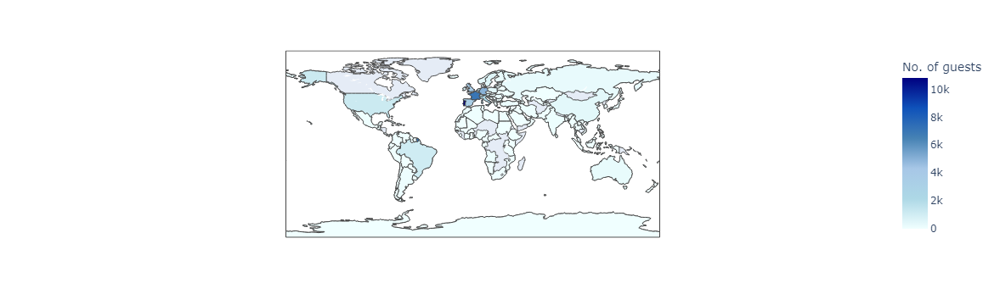

In [52]:
# Define a custom color scale (reversed order)
color_scale = ["#F0FFFF", "#ADD8E6", "#A7C7E7", "#4682B4", "#0F52BA", "#000080"]

# Create the choropleth map using Plotly Express with the custom color scale
guestsmap = px.choropleth(come_from, locations='Country', color='No. of guests',
                          hover_name='Country', color_continuous_scale=color_scale)

# Save the choropleth map as an image
#guestsmap.write_image('choropleth_map.png', width=900, height=700)

guestsmap

#### Top 10 countries per Number of Guests

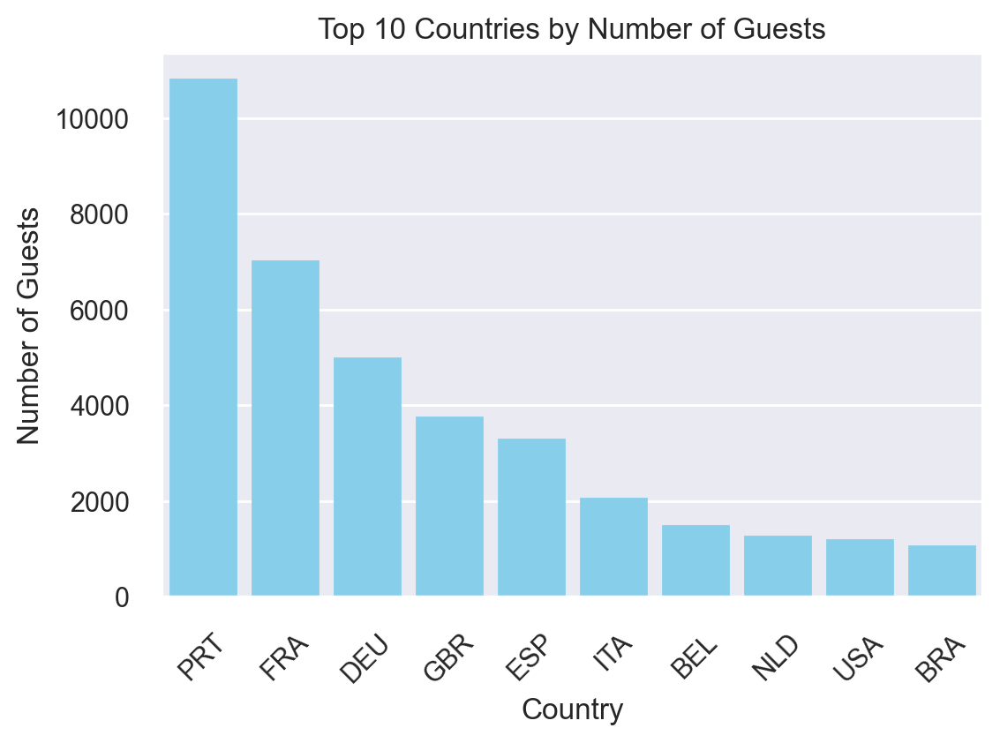

In [53]:
# Calculate the average number of guests per country
guests_per_country = come_from.groupby('Country')['No. of guests'].mean().reset_index()

# Sort the data by the number of guests in descending order
guests_per_country = guests_per_country.sort_values(by='No. of guests', ascending=False)

# Select the top 10 countries
top_10_countries = guests_per_country.head(10)

# Plot the top 10 countries by number of guests
plt.figure(figsize=(6,4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=top_10_countries, x='Country', y='No. of guests', color='skyblue')
chart.set(title='Top 10 Countries by Number of Guests')
chart.set(xlabel='Country', ylabel='Number of Guests')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()

#### Nationality with the highest cancelation count

In [54]:
canceled_customers = ds_new[ds_new['IsCanceled'] == 1]['Country'].value_counts().reset_index()
canceled_customers.columns = ['Country', 'No. of guests']
canceled_customers

,Country,No. of guests
0,PRT,19824
1,FRA,1723
2,GBR,1561
3,ESP,1325
4,ITA,1253
...,...,...
119,VGB,1
120,MCO,1
121,TMP,1
122,NIC,1


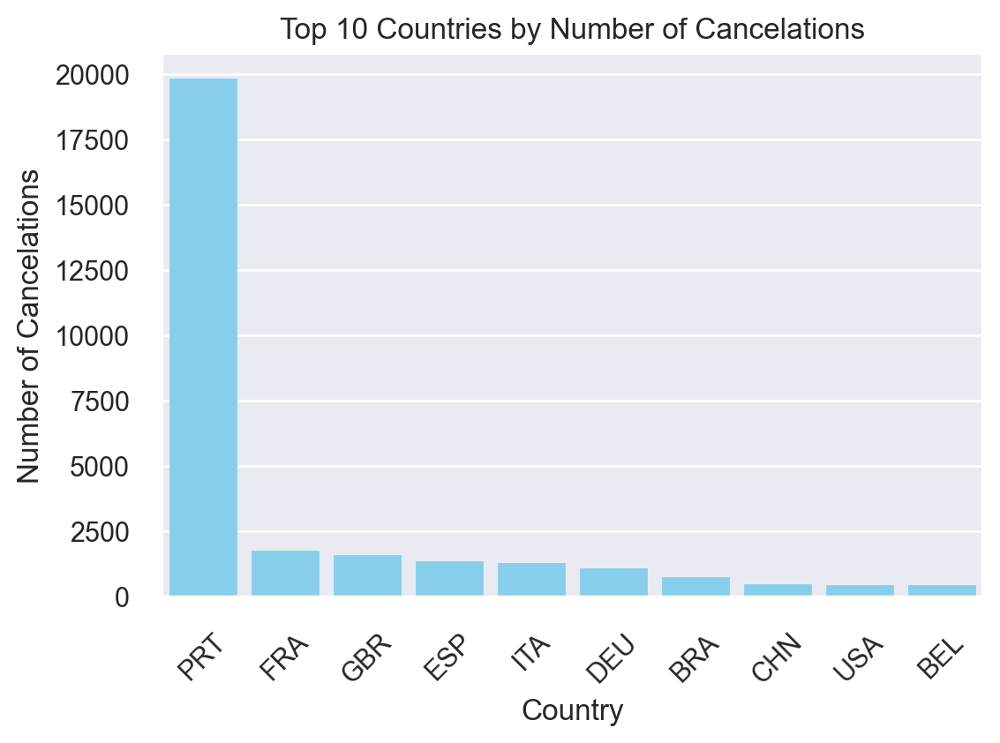

In [55]:
# Calculate the average number of guests per country
cancelations_per_country = canceled_customers.groupby('Country')['No. of guests'].mean().reset_index()

# Sort the data by the number of guests in descending order
cancelations_per_country = cancelations_per_country.sort_values(by='No. of guests', ascending=False)

# Select the top 10 countries
top_10_countries = cancelations_per_country.head(10)

# Plot the top 10 countries by number of guests
plt.figure(figsize=(6,4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=top_10_countries, x='Country', y='No. of guests', color='skyblue')
chart.set(title='Top 10 Countries by Number of Cancelations')
chart.set(xlabel='Country', ylabel='Number of Cancelations')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()

#### Months that have the highest guest count in the hotel

In [56]:
# Filter the dataframe for non-cancelled bookings
non_cancelled_df = ds_new[ds_new['IsCanceled'] == 0]

# Group by ArrivalDateMonth and count the number of guests for each month
guests_per_month = non_cancelled_df.groupby('ArrivalDateMonth').size().reset_index(name='Number of Guests')

# Sort the dataframe by number of guests in descending order
guests_per_month = guests_per_month.sort_values('Number of Guests', ascending=False)

# Reset the index of the dataframe
guests_per_month = guests_per_month.reset_index(drop=True)

# Print the dataframe showing the number of guests per month
guests_per_month

,ArrivalDateMonth,Number of Guests
0,August,5325
1,July,4701
2,May,4441
3,June,4327
4,October,4301
5,September,4177
6,March,4035
7,April,3981
8,February,3049
9,November,2681


Top 3 Months: August, July and May 

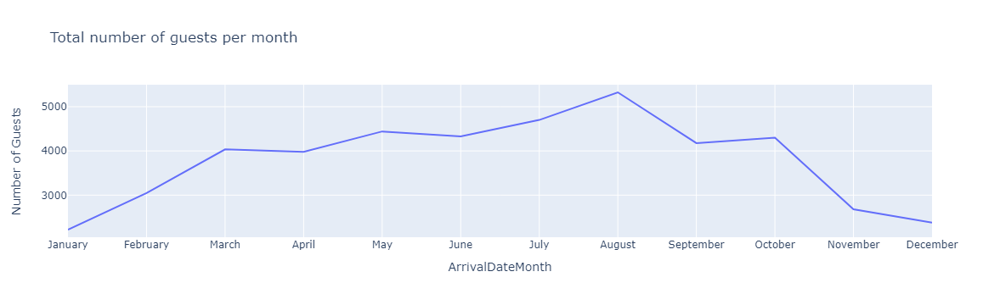

In [57]:
# Total number of cancelations per month

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
               'August', 'September', 'October', 'November', 'December']

guests_per_month['ArrivalDateMonth'] = pd.Categorical(guests_per_month['ArrivalDateMonth'],
                                                          categories=month_order,
                                                          ordered=True)
guests_per_month = guests_per_month.sort_values('ArrivalDateMonth')

# Line chart showing the total number of guests per month
fig = px.line(guests_per_month, x='ArrivalDateMonth', y='Number of Guests',
              title='Total number of guests per month')

fig.show()

#### Months that have the highest cancelation count in the hotel

In [58]:
# What are the months with the highest number of cancelations in the hotel?

# Filter the dataframe for non-cancelled bookings
canceled_df = ds_new[ds_new['IsCanceled'] == 1]

# Group by ArrivalDateMonth and count the number of guests for each month
cancelations_per_month = canceled_df.groupby('ArrivalDateMonth').size().reset_index(name='Number of Cancelations')

# Sort the dataframe by number of guests in descending order
cancelations_per_month = cancelations_per_month.sort_values('Number of Cancelations', ascending=False)

# Reset the index of the dataframe
cancelations_per_month = cancelations_per_month.reset_index(drop=True)

# Print the dataframe showing the number of guests per month
cancelations_per_month

,ArrivalDateMonth,Number of Cancelations
0,May,3606
1,August,3577
2,June,3511
3,April,3425
4,July,3273
5,October,3183
6,September,3062
7,March,2284
8,February,1896
9,December,1735


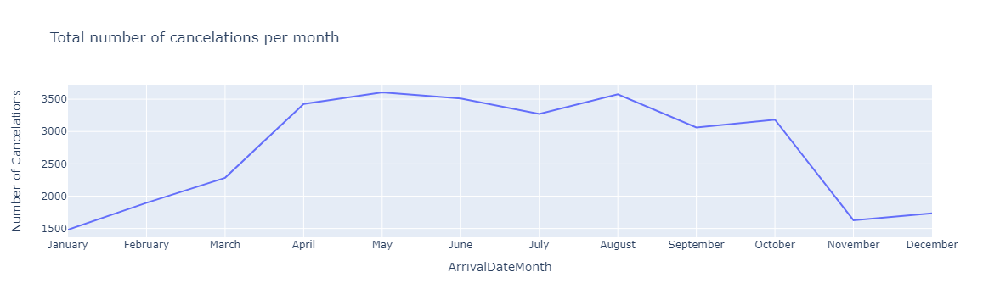

In [59]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
               'August', 'September', 'October', 'November', 'December']

cancelations_per_month['ArrivalDateMonth'] = pd.Categorical(cancelations_per_month['ArrivalDateMonth'],
                                                          categories=month_order,
                                                          ordered=True)
cancelations_per_month = cancelations_per_month.sort_values('ArrivalDateMonth')

# Line chart showing the total number of cancelations per month
fig = px.line(cancelations_per_month, x='ArrivalDateMonth', y='Number of Cancelations',
              title='Total number of cancelations per month')

fig.show()

#### Cancelation rate per Market Segment

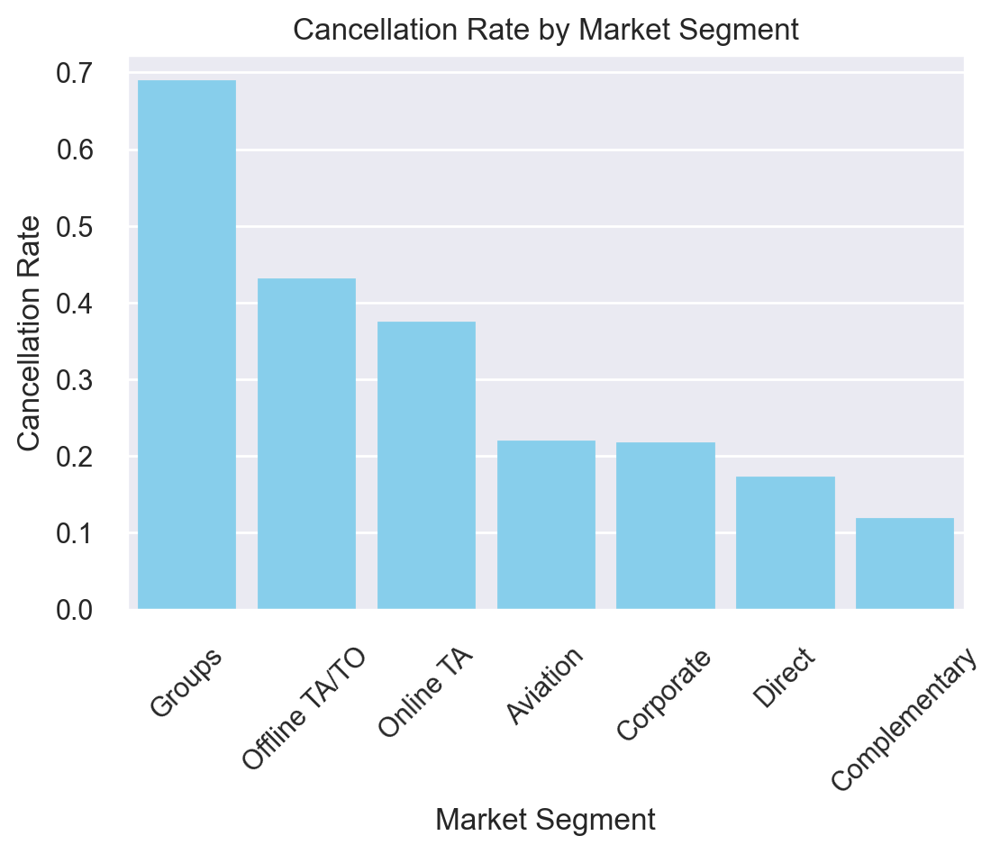

In [60]:
# Calculate cancellation rate by market segment
cancellation_rate_mk = ds_new.groupby('MarketSegment')['IsCanceled'].mean().reset_index()

# Sort the data by cancellation rate in descending order
cancellation_rate_mk = cancellation_rate_mk.sort_values(by='IsCanceled', ascending=False)

# Plot the cancellation rate
plt.figure(figsize=(6,4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=cancellation_rate_mk, x='MarketSegment', y='IsCanceled', color='skyblue')
chart.set(title='Cancellation Rate by Market Segment')
chart.set(xlabel='Market Segment', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()

#### Cancelation rate per Distribution Channel

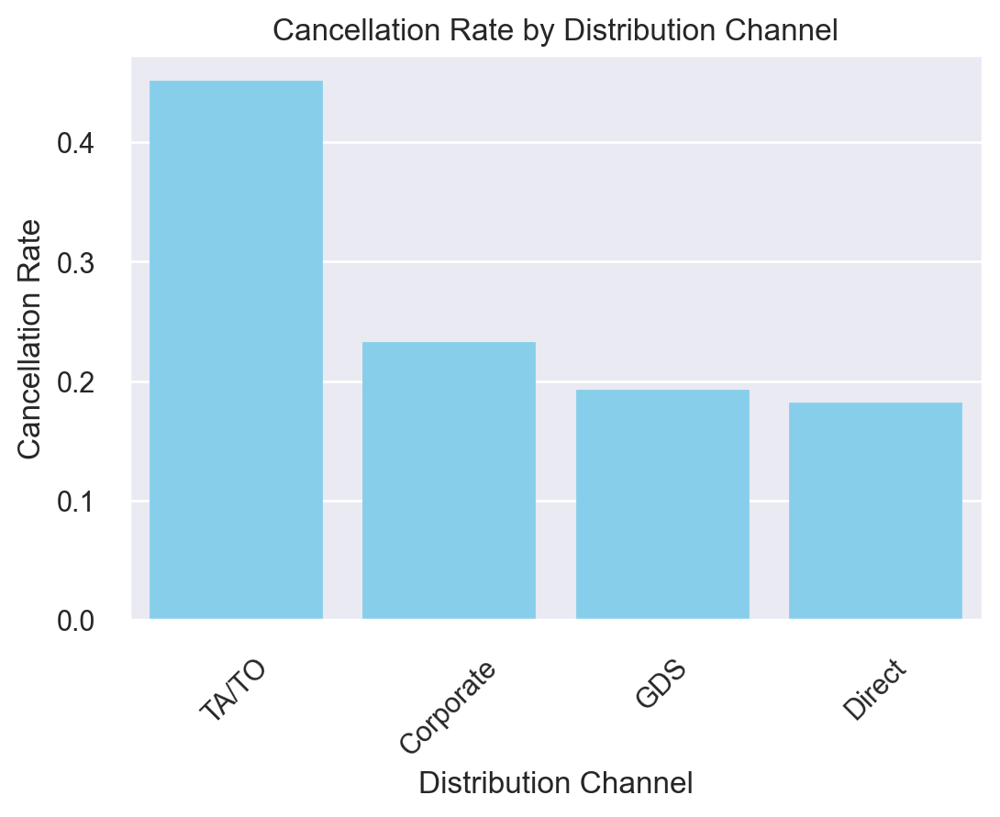

In [61]:
# Calculate cancellation rate by market segment
cancellation_rate_dc = ds_new.groupby('DistributionChannel')['IsCanceled'].mean().reset_index()

# Sort the data by cancellation rate in descending order
cancellation_rate_dc = cancellation_rate_dc.sort_values(by='IsCanceled', ascending=False)

# Plot the cancellation rate
plt.figure(figsize=(6, 4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=cancellation_rate_dc, x='DistributionChannel', y='IsCanceled', color='skyblue')
chart.set(title='Cancellation Rate by Distribution Channel')
chart.set(xlabel='Distribution Channel', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()

#### Cancelation rate per Customer Type

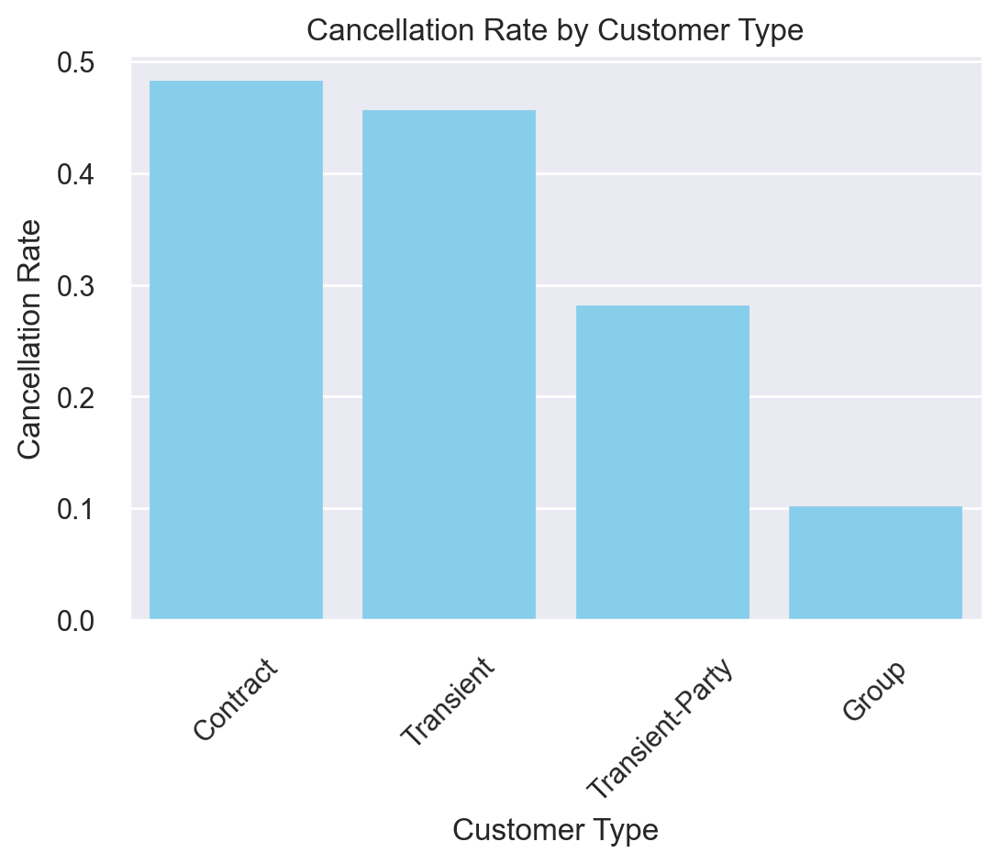

In [62]:
# Calculate cancellation rate by market segment
cancellation_rate = ds_new.groupby('CustomerType')['IsCanceled'].mean().reset_index()

# Sort the data by cancellation rate in descending order
cancellation_rate = cancellation_rate.sort_values(by='IsCanceled', ascending=False)

# Plot the cancellation rate
plt.figure(figsize=(6, 4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=cancellation_rate, x='CustomerType', y='IsCanceled', color='skyblue')
chart.set(title='Cancellation Rate by Customer Type')
chart.set(xlabel='Customer Type', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()


#### Meal preference

<AxesSubplot: xlabel='Meal', ylabel='count'>

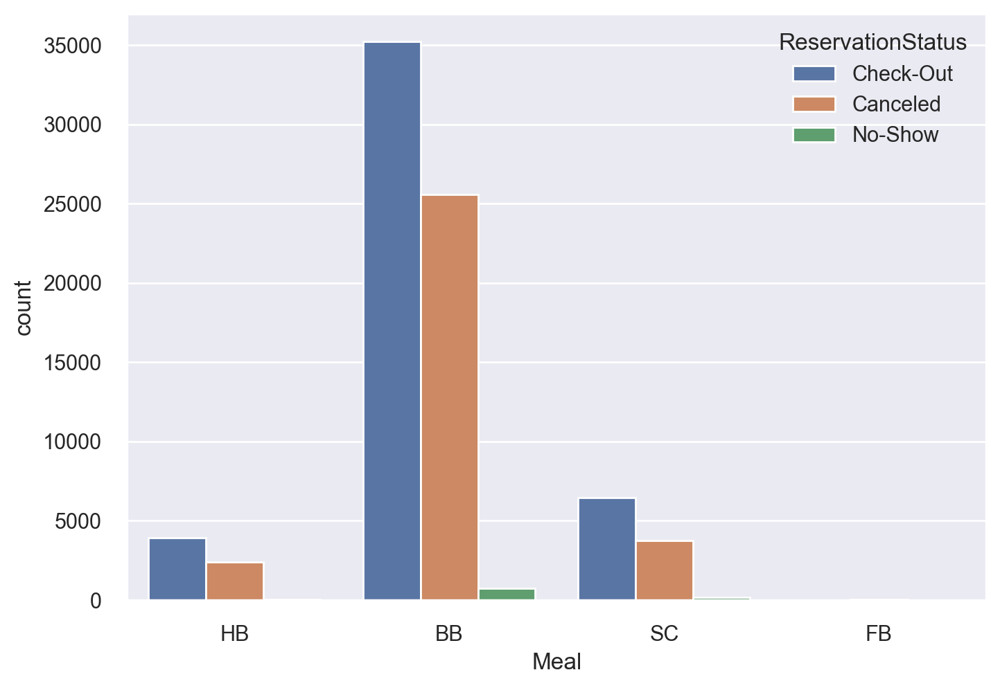

In [63]:
#The chart of Reservation Status based on the Customer Type
sns.countplot(data=ds_new, x='Meal', hue='ReservationStatus')

#### Cancelation rate per Repeated Guest

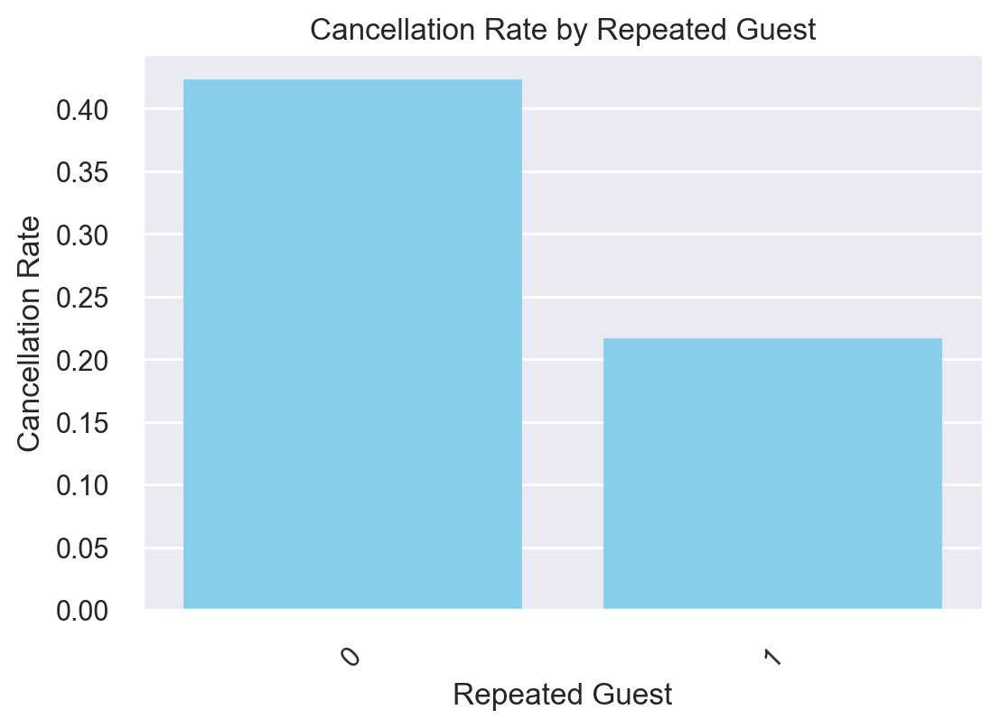

In [64]:
# Calculate cancellation rate by market segment
cancellation_rate = ds_new.groupby('IsRepeatedGuest')['IsCanceled'].mean().reset_index()

# Sort the data by cancellation rate in descending order
cancellation_rate = cancellation_rate.sort_values(by='IsCanceled', ascending=False)

# Plot the cancellation rate
plt.figure(figsize=(6, 4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=cancellation_rate, x='IsRepeatedGuest', y='IsCanceled', color='skyblue')
chart.set(title='Cancellation Rate by Repeated Guest')
chart.set(xlabel='Repeated Guest', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()


#### Price of room types per night and person

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


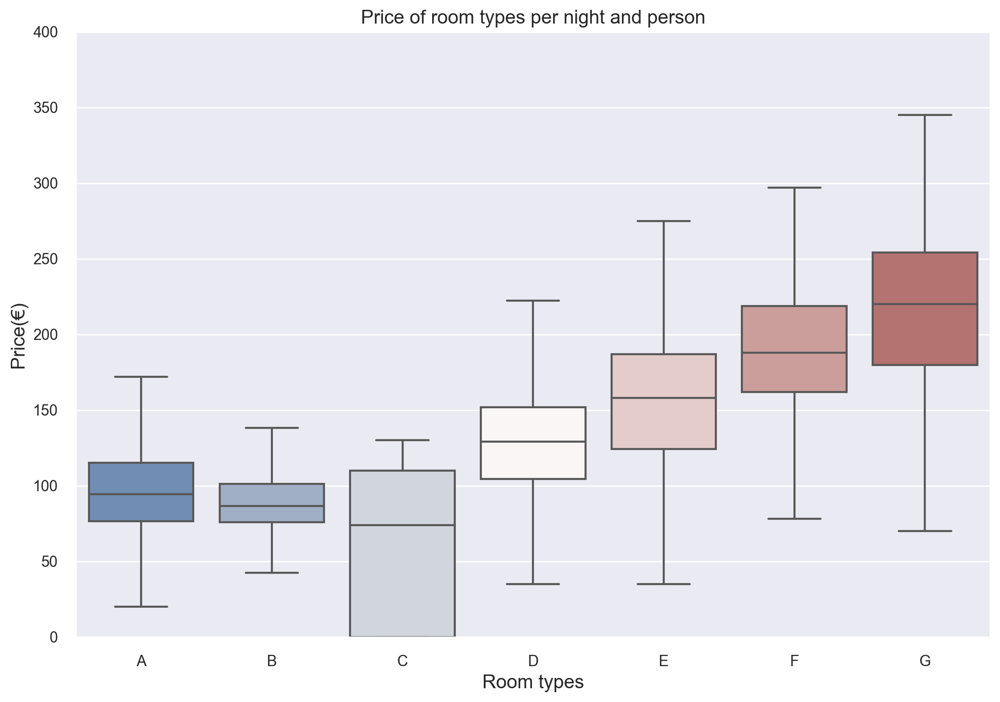

In [65]:
room_order = ["A","B","C","D","E","F","G","K","P"]

not_canceled_data = ds_new.loc[ds_new['IsCanceled'] == 0]

plt.figure(figsize=(12, 8))
sns.boxplot(x="ReservedRoomType",
            y="ADR",
            data= not_canceled_data.sort_values("ReservedRoomType"), 
            palette="vlag",
            fliersize=0)
plt.title("Price of room types per night and person", fontsize=14)
plt.xlabel("Room types", fontsize=14)
plt.ylabel("Price(€)", fontsize=14)
plt.legend(loc="upper right")
plt.ylim(0, 400)
plt.show()

In [66]:
#sns.pairplot(ds_new[metric_features])

In [67]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=500)
g = sns.countplot(data=ds_new, x='DistributionChannel', color="navy")

# Add frequency labels to the bars with larger and bold font
for p in ax.patches:
    ax.annotate(f'{p.get_height():,}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=14, weight='bold')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Distribution Channels", fontsize=plots_Title_fontSize, fontweight='bold')
plt.xlabel("DistributionChannel name", fontweight='bold')
plt.ylabel("Frequency", fontweight='bold')
plt.rc('axes', labelsize=subPlots_label_fontSize)

plt.show()

# Save to file
#fig.savefig(fname=exportsFolder+'CountPlot.svg', bbox_inches="tight")

In [68]:
# Define the labels for the x-axis
labels = ["Bookings Canceled", "Bookings Concretized"]

# Create a figure and axes with a larger size and higher DPI
fig, ax = plt.subplots(figsize=(10, 6), dpi=500)

# Plot histogram with navy bars
counts, bins, patches = ax.hist(ds_new["IsCanceled"], bins=[0, 0.5, 1], align='mid', rwidth=0.8, color='navy')

# Customize x-axis tick labels and positions
ax.set_xticks([0.25, 0.75])
ax.set_xticklabels(labels, ha='center')

# Add labels and title
ax.set_xlabel("Booking Status")
ax.set_ylabel("Frequency")
ax.set_title("Histogram of Booking Status")

# Add frequency labels to the bars with bold font
for count, patch in zip(counts, patches):
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f'{count:.0f}', (x, y), ha='center', va='bottom', weight='bold')

# Adjust spacing and layout
plt.tight_layout()

# Display the histogram
plt.show()

In [69]:
# The Bar chart of top 10 Nationalities in the dataset
fig, ax = plt.subplots(figsize=(12, 6), dpi=500)

# Plot countplot with navy bars
g = sns.countplot(data=ds_new, x=ds_new['Region'], order=pd.value_counts(ds_new['Region']).iloc[:10].index, color='navy')

# Add frequency labels to the bars with bold font
for p in ax.patches:
    ax.annotate(f'{p.get_height():,}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=10, weight='bold')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Customers' Regions", fontsize=plots_Title_fontSize)
plt.xlabel("Regions")
plt.ylabel("Frequency")
plt.rc('axes', labelsize=subPlots_label_fontSize)

plt.show()

#### Mean ADR per Month

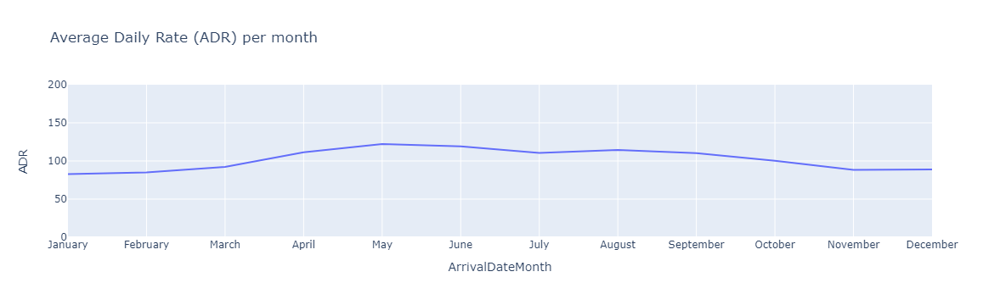

In [70]:
import plotly.express as px

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
               'August', 'September', 'October', 'November', 'December']

# Calculate the mean ADR per month
mean_adr_per_month = ds_new.groupby('ArrivalDateMonth')['ADR'].mean().reset_index()
mean_adr_per_month['ArrivalDateMonth'] = pd.Categorical(mean_adr_per_month['ArrivalDateMonth'],
                                                        categories=month_order,
                                                        ordered=True)
mean_adr_per_month = mean_adr_per_month.sort_values('ArrivalDateMonth')

# Line chart showing the average daily rate (ADR) per month
fig = px.line(mean_adr_per_month, x='ArrivalDateMonth', y='ADR',
              title='Average Daily Rate (ADR) per month',
              range_y=[0, 200])  # Adjust the range as per your preference

fig.show()


Spring and Summer clearly have higher rates. It is worth remembering that out top months in terms of guests are, by top order, August July and May

#### Mean Lead Time per Cancelation Status

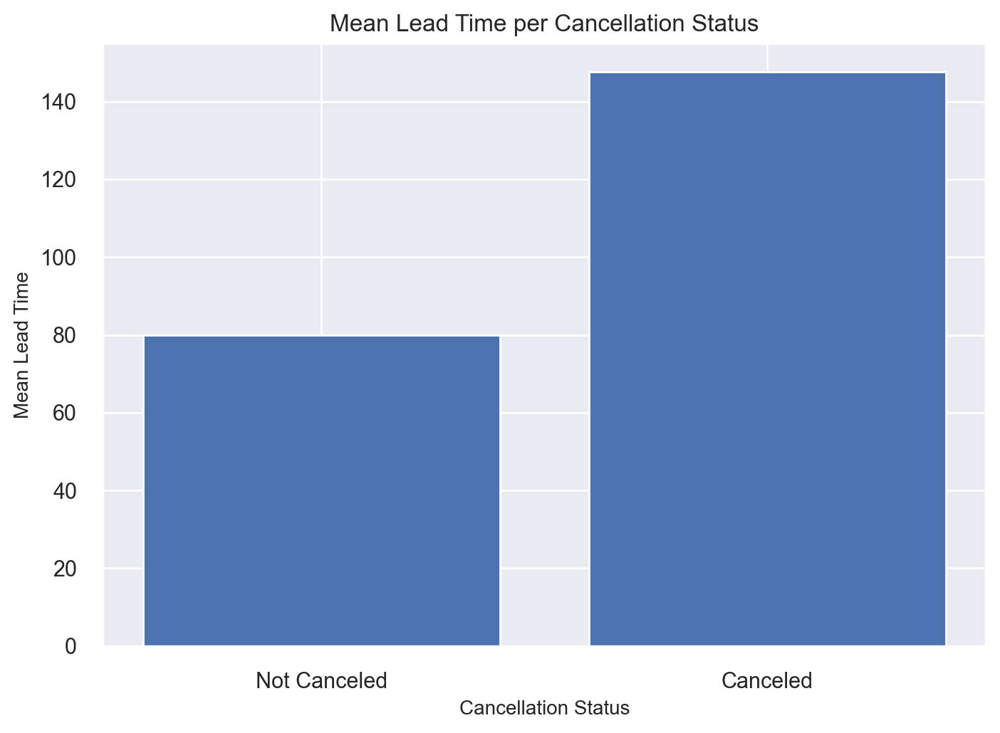

In [71]:
mean_lead_time = ds_new.groupby('IsCanceled')['LeadTime'].mean()
plt.bar(mean_lead_time.index, mean_lead_time)
plt.xlabel('Cancellation Status')
plt.ylabel('Mean Lead Time')
plt.title('Mean Lead Time per Cancellation Status')
plt.xticks(mean_lead_time.index, ['Not Canceled', 'Canceled'])
plt.show()

It appears that longer lead times are associated with higher cancellation rates which implies that people who book further in advance are more likely to cancel their bookings. There could be various reasons for this behavior. For example, people who book early might change their plans or find better deals closer to their travel dates, leading to a higher likelihood of cancellation. Additionally, uncertainties or changes in personal circumstances may arise over time, prompting individuals to cancel their bookings.

Solutions

- Improve customer Service
- Offer Flexible booking options - allow customers to modify or cancel their reservations without incurring heavy penalties.This can reduce the perceived risk of booking and make customers feel more comfortable making reservations in advance.
 - Provide incentives for non-cancellation

#### Cancelation rate per Deposit Type

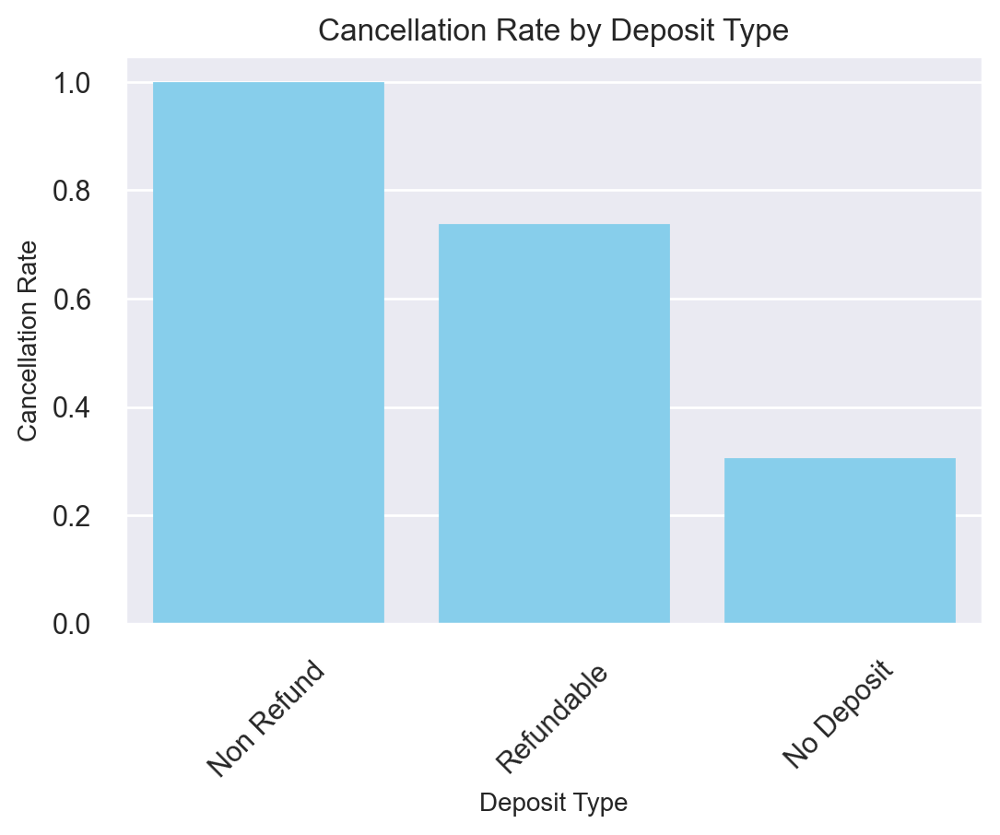

In [72]:
# Calculate cancellation rate by deposit type
cancellation_rate_dp = ds_new.groupby('DepositType')['IsCanceled'].mean().reset_index()

# Sort the data by cancellation rate in descending order
cancellation_rate_dp = cancellation_rate_dp.sort_values(by='IsCanceled', ascending=False)

# Plot the cancellation rate
plt.figure(figsize=(6, 4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=cancellation_rate_dp, x='DepositType', y='IsCanceled', color='skyblue')
chart.set(title='Cancellation Rate by Deposit Type')
chart.set(xlabel='Deposit Type', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()


In [73]:
ds_new['DepositType'].value_counts()

No Deposit    65583
Non Refund    12677
Refundable       19
Name: DepositType, dtype: int64

In [74]:
ds_new['DepositType'] = ds_new['DepositType'].str.strip()
non_refund_df = ds_new[ds_new['DepositType'] == 'Non Refund']

mean_cancellation_rate = non_refund_df['IsCanceled'].mean()
mean_cancellation_rate

0.9981068076043228

The results appear to be counterintuitive. The people who cancel the most are the ones that have have a non refundable deposit.

#### Distribution of Reservation Status by Month

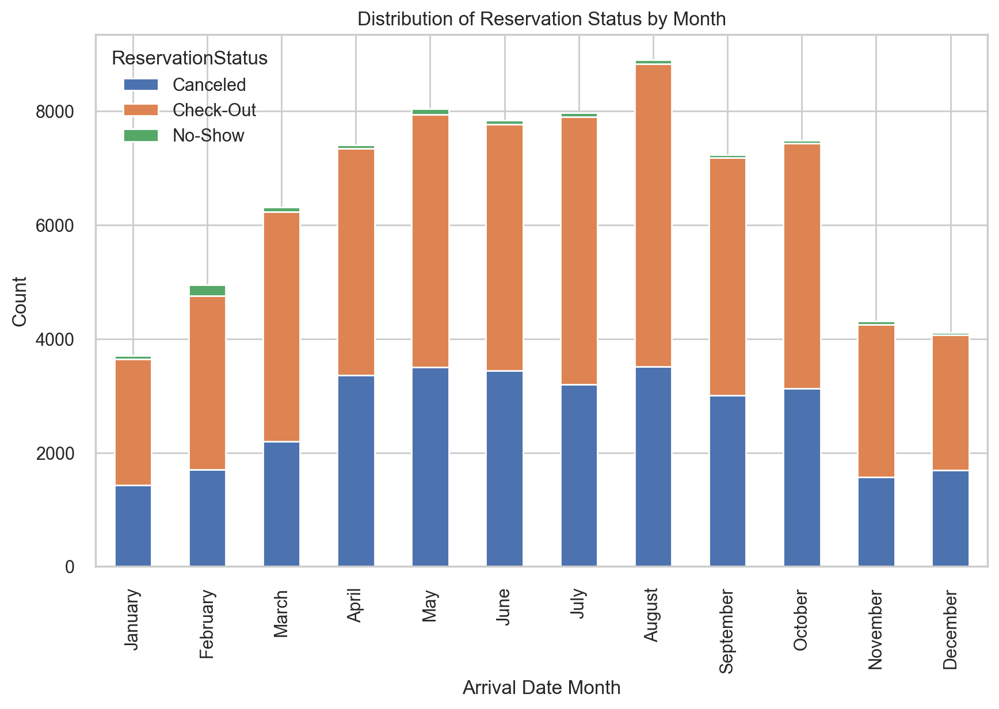

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Define the month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
               'August', 'September', 'October', 'November', 'December']

# Group the data by ArrivalDateMonth and ReservationStatus and calculate the count
reservation_status_month = ds_new.groupby(['ArrivalDateMonth', 'ReservationStatus']).size().reset_index(name='Count')

# Pivot the data to create a table with ArrivalDateMonth as the index, ReservationStatus as the columns, and Count as the values
reservation_status_pivot = reservation_status_month.pivot(index='ArrivalDateMonth', columns='ReservationStatus', values='Count')

# Reorder the rows based on the month order
reservation_status_pivot = reservation_status_pivot.reindex(month_order)

# Plot the stacked bar chart
sns.set(style='whitegrid')
reservation_status_pivot.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set labels and title
plt.xlabel('Arrival Date Month')
plt.ylabel('Count')
plt.title('Distribution of Reservation Status by Month')

# Show the chart
plt.show()

In [78]:
print(reservation_status_pivot.columns)

Index(['Canceled', 'Check-Out', 'No-Show'], dtype='object', name='ReservationStatus')


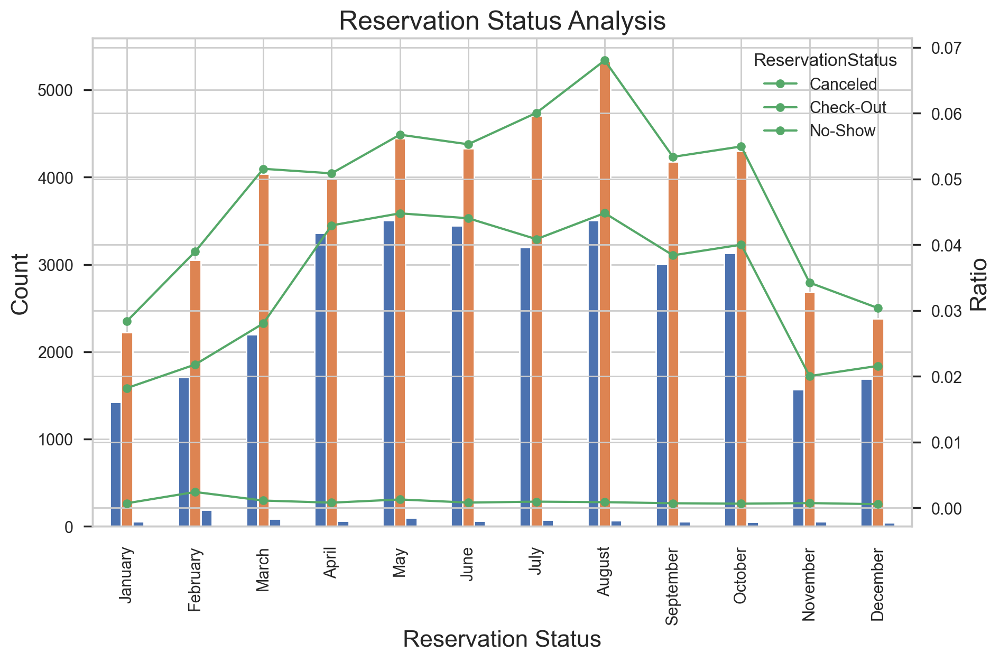

In [80]:
import matplotlib.pyplot as plt

# Create the figure and axes with white background
sns.set(style='whitegrid')
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

# Plot the count of IsCanceled on the first y-axis
reservation_status_pivot.plot(kind='bar', ax=ax1, color=['C0', 'C1'], legend=False)
ax1.set_ylabel('Count', fontsize=16)  # Increase font size

# Calculate the ratio
total_count = reservation_status_pivot.sum().sum()
reservation_status_ratio = reservation_status_pivot / total_count

# Plot the ratio on the second y-axis
reservation_status_ratio.plot(ax=ax2, linestyle='-', marker='o', color='C2')
ax2.set_ylabel('Ratio', fontsize=16)  # Increase font size

# Set the x-axis label
ax1.set_xlabel('Reservation Status', fontsize=16)

# Set the plot title
plt.title('Reservation Status Analysis', fontsize=18)

# Show the plot
plt.show()

The results appear to be quite proportional.

#### Special Requests rate per Customer Type

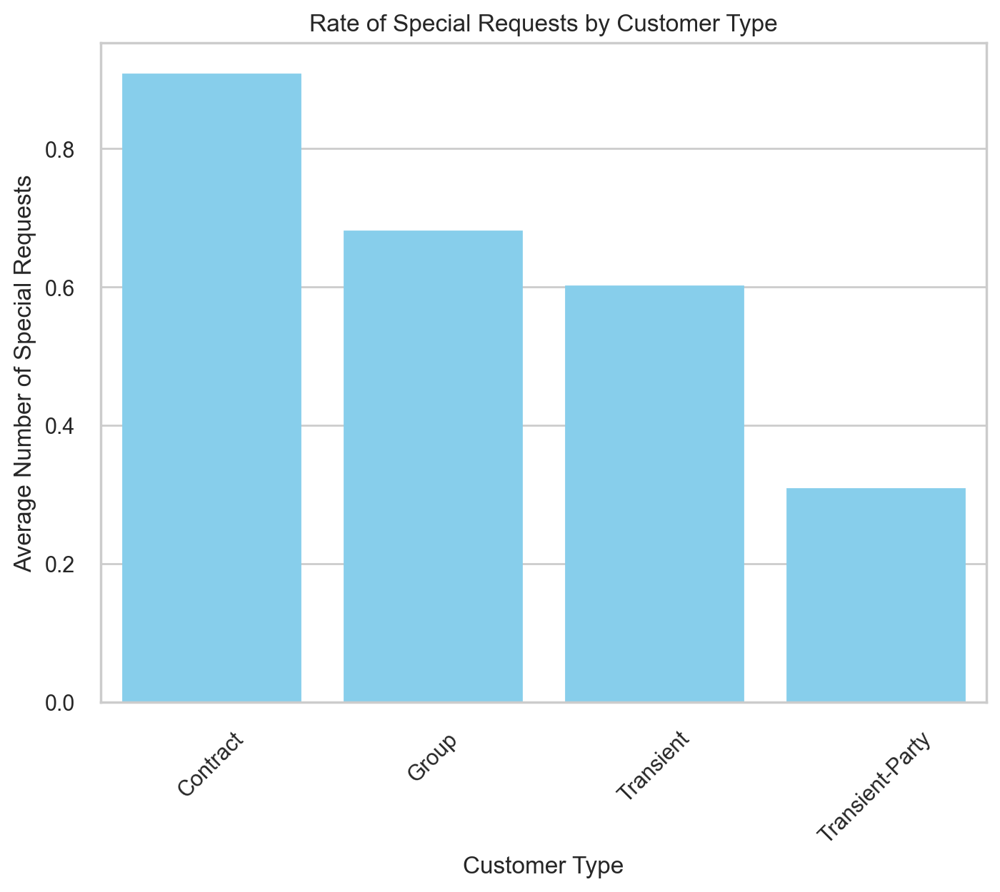

In [81]:
# Calculate the rate of special requests per customer type
special_requests_rate_customer = ds_new.groupby('CustomerType')['TotalOfSpecialRequests'].mean().reset_index()

# Plot the special requests rate
plt.figure(figsize=(8, 6))  # Adjust the size of the chart as needed
chart = sns.barplot(data=special_requests_rate_customer, x='CustomerType', y='TotalOfSpecialRequests', palette='Set2')
chart.set(title='Rate of Special Requests by Customer Type')
chart.set(xlabel='Customer Type', ylabel='Average Number of Special Requests')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()


#### Cancelation rate by Previous cancelation status

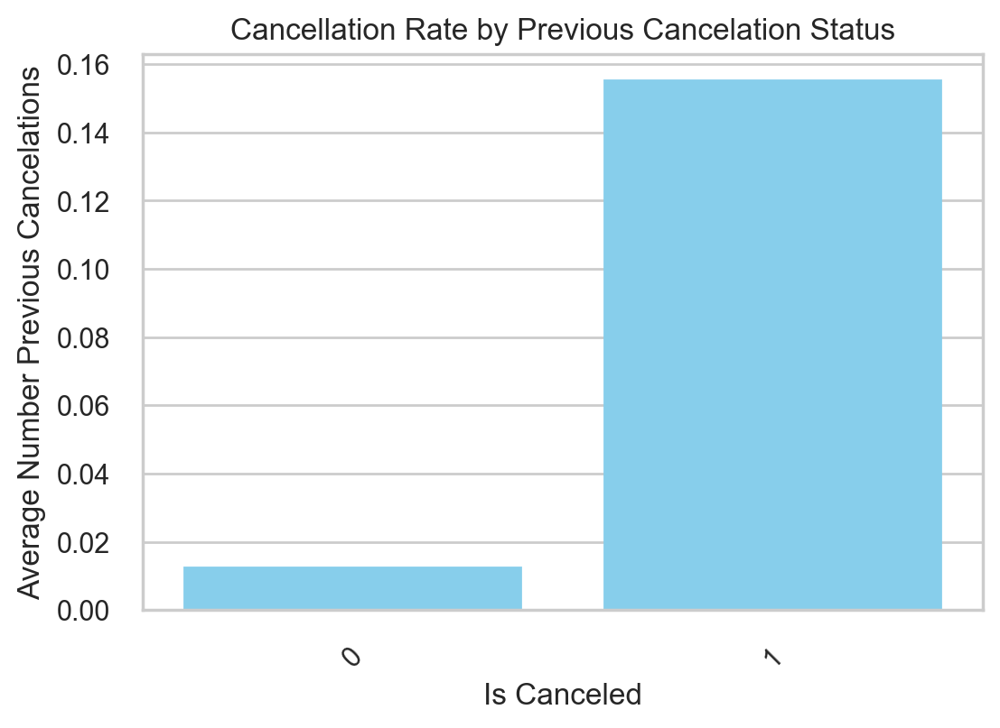

In [82]:
special_requests_rate_customer = ds_new.groupby('IsCanceled')['PreviousCancellations'].mean().reset_index()

# Plot the special requests rate
plt.figure(figsize=(6,4))  # Adjust the size of the chart as needed
chart = sns.barplot(data=special_requests_rate_customer, x='IsCanceled', y='PreviousCancellations', palette='Set2')
chart.set(title='Cancellation Rate by Previous Cancelation Status')
chart.set(xlabel='Is Canceled', ylabel='Average Number Previous Cancelations')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()

#### Cancelation rate per Room Change Status

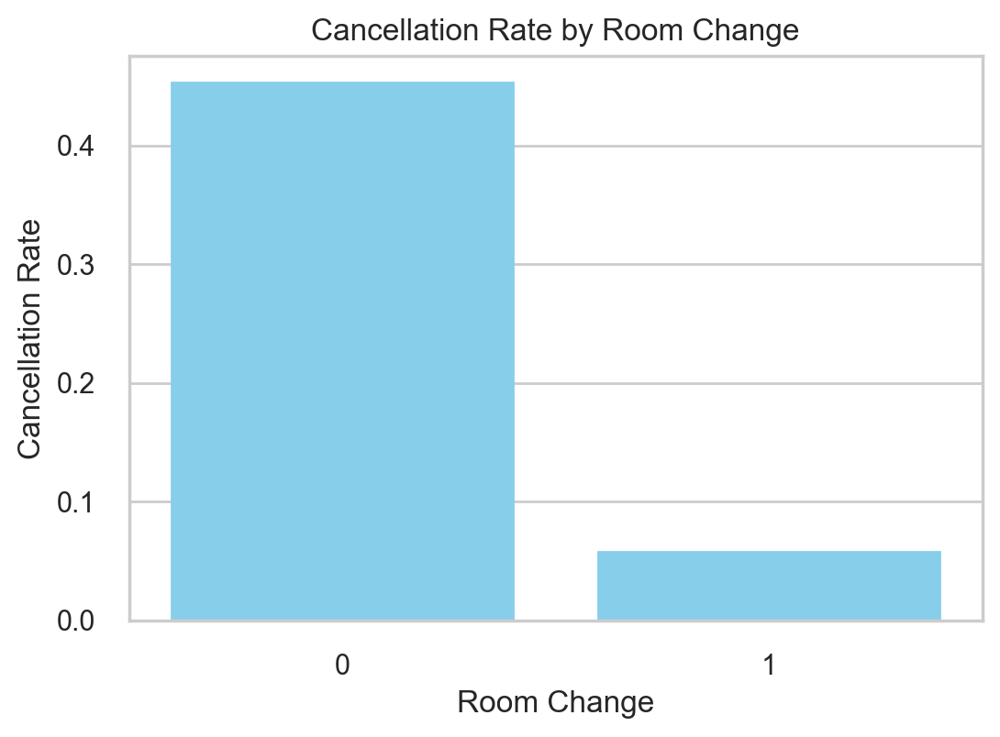

In [83]:
# Calculate cancellation rate by room change
cancellation_rate_rc = ds_new.groupby('RoomChange')['IsCanceled'].mean()

# Plot the histogram
plt.figure(figsize=(6, 4))  # Adjust the size of the chart as needed
chart = sns.barplot(x=cancellation_rate_rc.index, y=cancellation_rate_rc.values, color='skyblue')
chart.set(title='Cancellation Rate by Room Change')
chart.set(xlabel='Room Change', ylabel='Cancellation Rate')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Show the chart
plt.show()

#### Cancelations per Year

In [84]:
# Filter the dataframe for cancelled bookings
canceled_df = ds_new[ds_new['IsCanceled'] == 1]

# Group by ArrivalDateMonth and count the number of guests for each year
cancelations_per_year = canceled_df.groupby('ArrivalDateYear').size().reset_index(name='Number of Cancelations')

# Sort the dataframe by number of guests in descending order
cancelations_per_year = cancelations_per_year.sort_values('Number of Cancelations', ascending=False)

# Reset the index of the dataframe
cancelations_per_year = cancelations_per_year.reset_index(drop=True)

# Print the dataframe showing the number of guests per year
cancelations_per_year

,ArrivalDateYear,Number of Cancelations
0,2016,15145
1,2017,11516
2,2015,6000


#### Time in the System

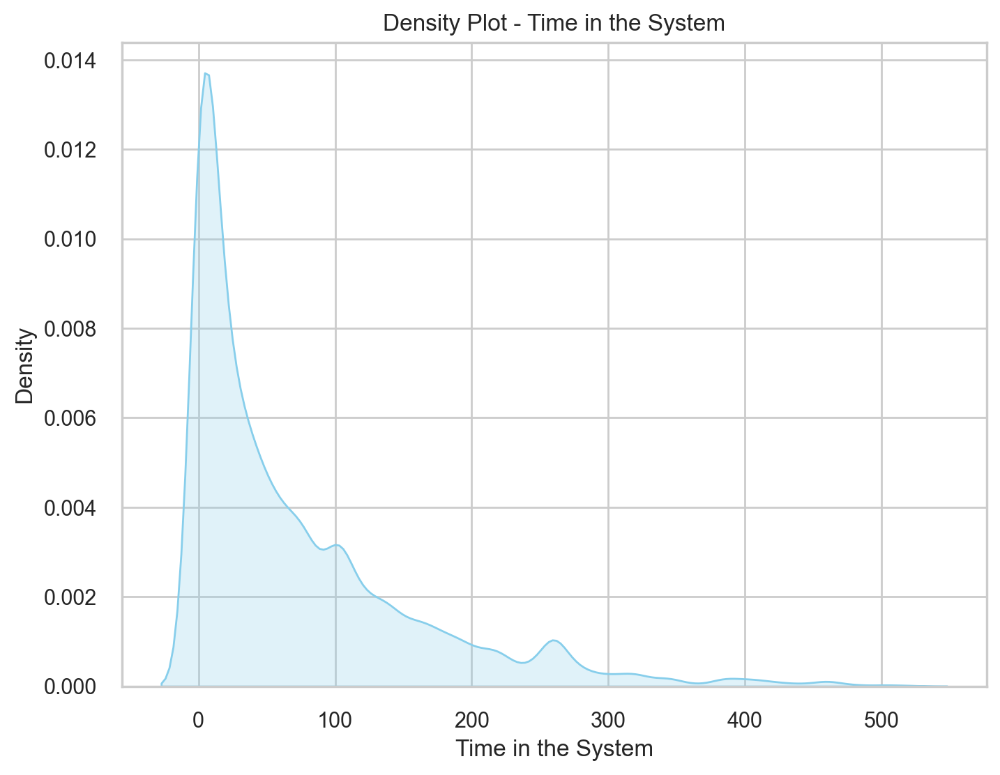

In [85]:
# Create a density plot
plt.figure(figsize=(8, 6))  # Adjust the size of the plot as needed
sns.kdeplot(data=ds_new, x='Time in the System', fill=True, color='skyblue')

# Set the title and labels
plt.title('Density Plot - Time in the System')
plt.xlabel('Time in the System')
plt.ylabel('Density')

# Show the plot
plt.show()

#### Cancelations per Time in the System

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


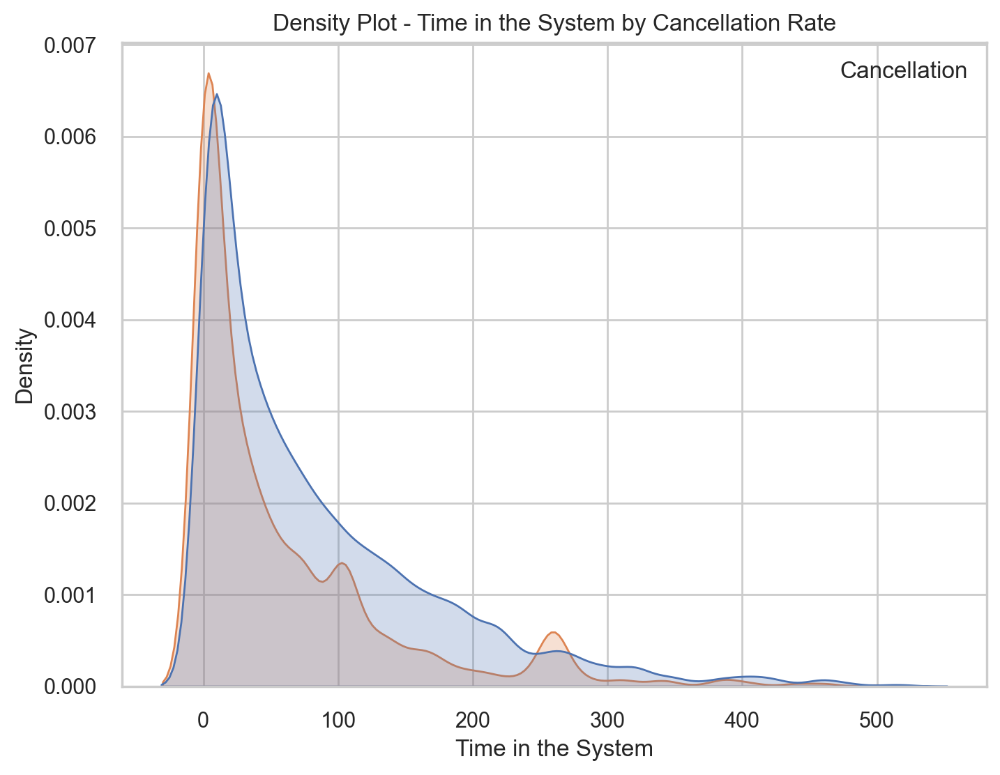

In [86]:
# Create a density plot with cancellation rate as hue
plt.figure(figsize=(8, 6))  # Adjust the size of the plot as needed
sns.kdeplot(data=ds_new, x='Time in the System', hue='IsCanceled', fill=True)

# Set the title and labels
plt.title('Density Plot - Time in the System by Cancellation Rate')
plt.xlabel('Time in the System')
plt.ylabel('Density')

# Show the legend
plt.legend(title='Cancellation')

# Show the plot
plt.show()

#### Average Length of Stay - Top 10 Countries

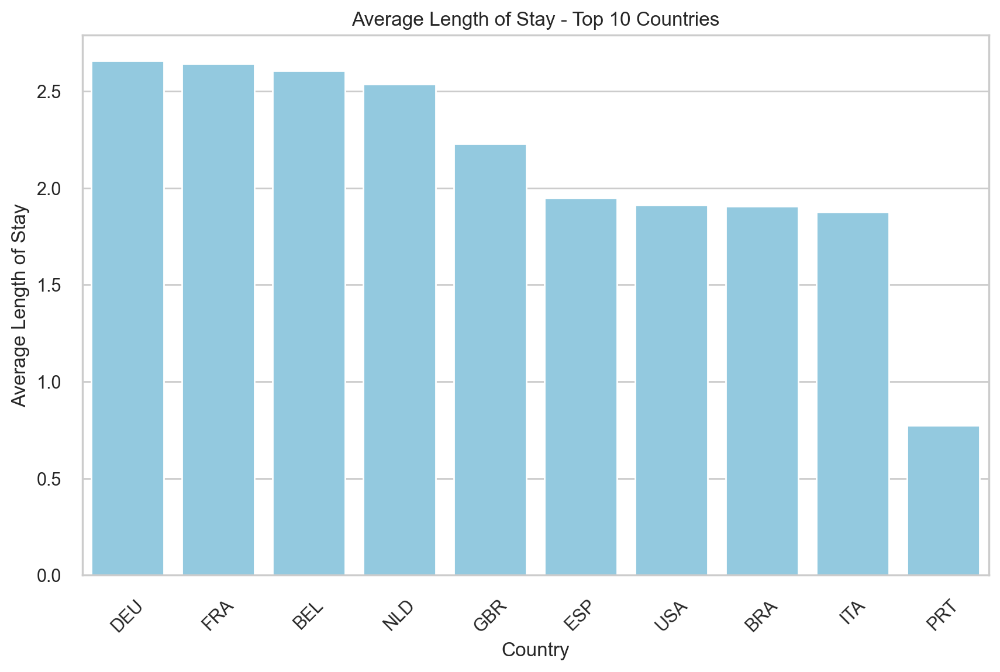

In [87]:
# Filter the dataset for the top 10 countries based on the number of guests
top_countries = guests_per_country.head(10)['Country']

# Filter the dataset to include only the selected countries
filtered_data = ds_new[ds_new['Country'].isin(top_countries)]

# Group the filtered dataset by the country and calculate the average length of stay
avg_length_of_stay = filtered_data.groupby('Country')['Length of Stay'].mean().reset_index()

# Sort the data by the average length of stay in descending order
avg_length_of_stay = avg_length_of_stay.sort_values('Length of Stay', ascending=False)

# Create a histogram plot for the top 10 countries based on the average length of stay
plt.figure(figsize=(10, 6))
chart = sns.barplot(data=avg_length_of_stay, x='Country', y='Length of Stay', color='skyblue')
chart.set(title='Average Length of Stay - Top 10 Countries')
chart.set(xlabel='Country', ylabel='Average Length of Stay')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()

#### Average Length of Stay per Month

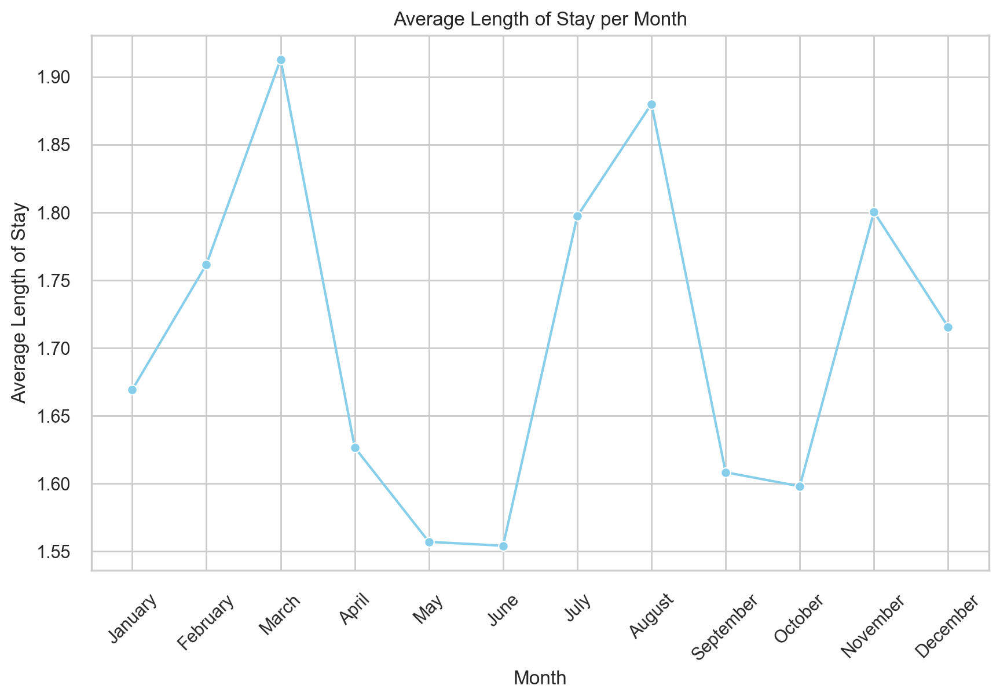

In [88]:
# Group the dataset by the month of arrival and calculate the average length of stay
avg_length_of_stay_per_month = ds_new.groupby('ArrivalDateMonth')['Length of Stay'].mean().reset_index()

# Sort the data by the month of arrival in the specified order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
               'August', 'September', 'October', 'November', 'December']
avg_length_of_stay_per_month['ArrivalDateMonth'] = pd.Categorical(avg_length_of_stay_per_month['ArrivalDateMonth'],
                                                                 categories=month_order,
                                                                 ordered=True)
avg_length_of_stay_per_month = avg_length_of_stay_per_month.sort_values('ArrivalDateMonth')

# Line chart showing the average length of stay per month
plt.figure(figsize=(10, 6))
chart = sns.lineplot(data=avg_length_of_stay_per_month, x='ArrivalDateMonth', y='Length of Stay',
                     marker='o', color='skyblue')
chart.set(title='Average Length of Stay per Month')
chart.set(xlabel='Month', ylabel='Average Length of Stay')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the plot
plt.show()


#### Average Daily Rate (ADR) per Length of Stay

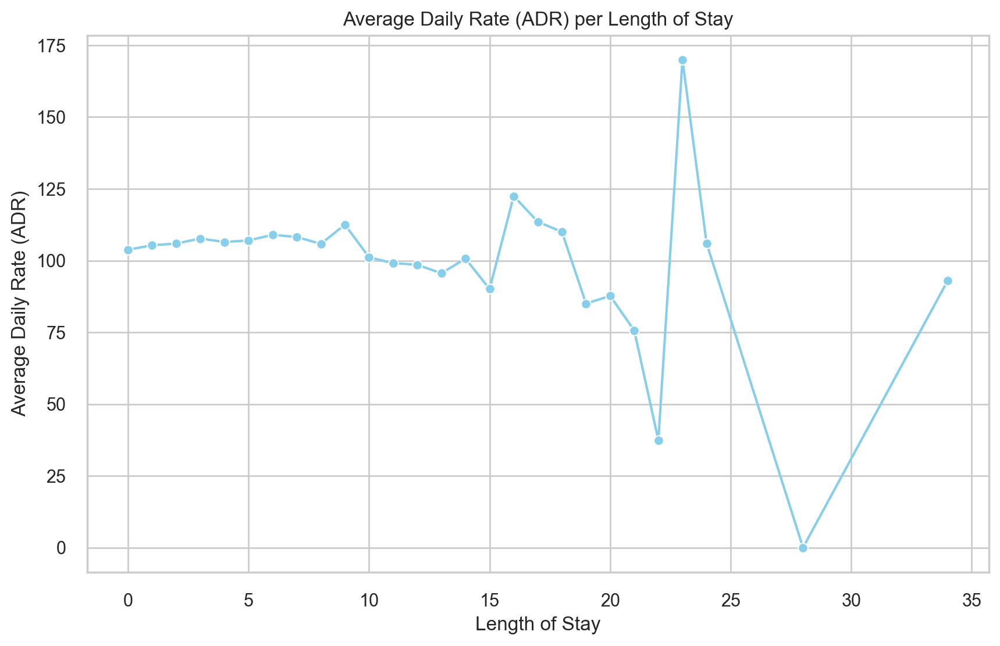

In [89]:
# Group the dataset by length of stay and calculate the average ADR
avg_adr_per_length_of_stay = ds_new.groupby('Length of Stay')['ADR'].mean().reset_index()

# Line chart showing the average daily rate (ADR) per length of stay
plt.figure(figsize=(10, 6))
chart = sns.lineplot(data=avg_adr_per_length_of_stay, x='Length of Stay', y='ADR',
                     marker='o', color='skyblue')
chart.set(title='Average Daily Rate (ADR) per Length of Stay')
chart.set(xlabel='Length of Stay', ylabel='Average Daily Rate (ADR)')

# Show the plot
plt.show()

#### Average Length of Stay by Customer Type

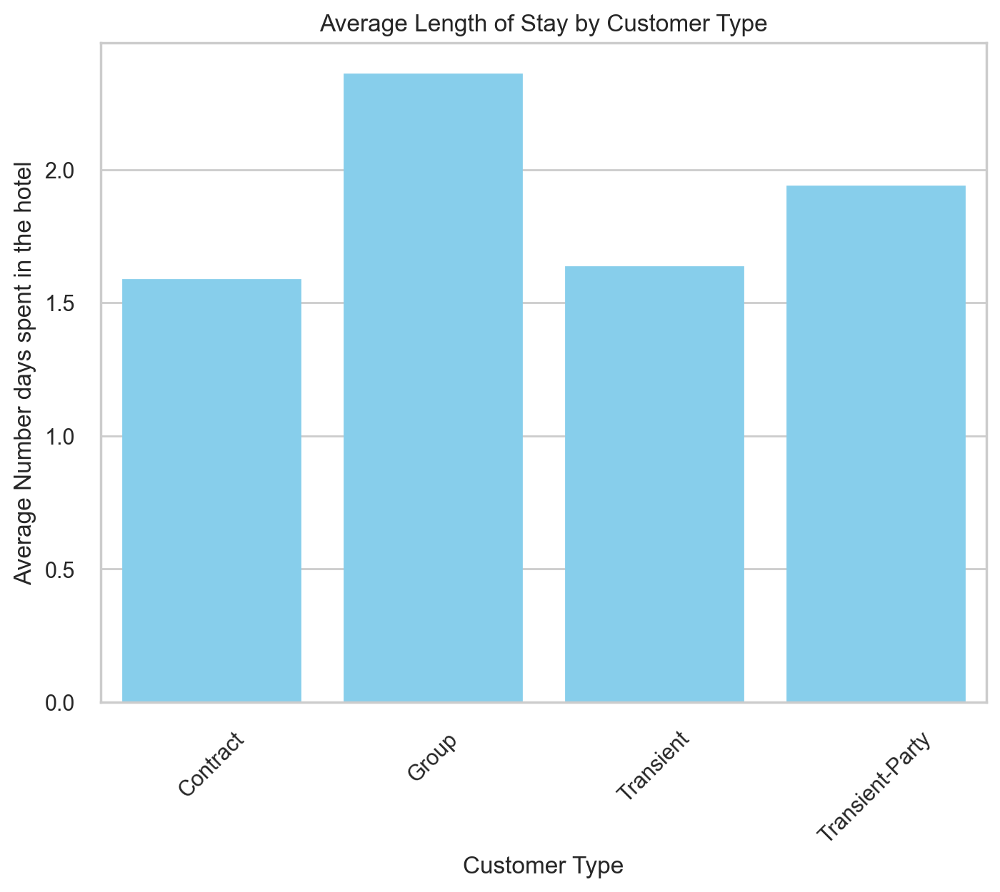

In [90]:
# Calculate the rate of special requests per customer type
special_requests_rate_customer = ds_new.groupby('CustomerType')['Length of Stay'].mean().reset_index()

# Plot the special requests rate
plt.figure(figsize=(8, 6))  # Adjust the size of the chart as needed
chart = sns.barplot(data=special_requests_rate_customer, x='CustomerType', y='Length of Stay', palette='Set2')
chart.set(title='Average Length of Stay by Customer Type')
chart.set(xlabel='Customer Type', ylabel='Average Number days spent in the hotel')

# Set the same color for all bars
for p in chart.patches:
    p.set_color('skyblue')

# Rotate the x-axis labels if needed
plt.xticks(rotation=45)

# Show the chart
plt.show()


## 5.  Data Normalization and Encoding<a class="anchor" id="normalization&encoding"></a>

#### Final feature Selection for Clustering

In [91]:
# Elements to drop
metrics_to_drop = ["ArrivalDateWeekNumber","ArrivalDateDayOfMonth",'Length of Stay','TotalBookings','Time in the System']

# Drop elements from the metric_features list
for element in metrics_to_drop:
    metric_features.remove(element)

# Verify the updated list
print(metric_features)

['LeadTime', 'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children', 'Babies', 'PreviousCancellations', 'PreviousBookingsNotCanceled', 'BookingChanges', 'DaysInWaitingList', 'ADR', 'RequiredCarParkingSpaces', 'TotalOfSpecialRequests']


In [92]:
# Elements to drop
nonmetrics_to_drop = ["Country","Region",'sub-region',"ArrivalDateMonth","ArrivalDateYear","ReservationStatusDate","dayoftheweek","BookingDate",'ArrivalDate','IsCanceled','ReservationStatus']

# Drop elements from the metric_features list
for element in nonmetrics_to_drop:
    non_metric_features.remove(element)

ds_new['IsCountryPRT'] = np.where(ds_new['Country'] == 'PRT', 1, 0)

non_metric_features.append('IsCountryPRT')

# Verify the updated list
print(non_metric_features)

['Meal', 'MarketSegment', 'DistributionChannel', 'IsRepeatedGuest', 'ReservedRoomType', 'AssignedRoomType', 'DepositType', 'Agent', 'Company', 'CustomerType', 'quarter', 'season', 'RoomChange', 'IsCountryPRT']


### 5.1 Normalization <a class="anchor" id="normalization"></a>

In [93]:
ds_for_normalization = ds_new.copy()

In [94]:
# Replace non-numeric values with NaN
ds_cleaned = ds_for_normalization[metric_features].apply(pd.to_numeric)

# Fill NaN values with zero
ds_cleaned = ds_cleaned.fillna(0)

# Create an instance of StandardScaler
scaler = StandardScaler()

# Fit the scaler to the cleaned data
scaler.fit(ds_cleaned)

# Transform the feature data to have zero mean and unit variance
X_scaled = scaler.transform(ds_cleaned)

# Convert the scaled data back to a DataFrame
ds_normalized_metric = pd.DataFrame(X_scaled, columns=metric_features,index=ds_for_normalization.index)

In [95]:
ds_normalized_metric

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests
0,-0.94,-0.90,-0.13,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,-2.68,-0.16,-0.70
1,-0.19,-0.90,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,-0.73,-0.16,0.58
2,-0.40,-0.90,1.26,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,-0.95,-0.16,0.58
3,-0.15,1.37,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,-0.73,-0.16,1.86
4,-0.08,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,-0.73,-0.16,0.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0.07,1.37,-1.52,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,0.52,-0.16,-0.70
78275,-0.22,1.37,1.96,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,0.41,-0.16,0.58
78276,-0.98,-0.90,0.57,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,1.98,-0.16,0.58
78277,-0.97,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,1.90,-0.16,0.58


### 5.2 Encoding<a class="anchor" id="encoding"></a>

In [96]:
ds_for_normalization[non_metric_features] = ds_for_normalization[non_metric_features].astype(str)

In [97]:
# Create OneHotEncoder object and fit on selected columns
encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(ds_for_normalization[non_metric_features])

# Transform categorical columns using the encoder
encoded_cols = encoder.transform(ds_for_normalization[non_metric_features]).toarray()

# Create new dataframe with encoded columns
encoded_ds = pd.concat([ds_for_normalization[non_metric_features].drop(ds_for_normalization[non_metric_features].columns, axis=1), pd.DataFrame(encoded_cols)], axis=1)

# Rename columns with encoded categories
new_cols = encoder.get_feature_names_out (ds_for_normalization[non_metric_features].columns)
encoded_ds.columns = list(ds_for_normalization[non_metric_features].columns.drop(ds_for_normalization[non_metric_features].columns)) + list(new_cols)

# Print encoded dataframe
encoded_ds

,Meal_BB,Meal_FB,Meal_HB,Meal_SC,MarketSegment_Aviation,MarketSegment_Complementary,MarketSegment_Corporate,MarketSegment_Direct,MarketSegment_Groups,MarketSegment_Offline TA/TO,...,quarter_3,quarter_4,season_Autumn,season_Spring,season_Summer,season_Winter,RoomChange_0,RoomChange_1,IsCountryPRT_0,IsCountryPRT_1
0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
1,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
2,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
3,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
4,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00
78275,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00
78276,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00
78277,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00


### 5.3 Merging <a class="anchor" id="merging"></a>

In [98]:
#Name the index
encoded_ds = encoded_ds.rename_axis('ID')
ds_normalized_metric = ds_normalized_metric.rename_axis('ID')

In [99]:
ds_normalized=pd.concat([ds_normalized_metric, encoded_ds],axis=1,sort=False)
ds_normalized

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,...,quarter_3,quarter_4,season_Autumn,season_Spring,season_Summer,season_Winter,RoomChange_0,RoomChange_1,IsCountryPRT_0,IsCountryPRT_1
ID,,,,,,,,,,,,,,,,,,,,,
0,-0.94,-0.90,-0.13,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
1,-0.19,-0.90,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
2,-0.40,-0.90,1.26,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
3,-0.15,1.37,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
4,-0.08,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0.07,1.37,-1.52,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00
78275,-0.22,1.37,1.96,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00
78276,-0.98,-0.90,0.57,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00


## 6.  PCA - Principal Component Analysis <a class="anchor" id="pca"></a>

In [100]:
# Fit the PCA algorithm to data 
pca = PCA().fit(ds_normalized_metric)

# Show the variance per component
pcaevr = ['{:f}'.format(item) for item in pca.explained_variance_ratio_]
pca_ds = pd.DataFrame({'Component': range(1, len(ds_normalized_metric.columns)+1),
                      'Variance explained': pcaevr,
                      'Cumulative variance explained': np.cumsum(pca.explained_variance_ratio_)})
pca_ds

,Component,Variance explained,Cumulative variance explained
0,1,0.142791,0.14
1,2,0.106373,0.25
2,3,0.093726,0.34
3,4,0.088610,0.43
4,5,0.082527,0.51
5,6,0.078507,0.59
6,7,0.073200,0.67
7,8,0.068110,0.73
8,9,0.066336,0.80
9,10,0.059631,0.86


(78279, 2)


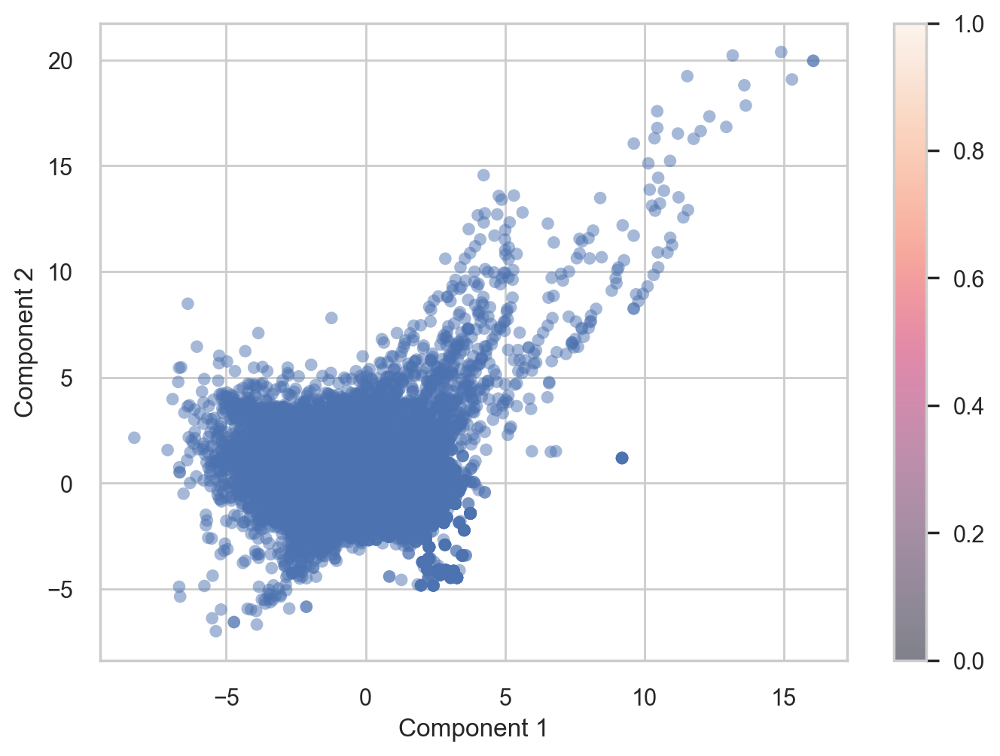

In [101]:
# Let's use PCA to visualization
pca2 = PCA(n_components = 2)
pca2.fit(ds_normalized_metric)
X_pca2 = pca2.transform(ds_normalized_metric)
print(X_pca2.shape)

# Scatter plot of the two Principal Components by the "target" to see if there is any pattern
plt.scatter(X_pca2[:, 0], X_pca2[:, 1], edgecolor='none', alpha=0.5, cmap='viridis')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar();

Text(0.5, 1.0, 'Explained variance by components')

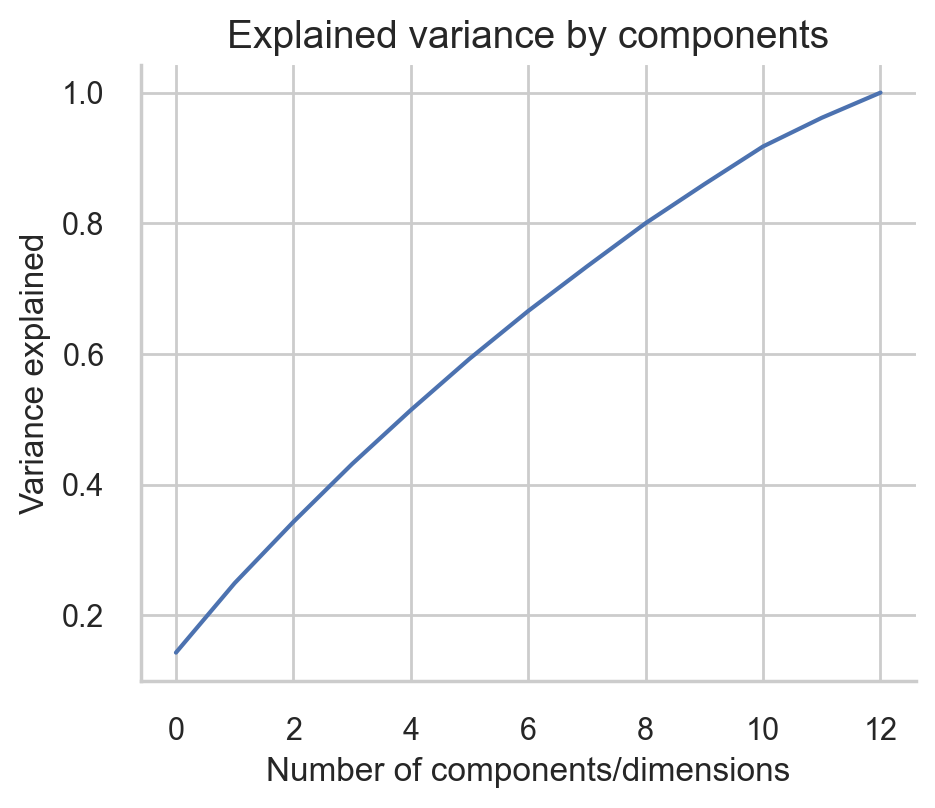

In [102]:
# Plot the cumulative explained variance

# Draw
fig , ax = plt.subplots(figsize=(5, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))

# Decoration
sns.despine()
plt.xlabel('Number of components/dimensions')
plt.ylabel('Variance explained')
plt.rc('axes', labelsize=subPlots_label_fontSize)
plt.title('Explained variance by components', fontsize=plots_Title_fontSize)

In [103]:
############### DEFINE PARAMS
top_k = 16
#select data based on percentile (top_q) or top-k features
top_q = .50
top_pc = 16
###############

# PCA factor loadings
selected_features = ds_normalized_metric.columns
df_c = pd.DataFrame(pca.components_, columns=selected_features).T

print("Factor Loadings for the 1. component \n(explains {0:.2f} of the variance)".format(pca_ds.iloc[0,0]))
print('='*40,'\n')
print('Top {} highest'.format(top_k))
print('-'*40)
print(df_c.iloc[:,0].sort_values(ascending=False)[:top_k], '\n')

print('Top {} lowest'.format(top_k))
print('-'*40)
print(df_c.iloc[:,0].sort_values()[:top_k])

Factor Loadings for the 1. component 
(explains 1.00 of the variance)

Top 16 highest
----------------------------------------
PreviousCancellations          0.38
LeadTime                       0.23
PreviousBookingsNotCanceled    0.21
DaysInWaitingList              0.17
BookingChanges                -0.10
Babies                        -0.10
RequiredCarParkingSpaces      -0.11
StaysInWeekNights             -0.18
StaysInWeekendNights          -0.20
Adults                        -0.30
Children                      -0.34
TotalOfSpecialRequests        -0.37
ADR                           -0.52
Name: 0, dtype: float64 

Top 16 lowest
----------------------------------------
ADR                           -0.52
TotalOfSpecialRequests        -0.37
Children                      -0.34
Adults                        -0.30
StaysInWeekendNights          -0.20
StaysInWeekNights             -0.18
RequiredCarParkingSpaces      -0.11
Babies                        -0.10
BookingChanges                -0.10


## 7. Clustering <a class="anchor" id="clustering"></a>

### 7.1 Clustering with PCA <a class="anchor" id="7.1"></a>

In [104]:
# Apply the dimension reduction to the dataset (for 20 components)
pca_reduced = PCA(n_components = 13)
pca_reduced.fit(ds_normalized_metric)
X_pca_reduced = pca_reduced.transform(ds_normalized_metric) 
print(X_pca_reduced.shape)

(78279, 13)


In [105]:
## Apply the Elbow method to select K
#km = KMeans()
#visualizer = KElbowVisualizer(km, k=(1,15), random_state=123)
#visualizer.fit(X_pca_reduced)
#visualizer.show() 

In [106]:
## Select K based on the Silhouette method
## ATTENTION! Depending on the computer this can take long time to run (more than 10 minutes)
#sil = []
#
## Dissimilarity can only be measured in more than 1 partition, therefore it starts on K=2
#for k in range(2, 12):
#  km = KMeans(n_clusters = k, random_state=123).fit(ds_normalized_metric)
#  labels = km.labels_
#  sil.append(silhouette_score(ds_normalized_metric, labels, metric = 'euclidean'))
#
#
## Show Results
## Draw
#fig , ax = plt.subplots(figsize=(5, 4))
#plt.plot(range(2, 12), sil, 'bx-')
## Decoration
#sns.despine()
#fmt = "{x:,.2f}"
#tick = ticker.StrMethodFormatter(fmt)
#ax.yaxis.set_major_formatter(tick)
#plt.xlabel('K')
#plt.ylabel('Silhouette score')
#plt.rc('axes', labelsize=subPlots_label_fontSize)
#ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
#plt.title('Silhouette method - Reduced dimensionality', fontsize=plots_Title_fontSize);

The Elbow method indicates K should be 6, but the Silhouette method points to higher values such 17. However, since large number of clusters are not very helpful for marketing pruposes, let's select K as 6

In [107]:
# Apply the K-Means for K=6
K=6
kmeans = KMeans(n_clusters=K, random_state=123)
allDistances = kmeans.fit_transform(X_pca_reduced)
y_kmeans = kmeans.predict(X_pca_reduced)

In [108]:
## Visualize Silhouette - see https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html
#visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
#visualizer.fit(X_pca_reduced)
#visualizer.show()

In [109]:
plots_barTexts_fontSize = 8

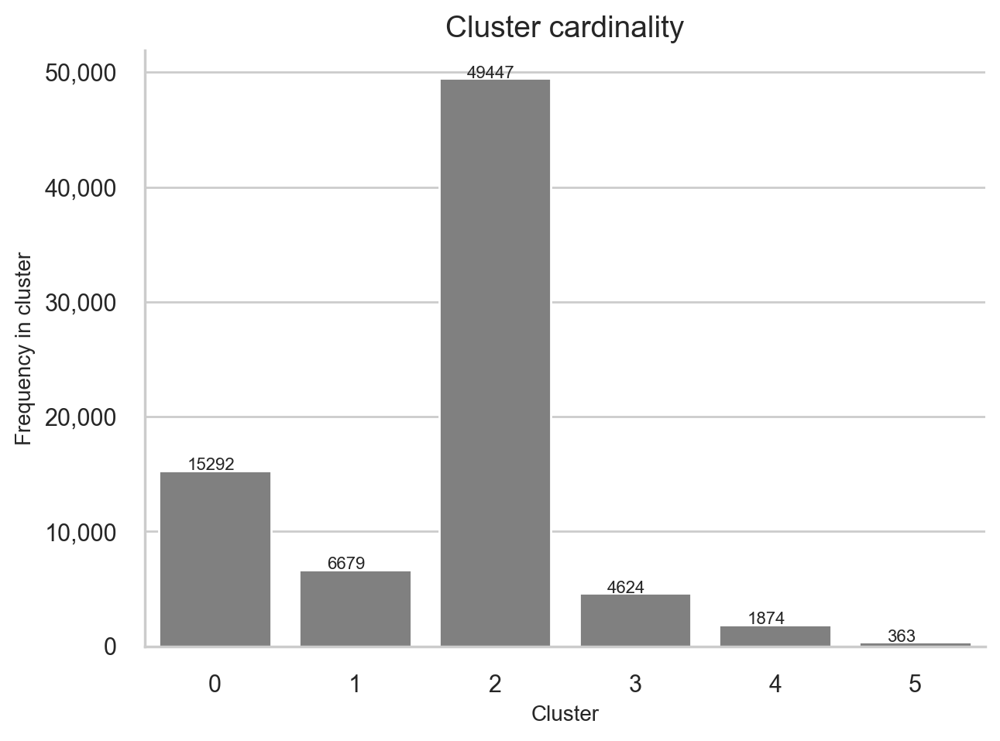

In [110]:
# Plot clusters cardinality 

# Count observations per cluster
freqByCluster = ds_for_normalization.groupby(y_kmeans).size()

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.countplot(x=y_kmeans, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(freqByCluster):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster cardinality", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Frequency in cluster")
plt.rc('axes', labelsize=subPlots_label_fontSize)

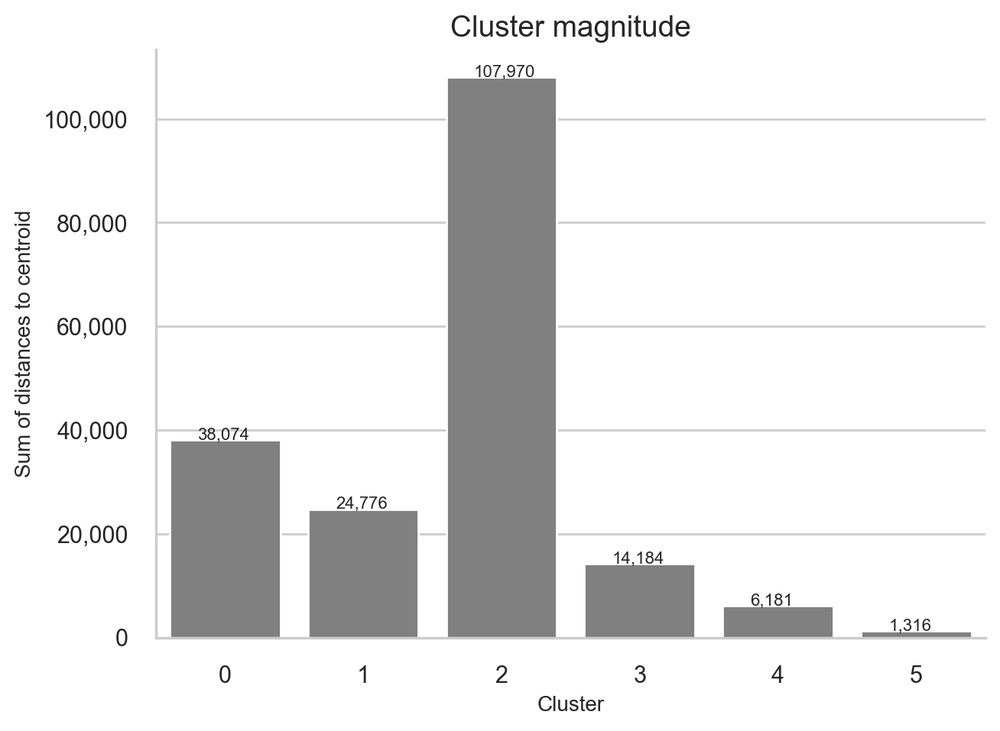

In [111]:
# Plot clusters magnitude

# Compute Magnitude
ds_normalized_metric['distanceToCentroid'] = np.min(allDistances,axis=1)
magnitude = ds_normalized_metric['distanceToCentroid'].groupby(y_kmeans).sum()
ds_normalized_metric = ds_normalized_metric.drop(columns=['distanceToCentroid'])

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.barplot(x=magnitude.index, y=magnitude.values, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(magnitude):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data:,.0f}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Sum of distances to centroid")
plt.rc('axes', labelsize=subPlots_label_fontSize)

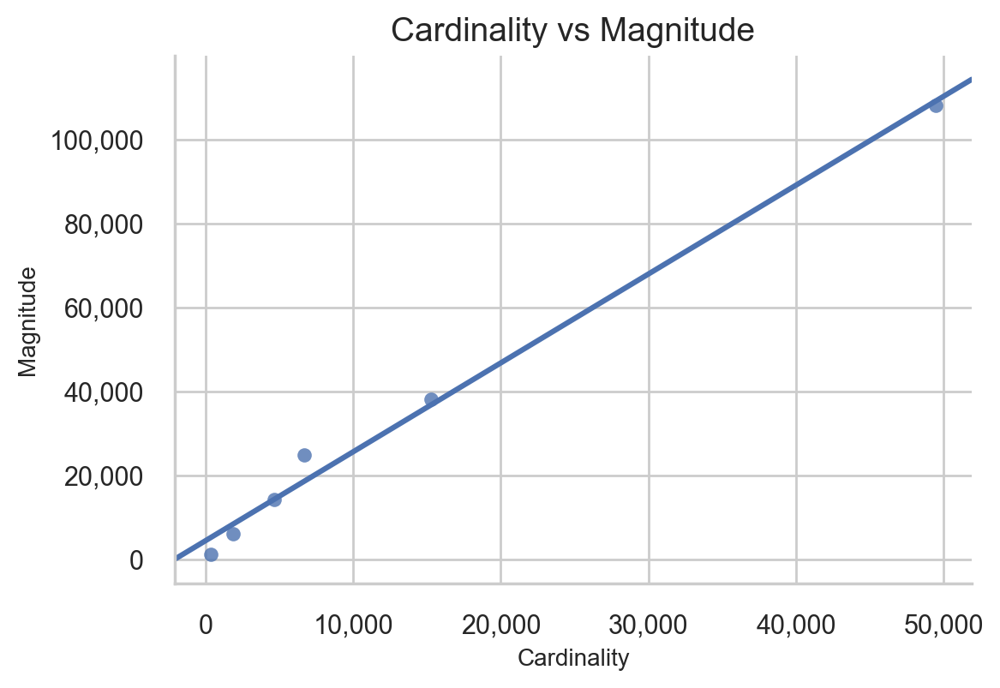

In [112]:
# Plot cardinality vs magnitude

# Draw
fig, ax = plt.subplots(figsize=(6,4))
g = sns.regplot(x=freqByCluster, y=magnitude, scatter=True, seed=123,truncate=False, ci=None)

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.xaxis.set_major_formatter(tick)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Cardinality vs Magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cardinality")
plt.ylabel("Magnitude")
plt.rc('axes', labelsize=subPlots_label_fontSize)

Cardinality is correlated to magnitude, therefore no major anomalies seems to exist in clusters.

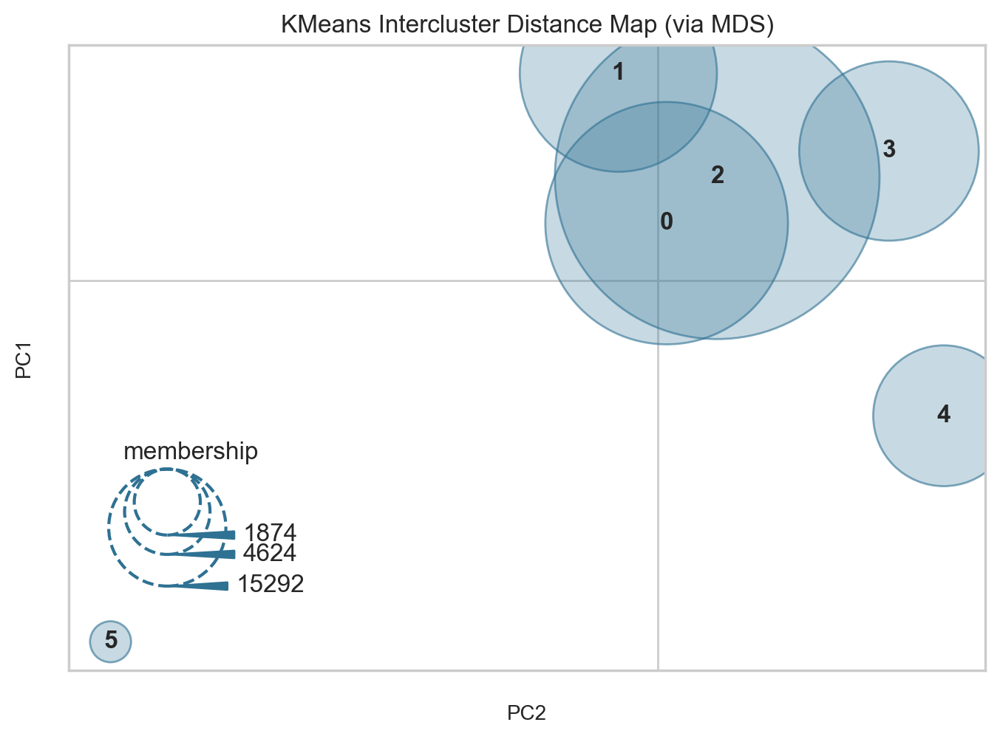

<AxesSubplot: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [113]:
# Visualizing the clusters sizes and distances in 2D
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X_pca_reduced)
visualizer.show()

Circles represent the clusters (0 to 5). Even at two dimensions it is possible to see that although the two components only represent around 26% of the variance, some distance between clusters seems to exist.

In [114]:
# Create a dataframe with the weights per component
wheightsDF = pd.DataFrame(pca.components_,columns=ds_normalized_metric.columns)
wheightsDF

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests
0,0.23,-0.20,-0.18,-0.30,-0.34,-0.10,0.38,0.21,-0.10,0.17,-0.52,-0.11,-0.37
1,-0.46,-0.20,-0.33,-0.35,0.15,0.14,0.11,0.46,0.20,-0.24,0.01,0.34,0.19
2,0.31,0.24,0.28,0.31,0.13,0.07,0.57,0.49,-0.05,0.03,0.11,0.14,0.23
3,-0.11,0.49,0.45,-0.31,-0.19,0.24,-0.11,0.04,0.47,-0.06,-0.32,-0.11,0.05
4,0.29,-0.31,-0.00,-0.12,0.33,0.35,0.01,-0.11,0.46,0.56,0.12,0.11,-0.09
5,0.08,-0.18,-0.19,0.37,-0.53,0.60,-0.05,-0.11,-0.01,-0.09,-0.17,0.15,0.29
6,-0.03,0.05,0.15,0.07,-0.29,-0.44,-0.19,-0.01,0.07,0.32,-0.09,0.73,0.05
7,-0.40,0.08,0.16,-0.13,-0.00,0.28,-0.10,0.17,-0.55,0.58,0.01,-0.11,0.10
8,0.12,0.30,-0.02,-0.13,0.24,0.38,0.04,-0.22,-0.33,-0.23,-0.06,0.49,-0.47
9,-0.12,0.59,-0.64,0.21,-0.08,-0.03,0.06,0.04,0.22,0.28,0.12,-0.08,-0.14


In [115]:
# Study the weights of component 14
comp = abs(wheightsDF.iloc[12])  ## index 12 is component 14
comp = comp.sort_values(ascending=False)
comp

ADR                           0.67
Adults                        0.50
Children                      0.46
LeadTime                      0.25
PreviousCancellations         0.10
TotalOfSpecialRequests        0.08
StaysInWeekendNights          0.08
BookingChanges                0.07
PreviousBookingsNotCanceled   0.05
Babies                        0.03
DaysInWaitingList             0.03
StaysInWeekNights             0.02
RequiredCarParkingSpaces      0.01
Name: 12, dtype: float64

##### 7.1.1 Cluster Analysis

In [116]:
from sklearn.metrics import calinski_harabasz_score

def calinski_harabasz_index(X, labels):
    # Calculate Calinski-Harabasz index
    calinski_harabasz_index = calinski_harabasz_score(X, labels)

    return calinski_harabasz_index

calinski_harabasz_index(X_pca_reduced, y_kmeans)

8814.551317876334

### 7.2 Clustering without PCA <a class="anchor" id="clustering"></a>

#### 7.2.1 K-means

In [117]:
##### Defining the number of clusters 
range_clusters = list(range(2,11))
range_clusters

[2, 3, 4, 5, 6, 7, 8, 9, 10]

In [118]:
#inertia = [] #low value of inertia means that we have high density in a cluster 
#for n_clus in range_clusters:  # iterate over desired ncluster range
#    kmclust = KMeans(n_clusters = n_clus, init='k-means++', n_init=200, random_state=42)
#    # fit the clusterer
#    kmclust.fit(ds_normalized_metric)
#    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [119]:
## The inertia plot
#plt.figure(figsize=(9,5))
#plt.plot(inertia)
#plt.ylabel("Inertia: SSw")
#plt.xlabel("Number of clusters")
#plt.title("Inertia plot over clusters", size=15)
#plt.show()

In [120]:
## Adapted from:
## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py
#
#
## if b is low and a is high, the Silhouette Coefficient is low and  the representation of our values is quite poor, because our data points are closer to the nearest cluster and not the cluster they are currently in 
## also, adding clusters also brings dow the Silhouette Coefficient
#
## Storing average silhouette metric
#avg_silhouette = []
#for nclus in range_clusters:
#    # Skip nclus == 1
#    if nclus == 1:
#        continue
#    
#    # Create a figure
#    fig = plt.figure(figsize=(13, 7))
#
#    # Initialize the KMeans object with n_clusters value and a random generator
#    # seed of 10 for reproducibility.
#    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=200, random_state=42)
#    cluster_labels = kmclust.fit_predict(ds_normalized_metric)
#
#    # The silhouette_score gives the average value for all the samples.
#    # This gives a perspective into the density and separation of the formed clusters
#    silhouette_avg = silhouette_score(ds_normalized_metric, cluster_labels)
#    avg_silhouette.append(silhouette_avg)
#    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")
#
#    # Compute the silhouette scores for each sample
#    sample_silhouette_values = silhouette_samples(ds_normalized_metric, cluster_labels)
#
#    y_lower = 10
#    for i in range(nclus):
#        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
#        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#        ith_cluster_silhouette_values.sort()
#        
#        # Get y_upper to demarcate silhouette y range size
#        size_cluster_i = ith_cluster_silhouette_values.shape[0]
#        y_upper = y_lower + size_cluster_i
#        
#        # Filling the silhouette
#        color = cm.nipy_spectral(float(i) / nclus)
#        plt.fill_betweenx(np.arange(y_lower, y_upper),
#                          0, ith_cluster_silhouette_values,
#                          facecolor=color, edgecolor=color, alpha=0.7)
#
#        # Label the silhouette plots with their cluster numbers at the middle
#        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#
#        # Compute the new y_lower for next plot
#        y_lower = y_upper + 10  # 10 for the 0 samples
#
#    plt.title("The silhouette plot for the various clusters.")
#    plt.xlabel("The silhouette coefficient values")
#    plt.ylabel("Cluster label")
#
#    # The vertical line for average silhouette score of all the values
#    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#    
#    # The silhouette coefficient can range from -1, 1
#    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
#    plt.xlim([xmin, xmax])
#    
#    # The (nclus+1)*10 is for inserting blank space between silhouette
#    # plots of individual clusters, to demarcate them clearly.
#    plt.ylim([0, len(ds_normalized_metric) + (nclus + 1) * 10])
#
#    plt.yticks([])  # Clear the yaxis labels / ticks
#    plt.xticks(np.arange(xmin, xmax, 0.1))

In [121]:
## The average silhouette plot
## The inertia plot
#plt.figure(figsize=(9,5))
#plt.plot(avg_silhouette)
#plt.ylabel("Average silhouette")
#plt.xlabel("Number of clusters")
#plt.title("Average silhouette plot over clusters", size=15)
#plt.show()

In [122]:
## Apply the Elbow method to select K
#km_x = KMeans(init='k-means++', n_init=200, random_state=42)
#visualizer_x = KElbowVisualizer(km_x, k=(1,15), random_state=42)
#visualizer_x.fit(ds_normalized_metric)
#visualizer_x.show() 

In [123]:
# final cluster solution
number_clusters =  7
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=200, random_state=42)
km_labels = kmclust.fit_predict(ds_normalized_metric)
km_labels

array([0, 6, 0, ..., 6, 6, 2])

In [124]:
# Characterizing the final clusters
ds_clustered = pd.concat((ds_normalized, pd.Series(km_labels, name='labels')), axis=1)
ds_clustered.groupby('labels').mean()

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,...,quarter_3,quarter_4,season_Autumn,season_Spring,season_Summer,season_Winter,RoomChange_0,RoomChange_1,IsCountryPRT_0,IsCountryPRT_1
labels,,,,,,,,,,,,,,,,,,,,,
0,-0.04,-0.19,-0.23,-0.35,-0.24,-0.07,-0.25,-0.03,-0.05,-0.13,...,0.25,0.21,0.26,0.30,0.27,0.18,0.90,0.10,0.52,0.48
1,0.90,-0.20,-0.24,-0.13,-0.24,-0.07,3.45,0.57,-0.27,0.17,...,0.48,0.28,0.38,0.10,0.33,0.20,0.98,0.02,0.01,0.99
2,-0.18,0.18,0.18,0.04,3.57,-0.07,-0.24,-0.08,0.17,-0.17,...,0.41,0.15,0.13,0.24,0.45,0.18,0.85,0.15,0.83,0.17
3,-0.49,-0.15,-0.24,0.08,0.35,-0.07,-0.14,0.43,0.28,-0.17,...,0.37,0.17,0.17,0.24,0.38,0.21,0.86,0.14,0.65,0.35
4,-0.50,0.12,0.14,0.25,0.43,14.54,-0.19,-0.05,1.23,-0.17,...,0.36,0.23,0.24,0.20,0.33,0.24,0.83,0.17,0.64,0.36
5,0.74,-0.30,0.12,-0.05,-0.24,-0.07,-0.25,-0.08,0.04,5.92,...,0.13,0.36,0.37,0.33,0.14,0.16,0.87,0.13,0.25,0.75
6,-0.09,0.34,0.39,0.56,-0.25,-0.07,-0.25,-0.08,0.05,-0.17,...,0.35,0.18,0.21,0.29,0.37,0.13,0.92,0.08,0.86,0.14


In [125]:
cluster_counts = ds_clustered['labels'].value_counts().sort_index()

print(cluster_counts)

0    39432
1     5263
2     4649
3     1870
4      363
5     1623
6    25079
Name: labels, dtype: int64


##### 7.2.1.1 Cluster Analysis

In [126]:
from sklearn.metrics import calinski_harabasz_score

def calinski_harabasz_index(X, labels):
    # Calculate Calinski-Harabasz index
    calinski_harabasz_index = calinski_harabasz_score(X, labels)

    return calinski_harabasz_index

calinski_harabasz_index(ds_clustered, km_labels)

13457.461528911379

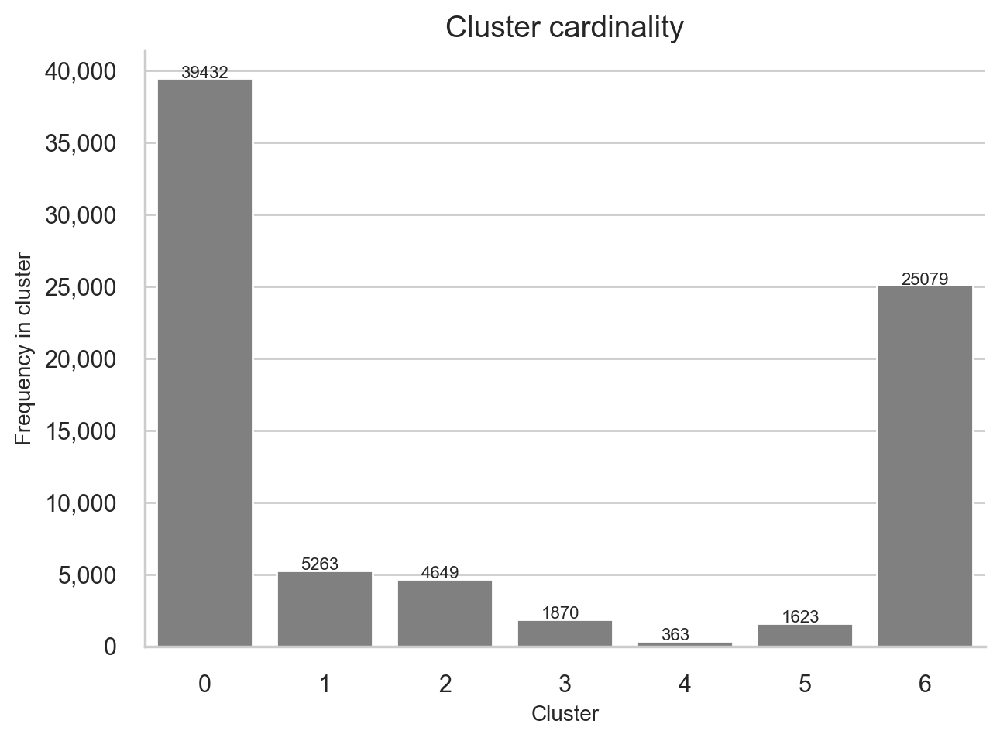

In [127]:
# Plot clusters cardinality 

# Count observations per cluster
freqByCluster = ds_normalized_metric.groupby(km_labels).size()

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.countplot(x=km_labels, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(freqByCluster):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster cardinality", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Frequency in cluster")
plt.rc('axes', labelsize=subPlots_label_fontSize)

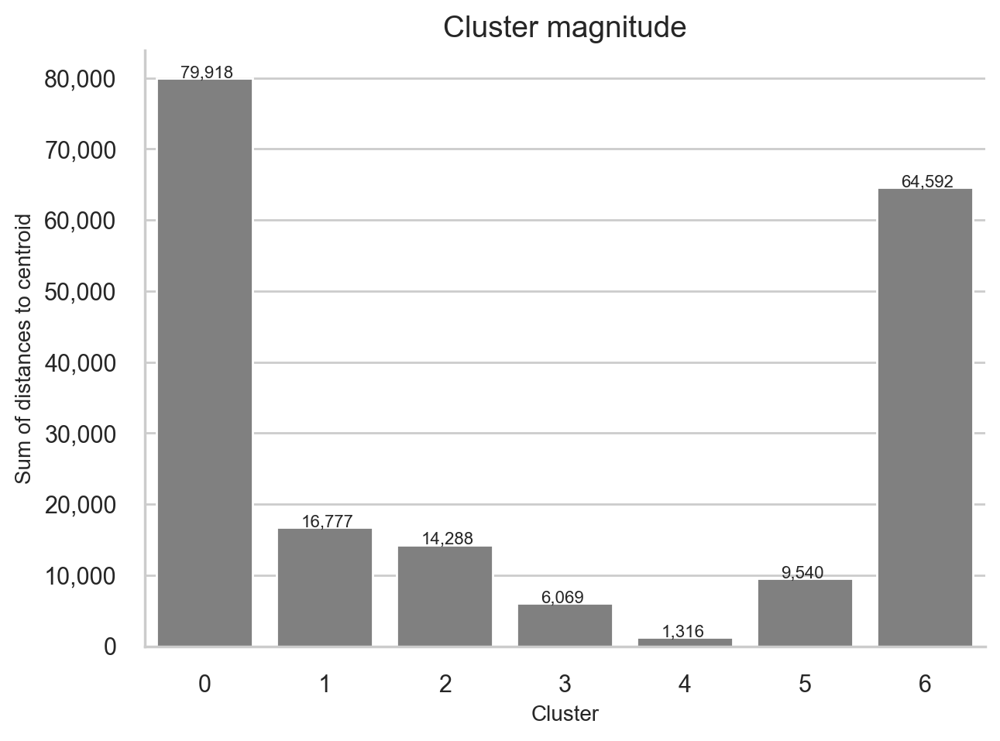

In [128]:
# Plot clusters magnitude

# Compute Magnitude
ds_normalized_metric['distanceToCentroid'] = np.min(allDistances,axis=1)
magnitude = ds_normalized_metric['distanceToCentroid'].groupby(km_labels).sum()
ds_normalized_metric = ds_normalized_metric.drop(columns=['distanceToCentroid'])

# Draw
fig, ax = plt.subplots(figsize=(7,5))
g = sns.barplot(x=magnitude.index, y=magnitude.values, color='grey')

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick)
for index,data in enumerate(magnitude):
    plt.text(x=index-0.2 , y=data+50 , s=f"{data:,.0f}" , fontdict=dict(fontsize=plots_barTexts_fontSize))
sns.despine()
plt.title("Cluster magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cluster")
plt.ylabel("Sum of distances to centroid")
plt.rc('axes', labelsize=subPlots_label_fontSize)

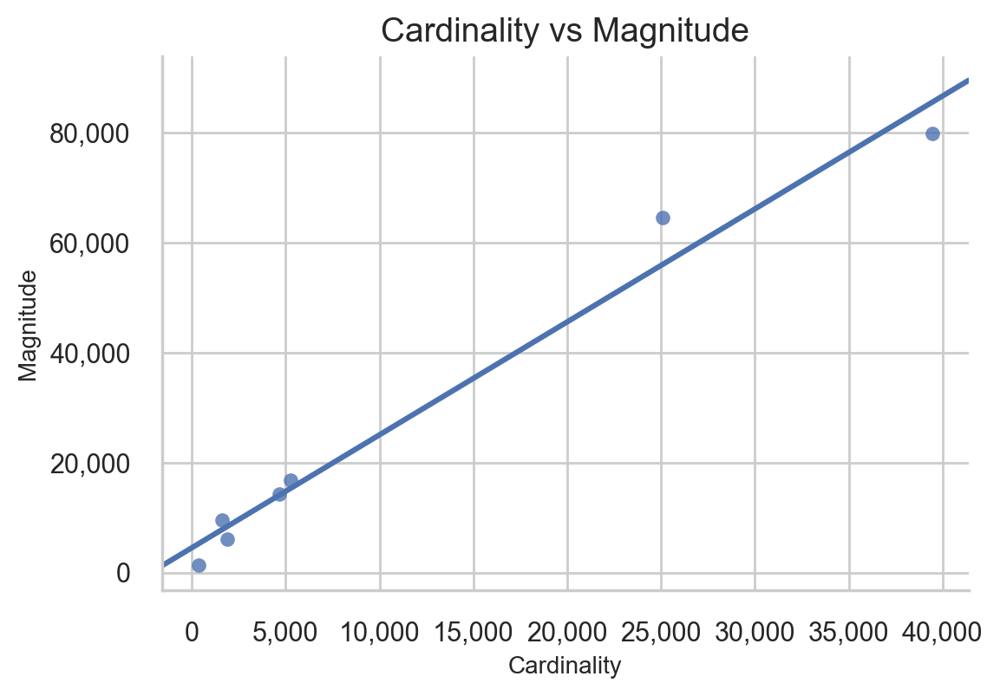

In [129]:
# Plot cardinality vs magnitude

# Draw
fig, ax = plt.subplots(figsize=(6,4))
g = sns.regplot(x=freqByCluster, y=magnitude, scatter=True, seed=123,truncate=False, ci=None)

# Decoration
fmt = "{x:,.0f}"
tick = ticker.StrMethodFormatter(fmt)
ax.xaxis.set_major_formatter(tick)
ax.yaxis.set_major_formatter(tick)
sns.despine()
plt.title("Cardinality vs Magnitude", fontsize=plots_Title_fontSize)
plt.xlabel("Cardinality")
plt.ylabel("Magnitude")
plt.rc('axes', labelsize=subPlots_label_fontSize)

In [130]:
# Visualizing the clusters sizes and distances in 2D
#visualizer = InterclusterDistance(kmeans)
#visualizer.fit(ds_normalized_metric)
#visualizer.show()

#### 7.2.2 KMedoids

In [131]:
#ds_normalized_metric

In [132]:
#inertia = []
#
#for n_clus in range_clusters:
#    kmedoids = KMedoids(n_clusters=n_clus, random_state=42)
#    kmedoids.fit(ds_normalized_metric)
#    inertia.append(kmedoids.inertia_)

In [133]:
# The inertia plot
#plt.figure(figsize=(9,5))
#plt.plot(inertia)
#plt.ylabel("Inertia: SSw")
#plt.xlabel("Number of clusters")
#plt.title("Inertia plot over clusters", size=15)
#plt.show()

In [134]:
## Storing average silhouette metric
#avg_silhouette = []
#
#for nclus in range_clusters:
#    # Skip nclus == 1
#    if nclus == 1:
#        continue
#
#    # Create a figure
#    fig = plt.figure(figsize=(13, 7))
#
#    # Initialize the KMedoids object with n_clusters value and a random generator
#    # seed of 42 for reproducibility.
#    kmedoids = KMedoids(n_clusters=nclus, random_state=42)
#    cluster_labels = kmedoids.fit_predict(ds_normalized_metric)
#
#    # The silhouette_score gives the average value for all the samples.
#    # This gives a perspective into the density and separation of the formed clusters
#    silhouette_avg = silhouette_score(ds_normalized_metric, cluster_labels)
#    avg_silhouette.append(silhouette_avg)
#    print(f"For n_clusters = {nclus}, the average silhouette_score is: {silhouette_avg}")
#
#    # Compute the silhouette scores for each sample
#    sample_silhouette_values = silhouette_samples(ds_normalized_metric, cluster_labels)
#
#    y_lower = 10
#    for i in range(nclus):
#        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
#        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#        ith_cluster_silhouette_values.sort()
#
#        # Get y_upper to demarcate silhouette y range size
#        size_cluster_i = ith_cluster_silhouette_values.shape[0]
#        y_upper = y_lower + size_cluster_i
#
#        # Filling the silhouette
#        color = cm.nipy_spectral(float(i) / nclus)
#        plt.fill_betweenx(np.arange(y_lower, y_upper),
#                          0, ith_cluster_silhouette_values,
#                          facecolor=color, edgecolor=color, alpha=0.7)
#
#        # Label the silhouette plots with their cluster numbers at the middle
#        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#
#        # Compute the new y_lower for the next plot
#        y_lower = y_upper + 10  # 10 for the 0 samples
#
#    plt.title("The silhouette plot for the various clusters.")
#    plt.xlabel("The silhouette coefficient values")
#    plt.ylabel("Cluster label")
#
#    # The vertical line for the average silhouette score of all the values
#    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#
#    # The silhouette coefficient can range from -1 to 1
#    xmin, xmax = np.round(sample_silhouette_values.min() - 0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
#    plt.xlim([xmin, xmax])
#
#    # The (nclus+1)*10 is for inserting blank space between silhouette
#    # plots of individual clusters, to demarcate them clearly.
#    plt.ylim([0, len(ds_normalized_metric) + (nclus + 1) * 10])
#
#    plt.yticks([])  # Clear the y-axis labels / ticks
#    plt.xticks(np.arange(xmin, xmax, 0.1))
#
#    plt.show()

In [135]:
## The average silhouette plot
## The inertia plot
#plt.figure(figsize=(9,5))
#plt.plot(avg_silhouette)
#plt.ylabel("Average silhouette")
#plt.xlabel("Number of clusters")
#plt.title("Average silhouette plot over clusters", size=15)
#plt.show()

In [136]:
# Apply the Elbow method to select K
#km_x = KMedoids(random_state=42)
#visualizer_x = KElbowVisualizer(km_x, k=(1,10), random_state=42)
#visualizer_x.fit(ds_normalized_metric)
#visualizer_x.show()

In [137]:
# final cluster solution
number_clusters =  7
kmclust_medoids = KMedoids(n_clusters=number_clusters, random_state=42)
km_labels_medoids = kmclust_medoids.fit_predict(ds_normalized_metric)
km_labels_medoids

array([4, 2, 2, ..., 1, 1, 6], dtype=int64)

In [138]:
# Characterizing the final clusters
ds_clustered_medoids = pd.concat((ds_normalized, pd.Series(km_labels_medoids, name='labels')), axis=1)
#ds_clustered_medoids.groupby('labels').mean()

##### 7.2.2.1 Cluster Analysis

In [139]:
# Cluster Analysis

from sklearn.metrics import calinski_harabasz_score

def calinski_harabasz_index(X, labels):
    # Calculate Calinski-Harabasz index
    calinski_harabasz_index = calinski_harabasz_score(X, labels)

    return calinski_harabasz_index

calinski_harabasz_index(ds_clustered_medoids, km_labels_medoids)

5835.808778583609


## 8. Summary <a class="anchor" id="conclusion"></a>

### 8.1 Cluster Kmeans Summary <a class="anchor" id="Summary"></a>

In [140]:
# For the Clusters Visualizations

X = ds_new
X_std = ds_normalized_metric
X['cluster'] = kmclust.labels_
X_std['cluster'] = kmclust.labels_
km = kmclust


# Data preparation for visualizations

X_mean = pd.concat([pd.DataFrame(X.mean().drop('cluster'), columns=['mean']), 
                   X.groupby('cluster').mean().T], axis=1)

X_dev_rel = X_mean.apply(lambda x: round((x-x['mean'])/x['mean'],2)*100, axis = 1)
X_dev_rel.drop(columns=['mean'], inplace=True)
X_mean.drop(columns=['mean'], inplace=True)

X_std_mean = pd.concat([pd.DataFrame(X_std.mean().drop('cluster'), columns=['mean']), 
                   X_std.groupby('cluster').mean().T], axis=1)

X_std_dev_rel = X_std_mean.apply(lambda x: round((x-x['mean'])/x['mean'],2)*100, axis = 1)
X_std_dev_rel.drop(columns=['mean'], inplace=True)
X_std_mean.drop(columns=['mean'], inplace=True)

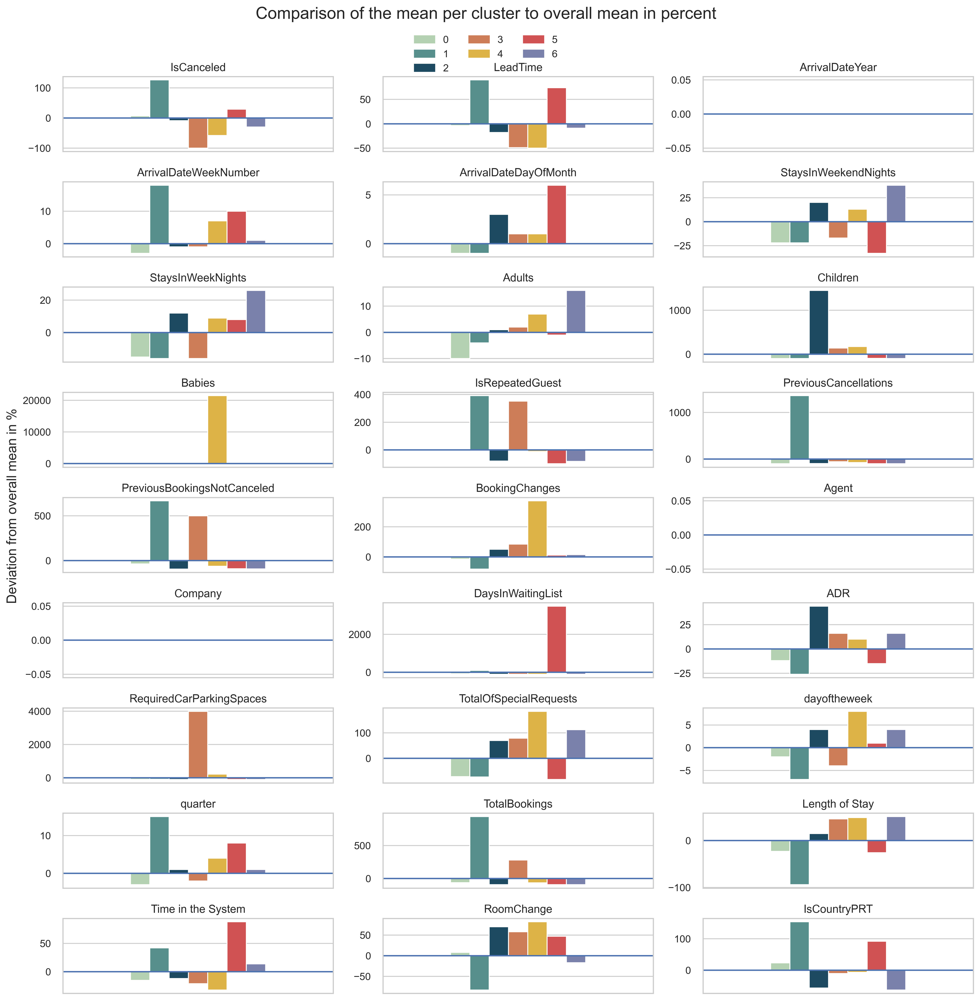

In [141]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#cd7e59', '#ddb247', '#d15252','#7a82ab','#e39527','#458f8f']

import matplotlib.patches as mpatches
def cluster_comparison_bar(X_comparison, colors, deviation=True ,title="Cluster results"):
    
    features = X_comparison.index
    ncols = 3
    # calculate number of rows
    nrows = len(features) // ncols + (len(features) % ncols > 0)
    # set figure size
    fig = plt.figure(figsize=(15,15), dpi=200)
    #interate through every feature
    for n, feature in enumerate(features):
        # create chart
        ax = plt.subplot(nrows, ncols, n + 1)
        X_comparison[X_comparison.index==feature].plot(kind='bar', ax=ax, title=feature, 
                                                             color=colors[0:X.cluster.nunique()],
                                                             legend=False
                                                            )
        plt.axhline(y=0)
        x_axis = ax.axes.get_xaxis()
        x_axis.set_visible(False)

    c_labels = X_comparison.columns.to_list()
    c_colors = colors[0:8]
    mpats = [mpatches.Patch(color=c, label=l) for c,l in list(zip(colors[0:X.cluster.nunique()],
                                                                  X_comparison.columns.to_list()))]

    fig.legend(handles=mpats,
               ncol=ncols,
               loc="upper center",
               fancybox=True,
               bbox_to_anchor=(0.5, 0.98)
              )
    axes = fig.get_axes()
    
    fig.suptitle(title, fontsize=18, y=1)
    fig.supylabel('Deviation from overall mean in %')
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()
    
cluster_comparison_bar(X_dev_rel, cluster_colors, title="Comparison of the mean per cluster to overall mean in percent")


In [142]:

colors = ['#9EBD6E','#81a094','#775b59','#32161f', '#946846', '#E3C16F', '#fe938c', '#E6B89C','#EAD2AC',
          '#DE9E36', '#4281A4','#37323E','#95818D'
         ]

fig = plt.figure(figsize=(30,15), dpi=200)
X_dev_rel.T.plot(kind='bar', 
                       ax=fig.add_subplot(), 
                       title="Cluster characteristics", 
                       color=colors,
                       xlabel="Cluster",
                       ylabel="Deviation from overall mean in %"
                      )
plt.axhline(y=0, linewidth=1, ls='--', color='black')
plt.legend(bbox_to_anchor=(1.04,1))
fig.autofmt_xdate(rotation=0)
plt.tight_layout()
plt.show()

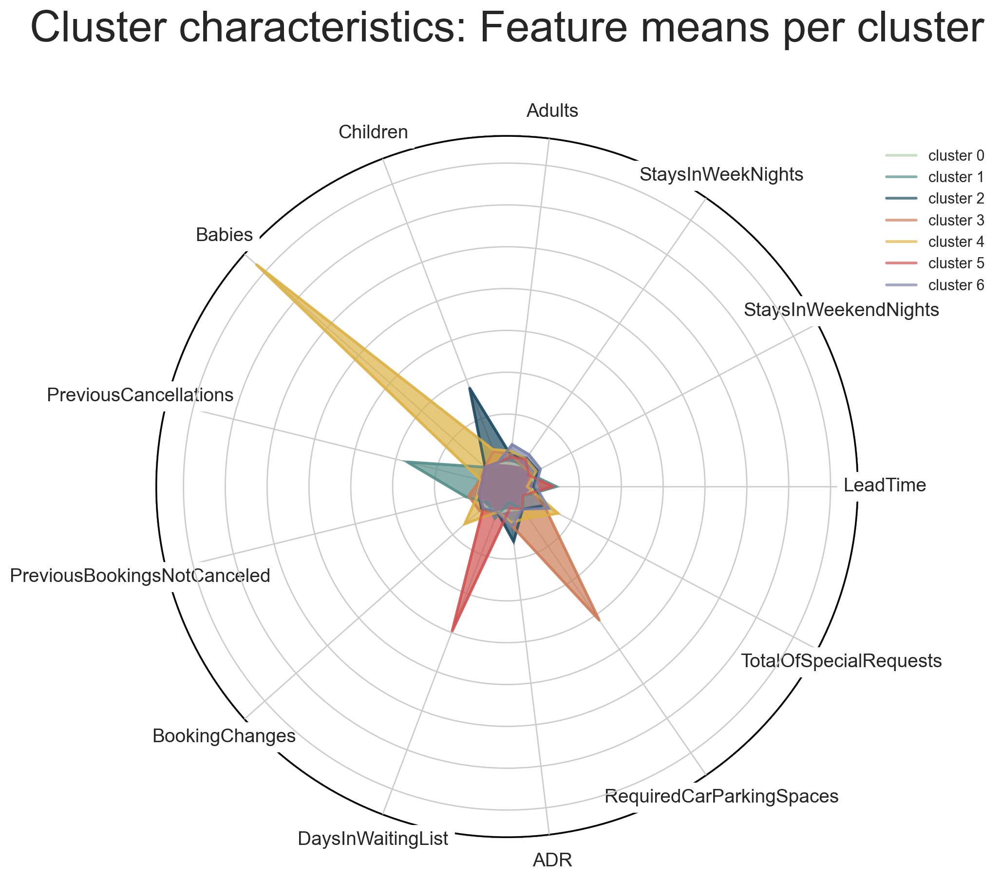

In [143]:
class Radar(object):
    def __init__(self, figure, title, labels, rect=None):
        if rect is None:
            rect = [0.05, 0.05, 0.9, 0.9]

        self.n = len(title)
        self.angles = np.arange(0, 360, 360.0/self.n)
        
        self.axes = [figure.add_axes(rect, projection='polar', label='axes%d' % i) for i in range(self.n)]
        self.ax = self.axes[0]
        self.ax.set_thetagrids(self.angles, labels=title, fontsize=14, backgroundcolor="white",zorder=999) # Feature names
        self.ax.set_yticklabels([])
        
        for ax in self.axes[1:]:
            ax.xaxis.set_visible(False)
            ax.set_yticklabels([])
            ax.set_zorder(-99)

        for ax, angle, label in zip(self.axes, self.angles, labels):
            ax.spines['polar'].set_color('black')
            ax.spines['polar'].set_zorder(-99)
                     
    def plot(self, values, *args, **kw):
        angle = np.deg2rad(np.r_[self.angles, self.angles[0]])
        values = np.r_[values, values[0]]
        self.ax.plot(angle, values, *args, **kw)
        kw['label'] = '_noLabel'
        self.ax.fill(angle, values,*args,**kw)

fig = plt.figure(figsize=(8, 8))
no_features = len(km.feature_names_in_)
radar = Radar(fig, km.feature_names_in_, np.unique(km.labels_))

for k in range(0,km.n_clusters):
    cluster_data = X_std_mean[k].values.tolist()
    radar.plot(cluster_data,  '-', lw=2, color=cluster_colors[k], alpha=0.7, label='cluster {}'.format(k))

radar.ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
radar.ax.set_title("Cluster characteristics: Feature means per cluster", size=32, pad=70)
plt.show()

## https://towardsdatascience.com/best-practices-for-visualizing-your-cluster-results-20a3baac7426

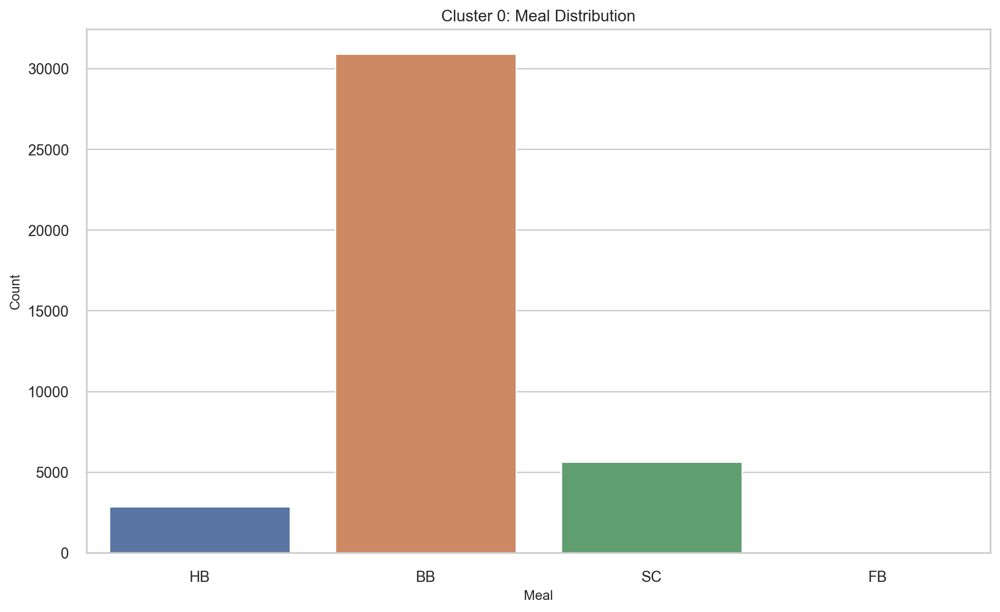

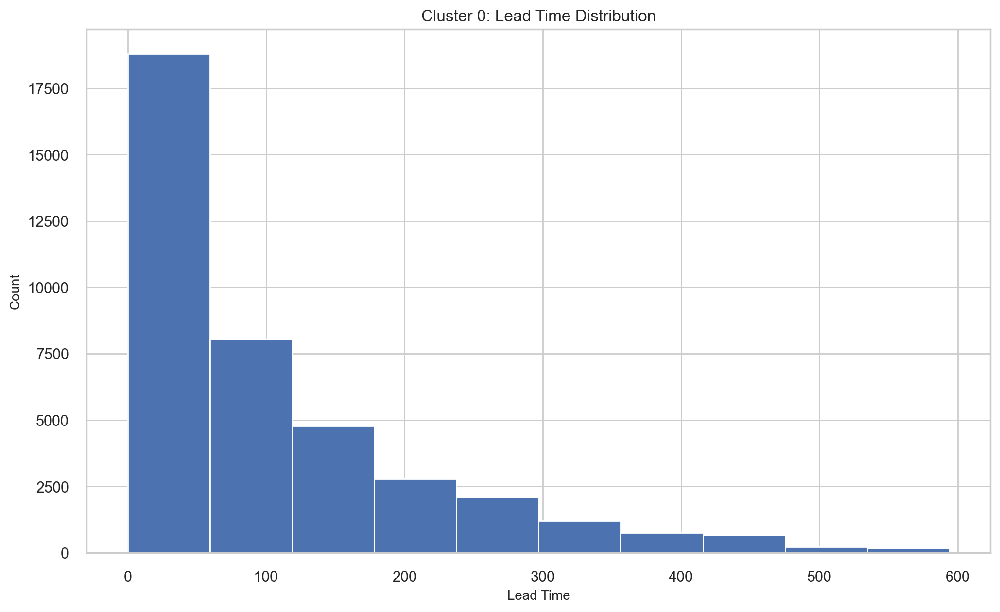

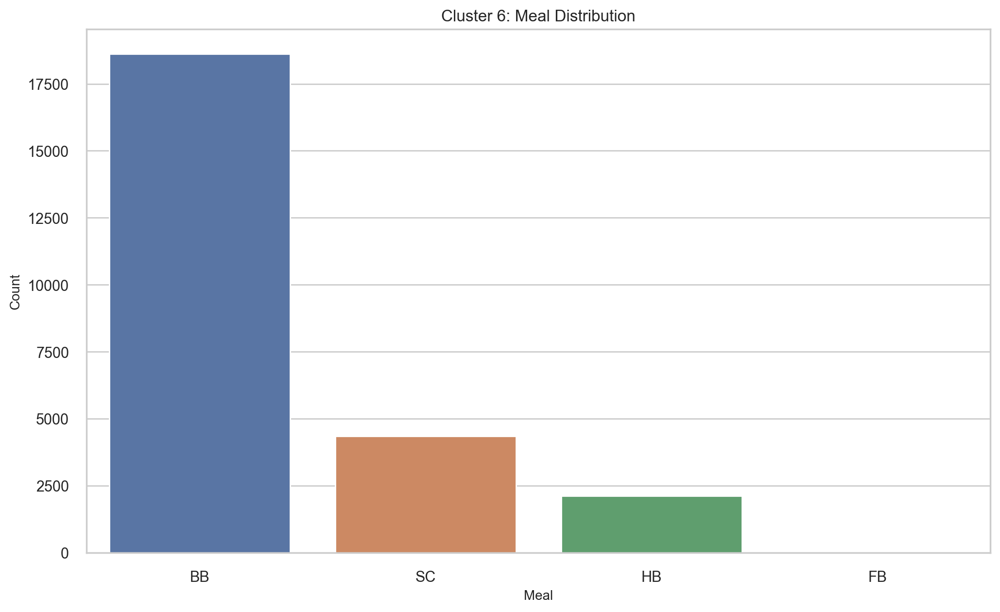

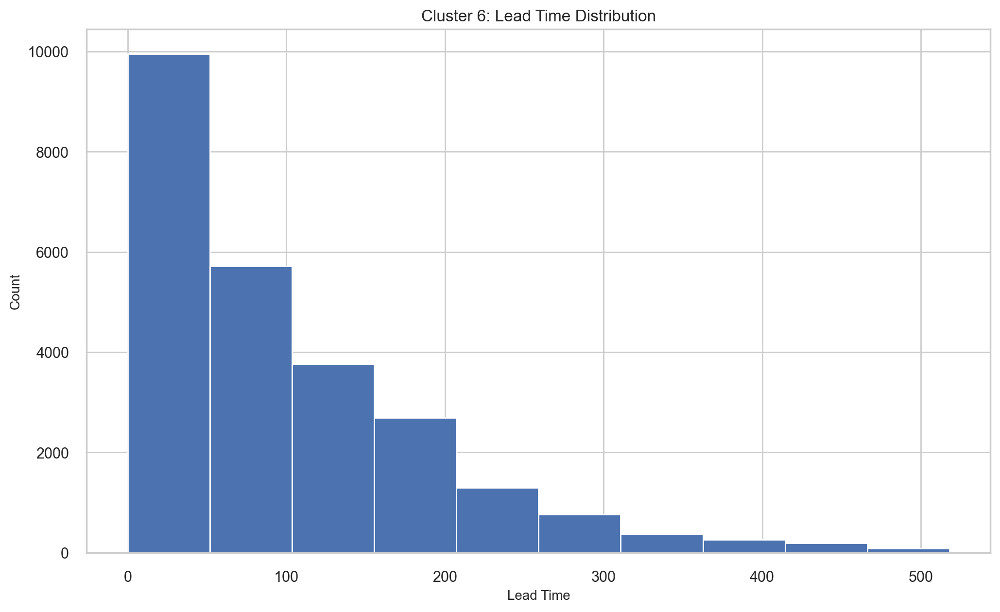

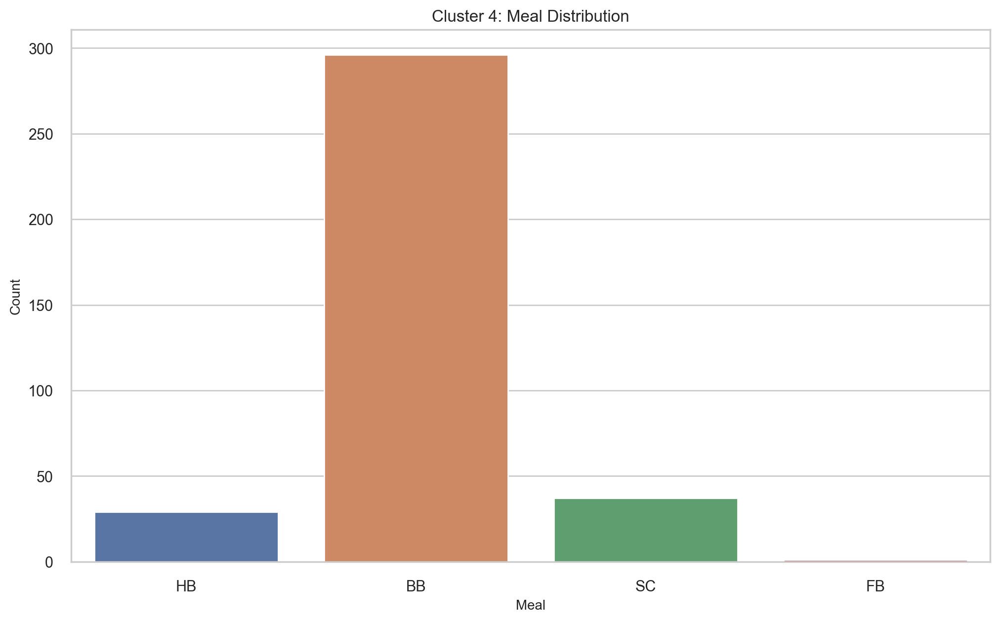

...

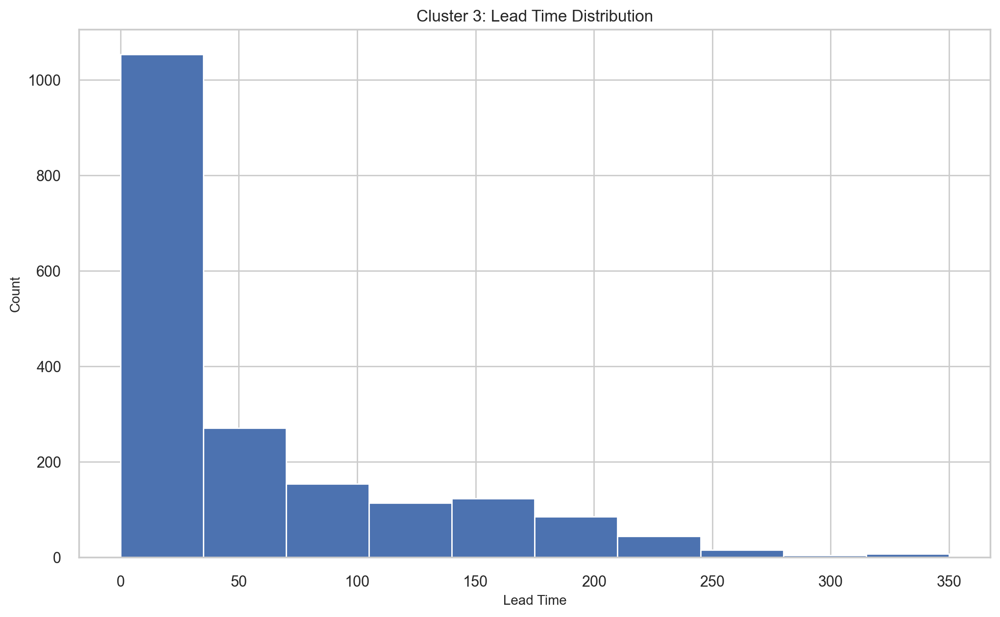

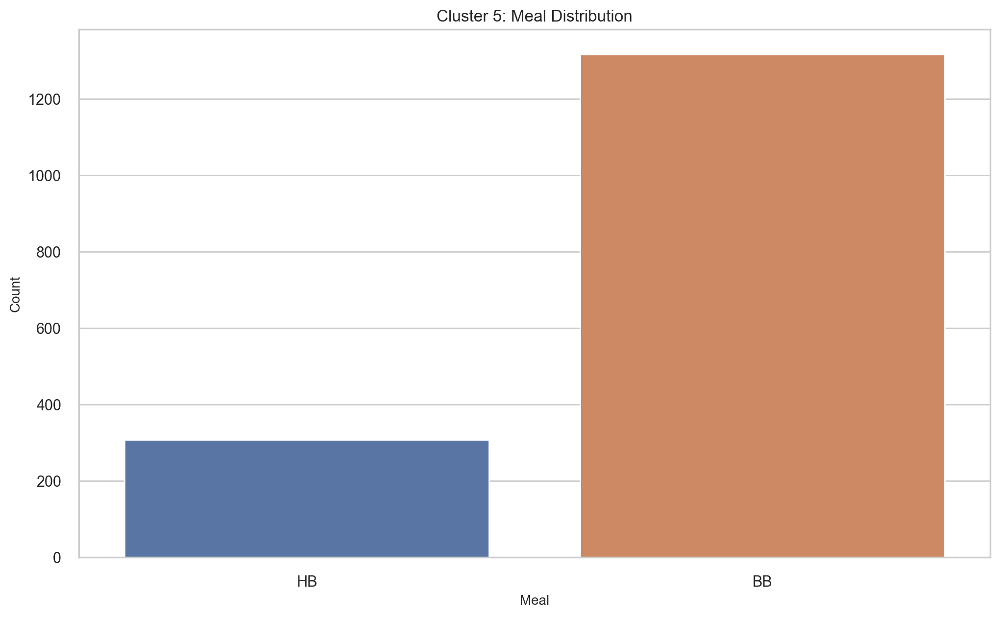

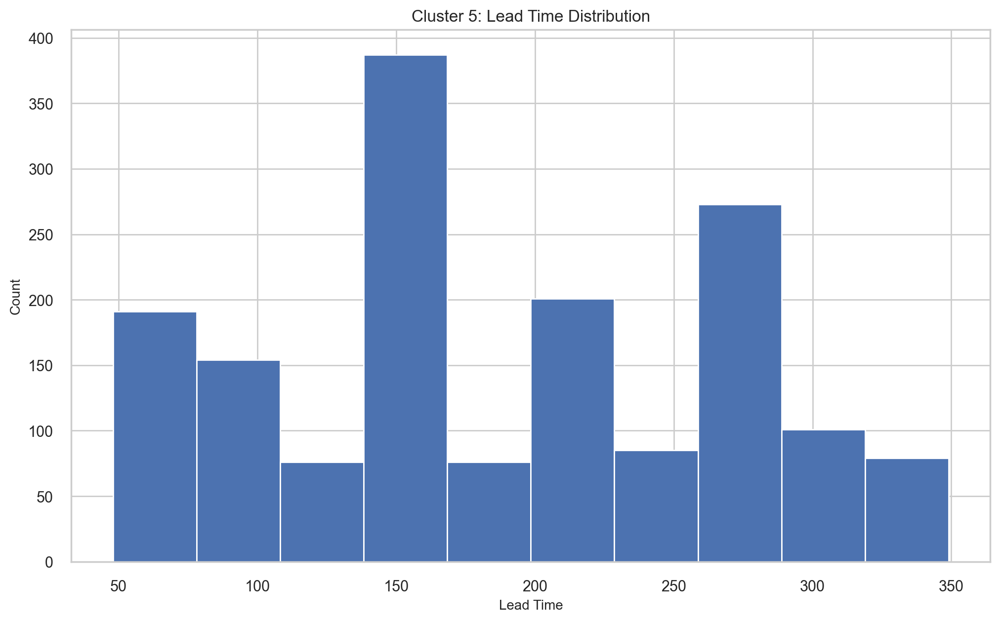

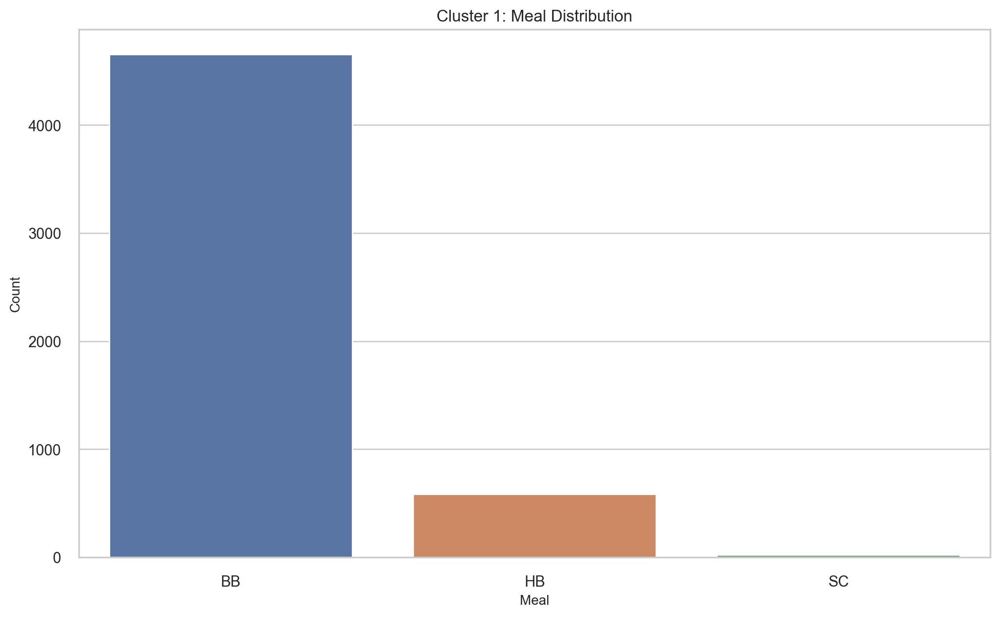

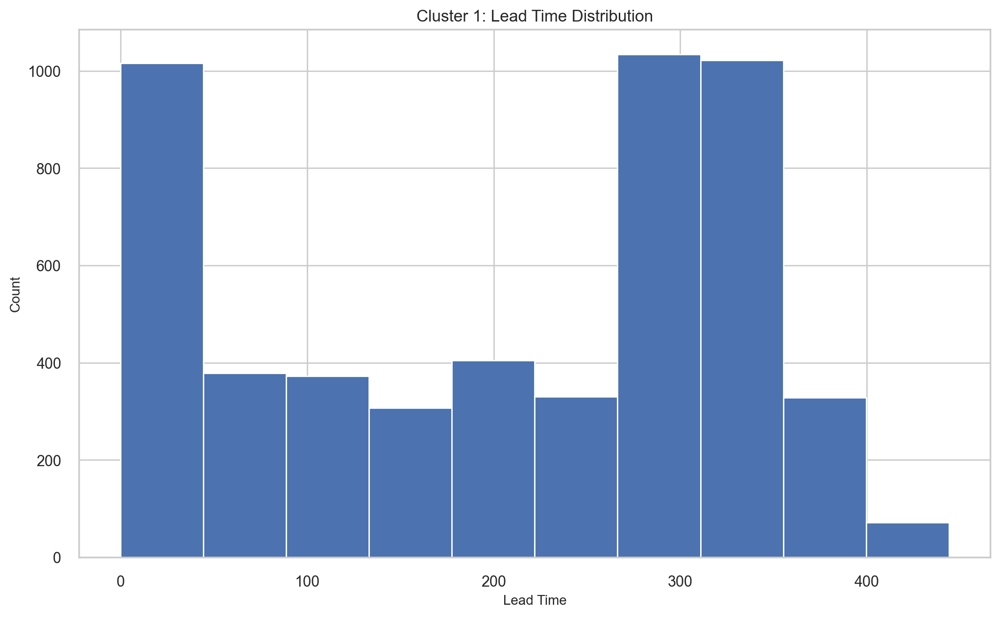

In [144]:
#each cluster label and visualization separatly
for label in X['cluster'].unique():
    cluster_data = X[X['cluster'] == label]
    
    plt.figure(figsize=(12, 7))
    sns.countplot(x='Meal', data=cluster_data)
    plt.title(f'Cluster {label}: Meal Distribution')
    plt.xlabel('Meal')
    plt.ylabel('Count')
    plt.show()
    
    plt.figure(figsize=(12, 7))
    plt.hist(cluster_data['LeadTime'])
    plt.title(f'Cluster {label}: Lead Time Distribution')
    plt.xlabel('Lead Time')
    plt.ylabel('Count')
    plt.show()

### 8.2 Assembling final dataset for modelling <a class="anchor" id="Assembling final dataset for modelling"></a> 

In [145]:
ds_clustered

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,...,quarter_4,season_Autumn,season_Spring,season_Summer,season_Winter,RoomChange_0,RoomChange_1,IsCountryPRT_0,IsCountryPRT_1,labels
0,-0.94,-0.90,-0.13,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0
1,-0.19,-0.90,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,6
2,-0.40,-0.90,1.26,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0
3,-0.15,1.37,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,6
4,-0.08,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0.07,1.37,-1.52,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00,0
78275,-0.22,1.37,1.96,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00,6
78276,-0.98,-0.90,0.57,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00,6
78277,-0.97,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,0.00,1.00,0.00,1.00,0.00,1.00,0.00,6


In [146]:
ds_for_modelling = ds_clustered.copy()

In [147]:
# One-hot encode the 'labels' column
ds_for_modelling = pd.get_dummies(ds_for_modelling, columns=['labels'])
ds_for_modelling

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,...,RoomChange_1,IsCountryPRT_0,IsCountryPRT_1,labels_0,labels_1,labels_2,labels_3,labels_4,labels_5,labels_6
0,-0.94,-0.90,-0.13,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,1.00,1,0,0,0,0,0,0
1,-0.19,-0.90,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,1.00,0,0,0,0,0,0,1
2,-0.40,-0.90,1.26,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,1.00,1,0,0,0,0,0,0
3,-0.15,1.37,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,1.00,0,0,0,0,0,0,1
4,-0.08,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,0.00,1.00,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0.07,1.37,-1.52,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0.00,1,0,0,0,0,0,0
78275,-0.22,1.37,1.96,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0.00,0,0,0,0,0,0,1
78276,-0.98,-0.90,0.57,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0.00,0,0,0,0,0,0,1
78277,-0.97,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0.00,0,0,0,0,0,0,1


In [148]:
# Concatenate ds_for_modelling with ds_new['IsCanceled']
ds_for_modelling_final = pd.concat([ds_for_modelling, ds_new['IsCanceled']], axis=1)
ds_for_modelling_final

,LeadTime,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,...,IsCountryPRT_0,IsCountryPRT_1,labels_0,labels_1,labels_2,labels_3,labels_4,labels_5,labels_6,IsCanceled
0,-0.94,-0.90,-0.13,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,1,0,0,0,0,0,0,0
1,-0.19,-0.90,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0,0,0,0,0,0,1,1
2,-0.40,-0.90,1.26,-1.67,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,1,0,0,0,0,0,0,1
3,-0.15,1.37,1.26,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,0,0,0,0,0,0,1,1
4,-0.08,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,0.00,1.00,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78274,0.07,1.37,-1.52,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,1,0,0,0,0,0,0,0
78275,-0.22,1.37,1.96,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0,0,0,0,0,0,1,0
78276,-0.98,-0.90,0.57,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0,0,0,0,0,0,1,0
78277,-0.97,-0.90,-0.13,0.29,-0.25,-0.07,-0.25,-0.09,-0.33,-0.17,...,1.00,0.00,0,0,0,0,0,0,1,0


## 9. Modeling <a class="anchor" id="5"></a>

### 9.0.1 Train Test Split <a class="anchor" id="5"></a>

In [149]:
from sklearn.model_selection import train_test_split

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(ds_for_modelling, ds_for_modelling_final['IsCanceled'], test_size=0.2, random_state=42)

### 9.0.2 Feature Importance for Modelling <a class="anchor" id="5"></a>

In [150]:
metric_features_norm = ['LeadTime',
 'StaysInWeekendNights',
 'StaysInWeekNights',
 'Adults',
 'Children',
 'Babies',
 'PreviousCancellations',
 'PreviousBookingsNotCanceled',
 'BookingChanges',
 'DaysInWaitingList',
 'ADR',
 'RequiredCarParkingSpaces',
 'TotalOfSpecialRequests']

non_metric_features_norm = ds_for_modelling_final.columns.drop(metric_features_norm).to_list()

non_metrics_features_norm_to_drop = ['IsCanceled']

# Drop elements from the metric_features list
for element in non_metrics_features_norm_to_drop:
    non_metric_features_norm.remove(element)

### 9.0.3 Spearman <a class="anchor" id="5"></a>

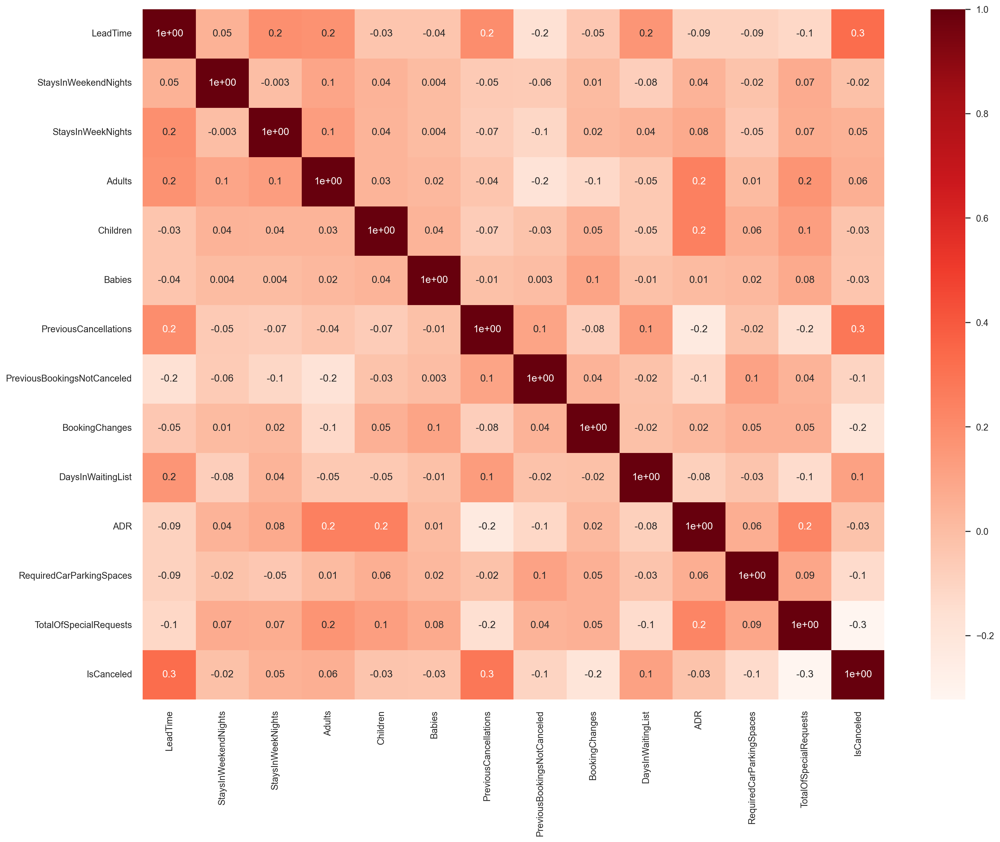

In [151]:
def cor_heatmap(cor,name):
    plt.figure(figsize=(20,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.savefig(name+'_cor_spearman_heatmap.png', dpi=200)
    plt.show()

# Baseline dataset (X_train + Y_train)
all_train1 = X_train[metric_features_norm].join(y_train)
all_train1.head()

cor_spearman = all_train1.corr(method ='spearman')
cor_heatmap(cor_spearman,'baseline')

Variables to take out:
Time in the system, 
Total Bookings

### 9.0.4 2Chi-Square <a class="anchor" id="5"></a> 

In [152]:
for var in X_train[non_metric_features_norm]:
    TestIndependence(X_train[non_metric_features_norm][var],y_train, var)

Meal_BB is IMPORTANT for Prediction
Meal_FB is IMPORTANT for Prediction
Meal_HB is IMPORTANT for Prediction
Meal_SC is IMPORTANT for Prediction
MarketSegment_Aviation is IMPORTANT for Prediction
MarketSegment_Complementary is IMPORTANT for Prediction
MarketSegment_Corporate is IMPORTANT for Prediction
MarketSegment_Direct is IMPORTANT for Prediction
MarketSegment_Groups is IMPORTANT for Prediction
MarketSegment_Offline TA/TO is IMPORTANT for Prediction
MarketSegment_Online TA is IMPORTANT for Prediction
DistributionChannel_Corporate is IMPORTANT for Prediction
DistributionChannel_Direct is IMPORTANT for Prediction
DistributionChannel_GDS is IMPORTANT for Prediction
DistributionChannel_TA/TO is IMPORTANT for Prediction
IsRepeatedGuest_0 is IMPORTANT for Prediction
IsRepeatedGuest_1 is IMPORTANT for Prediction
ReservedRoomType_A is IMPORTANT for Prediction
ReservedRoomType_B is IMPORTANT for Prediction
ReservedRoomType_C is NOT an important predictor. (Discard ReservedRoomType_C from mod

In [153]:
chi_2_important = []
chi_2_not_important = []

def TestIndependence(X, y, var, alpha=0.05):
    dfObserved = pd.crosstab(y, X)
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index=dfObserved.index)
    
    if p < alpha:
        chi_2_important.append(var)
    else:
        chi_2_not_important.append(var)

for var in X_train[non_metric_features_norm]:
    TestIndependence(X_train[non_metric_features_norm][var], y_train, var)

In [154]:
X_train[chi_2_important].columns

Index(['Meal_BB', 'Meal_FB', 'Meal_HB', 'Meal_SC', 'MarketSegment_Aviation',
       'MarketSegment_Complementary', 'MarketSegment_Corporate',
       'MarketSegment_Direct', 'MarketSegment_Groups',
       'MarketSegment_Offline TA/TO',
       ...
       'RoomChange_1', 'IsCountryPRT_0', 'IsCountryPRT_1', 'labels_0',
       'labels_1', 'labels_2', 'labels_3', 'labels_4', 'labels_5', 'labels_6'],
      dtype='object', length=207)

### 9.0.4 L1 Regularization <a class="anchor" id="5"></a>  

In [155]:
# Set the regularization parameter C=1
from sklearn.feature_selection import SelectFromModel
logistic = LogisticRegression(C=1, penalty="l1", solver='liblinear', random_state=7).fit(X_train, y_train)
model = SelectFromModel(logistic, prefit=True)

X_new = model.transform(X_train)
X_new

array([[-0.95335136, -0.90305901, -0.12824068, ...,  0.        ,
         0.        ,  0.        ],
       [-0.54677422,  1.36994923, -0.82458864, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.03537032,  1.36994923, -1.52093661, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.00764915, -0.90305901,  0.56810728, ...,  0.        ,
         0.        ,  1.        ],
       [-0.94411097,  0.23344511, -1.52093661, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.41422629, -0.90305901,  1.26445524, ...,  0.        ,
         0.        ,  0.        ]])

In [156]:
# Get back the kept features as a DataFrame with dropped columns as all 0s
selected_features = pd.DataFrame(model.inverse_transform(X_new), 
                                 index=X_train.index,
                                 columns=X_train.columns)

# Dropped columns have values of all 0s, keep other columns 
selected_columns_l1 = selected_features.columns[selected_features.var() != 0]

In [157]:
#selected_columns_l1.to_list()

In [158]:
X_train.columns

Index(['LeadTime', 'StaysInWeekendNights', 'StaysInWeekNights', 'Adults',
       'Children', 'Babies', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'BookingChanges', 'DaysInWaitingList',
       ...
       'RoomChange_1', 'IsCountryPRT_0', 'IsCountryPRT_1', 'labels_0',
       'labels_1', 'labels_2', 'labels_3', 'labels_4', 'labels_5', 'labels_6'],
      dtype='object', length=503)

### 9.0.4 RFE for Random Forest <a class="anchor" id="5"></a>

#### 9.0.4.1 Metric Features <a class="anchor" id="5"></a>

In [159]:
# The "accuracy" scoring is proportional to the number of correct classifications
clf_rf_4 = RandomForestClassifier() 
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(X_train[metric_features_norm], y_train)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X_train[metric_features_norm].columns[rfecv.support_])

Optimal number of features : 11
Best features : Index(['LeadTime', 'StaysInWeekendNights', 'StaysInWeekNights', 'Adults',
       'Children', 'PreviousCancellations', 'BookingChanges',
       'DaysInWaitingList', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests'],
      dtype='object')


In [160]:
variables_to_keep = list(X_train[chi_2_important].columns) + list(X_train[metric_features_norm].columns[rfecv.support_])
elements_to_remove = ('ReservationStatus_Canceled','ReservationStatus_Check-Out','ReservationStatus_No-Show')
variables_to_keep = list(filter(lambda x: x not in elements_to_remove, variables_to_keep))

#### 9.0.4.1 All Features <a class="anchor" id="5"></a>

In [161]:
# Create a modified version of X_train without the "Is_canceled" column
X_train_modified = X_train[variables_to_keep]
#y_train_modified = y_train.drop("IsCanceled", axis=1)

# Fit RFECV using the modified X_train and y_train
clf_rf_4 = RandomForestClassifier() 
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5, scoring='accuracy')
rfecv = rfecv.fit(X_train_modified, y_train)

print('Optimal number of features:', rfecv.n_features_)
best_features = X_train_modified.columns[rfecv.support_]
print('Best features:', best_features)

Optimal number of features: 68
Best features: Index(['Meal_BB', 'Meal_HB', 'Meal_SC', 'MarketSegment_Corporate',
       'MarketSegment_Direct', 'MarketSegment_Groups',
       'MarketSegment_Offline TA/TO', 'MarketSegment_Online TA',
       'DistributionChannel_Corporate', 'DistributionChannel_Direct',
       'DistributionChannel_TA/TO', 'IsRepeatedGuest_0', 'IsRepeatedGuest_1',
       'ReservedRoomType_A', 'ReservedRoomType_B', 'ReservedRoomType_D',
       'ReservedRoomType_E', 'AssignedRoomType_A', 'AssignedRoomType_B',
       'AssignedRoomType_D', 'AssignedRoomType_E', 'AssignedRoomType_F',
       'DepositType_No Deposit', 'DepositType_Non Refund', 'Agent_1',
       'Agent_11', 'Agent_134', 'Agent_14', 'Agent_229', 'Agent_28', 'Agent_3',
       'Agent_56', 'Agent_6', 'Agent_7', 'Agent_8', 'Agent_83', 'Agent_85',
       'Agent_9', 'Company_40', 'CustomerType_Contract',
       'CustomerType_Transient', 'CustomerType_Transient-Party', 'quarter_1',
       'quarter_2', 'quarter_3', 'seaso

In [162]:
best_var = ['Meal_BB', 'Meal_HB', 'Meal_SC', 'MarketSegment_Corporate',
       'MarketSegment_Direct', 'MarketSegment_Groups',
       'MarketSegment_Offline TA/TO', 'MarketSegment_Online TA',
       'DistributionChannel_Corporate', 'DistributionChannel_Direct',
       'DistributionChannel_TA/TO', 'IsRepeatedGuest_0', 'IsRepeatedGuest_1',
       'ReservedRoomType_A', 'ReservedRoomType_B', 'ReservedRoomType_D',
       'ReservedRoomType_E', 'AssignedRoomType_A', 'AssignedRoomType_B',
       'AssignedRoomType_D', 'AssignedRoomType_E', 'AssignedRoomType_F',
       'DepositType_No Deposit', 'DepositType_Non Refund', 'Agent_1',
       'Agent_11', 'Agent_134', 'Agent_14', 'Agent_229', 'Agent_28', 'Agent_3',
       'Agent_56', 'Agent_6', 'Agent_7', 'Agent_8', 'Agent_83', 'Agent_85',
       'Agent_9', 'Company_40', 'CustomerType_Contract',
       'CustomerType_Transient', 'CustomerType_Transient-Party', 'quarter_1',
       'quarter_2', 'quarter_3', 'season_Spring', 'season_Winter',
       'RoomChange_0', 'RoomChange_1', 'IsCountryPRT_0', 'IsCountryPRT_1',
       'labels_0', 'labels_1', 'labels_2', 'labels_3', 'labels_6', 'LeadTime',
       'StaysInWeekendNights', 'StaysInWeekNights', 'Adults', 'Children',
       'PreviousCancellations', 'PreviousBookingsNotCanceled',
       'BookingChanges', 'DaysInWaitingList', 'ADR',
       'RequiredCarParkingSpaces', 'TotalOfSpecialRequests']

### 9.1 Model Selection <a class="anchor" id="5"></a>

In [171]:
#Model Building
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import cross_val_score
X = X_train[best_var]
y = y_train

In [164]:
X_train_mini, X_val, y_train_mini, y_val = train_test_split(X, y, test_size = 0.25, random_state = 23, stratify = y)

### 9.2 Lazy Classifier <a class="anchor" id="5"></a>

In [165]:
# load data
#data = datasets.load_breast_cancer()
#X, y = data.data, data.target
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)
# fit all models
clf = LazyClassifier(predictions=True)
#clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric = None)
models, predictions = clf.fit(X_train_mini, X_val, y_train_mini, y_val)

### lets check which model did better on Breast Cancer Dataset
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [08:52<00:00, 18.35s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RandomForestClassifier             0.87               0.87     0.87      0.87   
XGBClassifier                      0.87               0.86     0.86      0.87   
BaggingClassifier                  0.87               0.86     0.86      0.87   
ExtraTreesClassifier               0.87               0.86     0.86      0.87   
LGBMClassifier                     0.87               0.86     0.86      0.87   
DecisionTreeClassifier             0.85               0.84     0.84      0.85   
LabelSpreading                     0.84               0.84     0.84      0.84   
LabelPropagation                   0.84               0.84     0.84      0.84   
SVC                                0.85               0.84     0.84      0.85   
KNeighborsClassifier               0.84               0.84     0.84      0.84   
ExtraTreeClassifier         

### 9.4 Logistic Regression <a class="anchor" id="5"></a>

In [ ]:
# Logistic Regression

lr = LogisticRegression()
lr.fit(X_train_mini, y_train_mini)

y_pred_lr = lr.predict(X_val)

acc_lr = accuracy_score(y_val, y_pred_lr)
conf = confusion_matrix(y_val, y_pred_lr)
clf_report = classification_report(y_val, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : n{conf}")
print(f"Classification Report : n{clf_report}")

### 9.5 KNN Algorithm <a class="anchor" id="5"></a>

In [ ]:
# Applying KNN Algorithm on Hotel Booking Cancellation Dataset

knn = KNeighborsClassifier()
knn.fit(X_train_mini, y_train_mini)

y_pred_knn = knn.predict(X_val)

acc_knn = accuracy_score(y_val, y_pred_knn)
conf = confusion_matrix(y_val, y_pred_knn)
clf_report = classification_report(y_val, y_pred_knn)

print(f"Accuracy Score of KNN is : {acc_knn}")
print(f"Confusion Matrix : n{conf}")
print(f"Classification Report : n{clf_report}")

### 9.6 Decision tree Classification <a class="anchor" id="5"></a>

In [ ]:
#Decision Tree Classification Algorithm

dtc = DecisionTreeClassifier()
dtc.fit(X_train_mini, y_train_mini)

y_pred_dtc = dtc.predict(X_val)

acc_dtc = accuracy_score(y_val, y_pred_dtc)
conf = confusion_matrix(y_val, y_pred_dtc)
clf_report = classification_report(y_val, y_pred_dtc)

print(f"Accuracy Score of Decision Tree is : {acc_dtc}")
print(f"Confusion Matrix : n{conf}")
print(f"Classification Report : n{clf_report}")

### 9.7 Random Forest with grip search <a class="anchor" id="5"></a>

In [265]:
parameter_space = {
    'max_features': ['auto', 'sqrt'],
    'ccp_alpha': [0.001, 0.0015],
    'max_depth': [79, 10],
    'criterion': ['gini', 'entropy'],
    'n_estimators': [100, 200]
}

modelRF = RandomForestClassifier(random_state=1)
scoring = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']  # Updated scoring metrics
rfc = GridSearchCV(modelRF, parameter_space, scoring=scoring, return_train_score=True, refit=False)
rfc.fit(X_train_mini[best_var], y_train_mini)

GridSearchCV(estimator=RandomForestClassifier(random_state=1),
             param_grid={'ccp_alpha': [0.001, 0.0015],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [79, 10],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [100, 200]},
             refit=False, return_train_score=True,
             scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'])

In [266]:
scoring_metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']

results = pd.DataFrame()

for metric in scoring_metrics:
    key_mean = 'mean_test_' + metric
    key_std = 'std_test_' + metric
    key_mean_train = 'mean_train_' + metric

    means = rfc.cv_results_[key_mean]
    stds = rfc.cv_results_[key_std]
    mean_trains = rfc.cv_results_[key_mean_train]
    params = rfc.cv_results_['params']

    metric_results = pd.DataFrame(zip(means, stds, mean_trains, params), columns=['Mean Test Score', 'Std', 'Mean Train Score', 'Params'])
    metric_results.sort_values(by=['Mean Test Score'], inplace=True, ascending=False)
    metric_results.insert(0, 'Metric', metric)

    results = pd.concat([results, metric_results], ignore_index=True)

# Reorder the columns
results = results[['Metric', 'Mean Test Score', 'Std', 'Mean Train Score', 'Params']]

# Format the Mean Test Score, Std, and Mean Train Score columns to left-align the values
results[['Mean Test Score', 'Std', 'Mean Train Score']] = results[['Mean Test Score', 'Std', 'Mean Train Score']].apply(lambda x: x.map('{:.4f}'.format))

# Set the display options for pandas to show the entire parameter list
pd.set_option('display.max_colwidth', None)

print("Results:")
print("-" * 80)

header = ["Metric", "Mean Test Score", "Std", "Mean Train Score", "Params"]
print("{:<12} {:<16} {:<8} {:<17} {}".format(*header))

print("-" * 80)
previous_metric = None

for index, row in results.iterrows():
    metric = row['Metric']
    if metric != previous_metric:
        print("-" * 80)
        previous_metric = metric
    print("{:<12} {:<16} {:<8} {:<17} {}".format(row['Metric'], row['Mean Test Score'], row['Std'], row['Mean Train Score'], row['Params']))

print("-" * 80)

Results:
--------------------------------------------------------------------------------
Metric       Mean Test Score  Std      Mean Train Score  Params
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
accuracy     0.8433           0.0025   0.8450            {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 79, 'max_features': 'auto', 'n_estimators': 100}
accuracy     0.8433           0.0025   0.8450            {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 79, 'max_features': 'sqrt', 'n_estimators': 100}
accuracy     0.8431           0.0034   0.8445            {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 79, 'max_features': 'auto', 'n_estimators': 200}
accuracy     0.8431           0.0034   0.8445            {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 79, 'max_features': 'sqrt', 'n_estimators': 200}
accuracy     0.8390         

### 9.8.1 BAGGING with gridsearch ( 1st ) <a class="anchor" id="5"></a>

In [ ]:
from sklearn.ensemble import BaggingClassifier

# BAGGING - GridSearch
parameter_space = {
    "n_estimators": [2, 5],
    "max_samples": [0.1],
    'bootstrap_features': [True, False],
    "bootstrap": [True, False],
    "max_features":[0.6,1]
}

modelBC = BaggingClassifier(base_estimator = DecisionTreeClassifier(), random_state = 43)
clf = GridSearchCV(modelBC, parameter_space, scoring = 'f1', return_train_score = True)
clf.fit(X_train_mini[best_var],y_train_mini)

In [206]:
# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
# Associated to each model that I have just created
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
mean_trains = clf.cv_results_['mean_train_score']
params = clf.cv_results_['params']

results = pd.DataFrame(zip(means, stds, mean_trains, params), columns=['Mean Val','Std','Mean Train','Params'])
results.sort_values(by=['Mean Val'], inplace = True, ascending =False)
results

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'bootstrap': True, 'bootstrap_features': False, 'max_features': 0.6, 'max_samples': 0.1, 'n_estimators': 5}
------------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params
5,0.78,0.01,0.82,"{'bootstrap': True, 'bootstrap_features': Fals..."
13,0.78,0.01,0.82,"{'bootstrap': False, 'bootstrap_features': Fal..."
9,0.78,0.00,0.81,"{'bootstrap': False, 'bootstrap_features': Tru..."
1,0.77,0.01,0.80,"{'bootstrap': True, 'bootstrap_features': True..."
0,0.73,0.01,0.76,"{'bootstrap': True, 'bootstrap_features': True..."
8,0.73,0.00,0.76,"{'bootstrap': False, 'bootstrap_features': Tru..."
12,0.71,0.01,0.74,"{'bootstrap': False, 'bootstrap_features': Fal..."
4,0.71,0.00,0.74,"{'bootstrap': True, 'bootstrap_features': Fals..."
3,0.56,0.01,0.56,"{'bootstrap': True, 'bootstrap_features': True..."
11,0.56,0.01,0.56,"{'bootstrap': False, 'bootstrap_features': Tru..."


### 9.8.2 BAGGING with gridsearch ( 2nd ) <a class="anchor" id="5"></a>

In [267]:
parameter_space = {
    'n_estimators': [ 50, 100],
    'max_samples': [0.5, 0.9],
    'max_features': [ 0.7, 0.9],
    'bootstrap': [True, False],
    'bootstrap_features': [True, False],
    'base_estimator__criterion': ['gini', 'entropy'],
    'base_estimator__max_depth': [None, 5, 10]
}

scoring = {'accuracy': 'accuracy', 'precision': 'precision', 'recall': 'recall', 'f1': 'f1', 'roc_auc': 'roc_auc'}

modelBC = BaggingClassifier(base_estimator=DecisionTreeClassifier(), random_state=43)
bagc = GridSearchCV(modelBC, parameter_space, scoring=scoring, cv=3, return_train_score=True, refit = False)
bagc.fit(X_train_mini[best_var], y_train_mini)

GridSearchCV(cv=3,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(),
                                         random_state=43),
             param_grid={'base_estimator__criterion': ['gini', 'entropy'],
                         'base_estimator__max_depth': [None, 5, 10],
                         'bootstrap': [True, False],
                         'bootstrap_features': [True, False],
                         'max_features': [0.7, 0.9], 'max_samples': [0.5, 0.9],
                         'n_estimators': [50, 100]},
             refit=False, return_train_score=True,
             scoring={'accuracy': 'accuracy', 'f1': 'f1',
                      'precision': 'precision', 'recall': 'recall',
                      'roc_auc': 'roc_auc'})

In [269]:
scoring_metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']

results = pd.DataFrame()

for metric in scoring_metrics:
    key_mean = 'mean_test_' + metric
    key_std = 'std_test_' + metric
    key_mean_train = 'mean_train_' + metric

    means = bagc.cv_results_[key_mean]
    stds = bagc.cv_results_[key_std]
    mean_trains = bagc.cv_results_[key_mean_train]
    params = bagc.cv_results_['params']

    metric_results = pd.DataFrame(zip(means, stds, mean_trains, params), columns=['Mean Test Score', 'Std', 'Mean Train Score', 'Params'])
    metric_results.sort_values(by=['Mean Test Score'], inplace=True, ascending=False)
    metric_results.insert(0, 'Metric', metric)

    results = pd.concat([results, metric_results], ignore_index=True)

# Reorder the columns
results = results[['Metric', 'Mean Test Score', 'Std', 'Mean Train Score', 'Params']]

# Format the Mean Test Score, Std, and Mean Train Score columns to left-align the values
results[['Mean Test Score', 'Std', 'Mean Train Score']] = results[['Mean Test Score', 'Std', 'Mean Train Score']].apply(lambda x: x.map('{:.4f}'.format))

# Set the display options for pandas to show the entire parameter list
pd.set_option('display.max_colwidth', None)

print("Results:")
print("-" * 80)

header = ["Metric", "Mean Test Score", "Std", "Mean Train Score", "Params"]
print("{:<12} {:<16} {:<8} {:<17} {}".format(*header))

print("-" * 80)
previous_metric = None

for index, row in results.iterrows():
    metric = row['Metric']
    if metric != previous_metric:
        print("-" * 80)
        previous_metric = metric
    print("{:<12} {:<16} {:<8} {:<17} {}".format(row['Metric'], row['Mean Test Score'], row['Std'], row['Mean Train Score'], row['Params']))

print("-" * 80)

Results:
--------------------------------------------------------------------------------
Metric       Mean Test Score  Std      Mean Train Score  Params
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
accuracy     0.8756           0.0011   0.9902            {'base_estimator__criterion': 'entropy', 'base_estimator__max_depth': None, 'bootstrap': False, 'bootstrap_features': False, 'max_features': 0.7, 'max_samples': 0.5, 'n_estimators': 100}
accuracy     0.8755           0.0002   0.9947            {'base_estimator__criterion': 'entropy', 'base_estimator__max_depth': None, 'bootstrap': True, 'bootstrap_features': False, 'max_features': 0.7, 'max_samples': 0.9, 'n_estimators': 100}
accuracy     0.8753           0.0009   0.9945            {'base_estimator__criterion': 'gini', 'base_estimator__max_depth': None, 'bootstrap': True, 'bootstrap_features': False, 'max_features': 0.7

### 9.9 XGBoost Classifier with Gridsearch ( 1st ) <a class="anchor" id="5"></a>

In [256]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

In [262]:
# Define the parameter space
parameter_space = {
    'learning_rate': [0.1, 0.3],
    'max_depth': [4,6],
    'subsample':  [1.0],
    'colsample_bytree': [1.0],
}

# Define the scoring metrics
scoring = {'accuracy': 'accuracy', 'precision': 'precision', 'recall': 'recall', 'f1': 'f1', 'roc_auc': 'roc_auc'}

# Create the XGBoost model
XGBModel = xgb.XGBClassifier()

# Create the grid search object
gs_xgb = GridSearchCV(XGBModel, parameter_space, scoring=scoring, cv=5, return_train_score=True,refit=False)

# Perform grid search
gs_xgb.fit(X_train_mini[best_var],y_train_mini)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'colsample_bytree': [1.0], 'learning_rate': [0.1, 0.3],
                         'max_depth': [4, 6], 'subsample': [1.0]},
             refit=False, return_train_score=True,
             scoring={'accuracy': 'accuracy', 'f1': 'f1',
                      'precision': 'precision', 'recall': 'recall',
                      'roc_auc': 'roc_auc'})

In [263]:
scoring_metrics = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']

results = pd.DataFrame()

for metric in scoring_metrics:
    key_mean = 'mean_test_' + metric
    key_std = 'std_test_' + metric
    key_mean_train = 'mean_train_' + metric

    means = gs_xgb.cv_results_[key_mean]
    stds = gs_xgb.cv_results_[key_std]
    mean_trains = gs_xgb.cv_results_[key_mean_train]
    params = gs_xgb.cv_results_['params']

    metric_results = pd.DataFrame(zip(means, stds, mean_trains, params), columns=['Mean Test Score', 'Std', 'Mean Train Score', 'Params'])
    metric_results.sort_values(by=['Mean Test Score'], inplace=True, ascending=False)
    metric_results.insert(0, 'Metric', metric)

    results = pd.concat([results, metric_results], ignore_index=True)

# Reorder the columns
results = results[['Metric', 'Mean Test Score', 'Std', 'Mean Train Score', 'Params']]

# Format the Mean Test Score, Std, and Mean Train Score columns to left-align the values
results[['Mean Test Score', 'Std', 'Mean Train Score']] = results[['Mean Test Score', 'Std', 'Mean Train Score']].apply(lambda x: x.map('{:.4f}'.format))

# Set the display options for pandas to show the entire parameter list
pd.set_option('display.max_colwidth', None)

print("Results:")
print("-" * 80)

header = ["Metric", "Mean Test Score", "Std", "Mean Train Score", "Params"]
print("{:<12} {:<16} {:<8} {:<17} {}".format(*header))

print("-" * 80)
previous_metric = None

for index, row in results.iterrows():
    metric = row['Metric']
    if metric != previous_metric:
        print("-" * 80)
        previous_metric = metric
    print("{:<12} {:<16} {:<8} {:<17} {}".format(row['Metric'], row['Mean Test Score'], row['Std'], row['Mean Train Score'], row['Params']))

print("-" * 80)

Results:
--------------------------------------------------------------------------------
Metric       Mean Test Score  Std      Mean Train Score  Params
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
accuracy     0.8685           0.0021   0.8940            {'colsample_bytree': 1.0, 'learning_rate': 0.3, 'max_depth': 6, 'subsample': 1.0}
accuracy     0.8595           0.0017   0.8687            {'colsample_bytree': 1.0, 'learning_rate': 0.3, 'max_depth': 4, 'subsample': 1.0}
accuracy     0.8571           0.0024   0.8630            {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 6, 'subsample': 1.0}
accuracy     0.8512           0.0030   0.8536            {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 4, 'subsample': 1.0}
--------------------------------------------------------------------------------
precision    0.8677           0.0055   0.8699  

## 10. Final Model Implementation <a class="anchor" id="5"></a>

### 10.1 Random Forest Solution <a class="anchor" id="5"></a>

In [216]:
# Creating RFC Model
RFCModel = RandomForestClassifier( ccp_alpha = 0.001, criterion = 'entropy', max_depth = 10, max_features = 'auto', n_estimators = 200, n_jobs= -1)
RFCModel.fit(X_train[best_var], y_train)
labels_train_RFC =RFCModel.predict(X_train[best_var])
labels_test_RFC = RFCModel.predict(X_test[best_var])

In [217]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Convert the predicted probabilities to binary labels
predicted_labels_train = (labels_train_RFC > 0.5).astype(int)
predicted_labels_test = (labels_test_RFC > 0.5).astype(int)

# Calculate accuracy
accuracy_train = accuracy_score(y_train, predicted_labels_train)
accuracy_test = accuracy_score(y_test, predicted_labels_test)

# Calculate recall
recall_train = recall_score(y_train, predicted_labels_train)
recall_test = recall_score(y_test, predicted_labels_test)

# Calculate F1 score
f1_train = f1_score(y_train, predicted_labels_train)
f1_test = f1_score(y_test, predicted_labels_test)

# Calculate support (number of samples in each class)
support_train = np.unique(y_train, return_counts=True)[1]
support_test = np.unique(y_test, return_counts=True)[1]

# Print the metrics
print("Train Accuracy:", accuracy_train)
print("Test Accuracy:", accuracy_test)
print("Train Recall:", recall_train)
print("Test Recall:", recall_test)
print("Train F1 Score:", f1_train)
print("Test F1 Score:", f1_test)
print("Train Support:", support_train)
print("Test Support:", support_test)

# Classification report
classification_report_train = classification_report(y_train, predicted_labels_train)
classification_report_test = classification_report(y_test, predicted_labels_test)
print("Train Classification Report:")
print(classification_report_train)
print("Test Classification Report:")
print(classification_report_test)

Train Accuracy: 0.839467927119429
Test Accuracy: 0.8403168114460909
Train Recall: 0.6995342800427546
Test Recall: 0.7010054137664347
Train F1 Score: 0.7847461619167935
Test F1 Score: 0.7838118298166724
Train Support: [36427 26196]
Test Support: [9191 6465]
Train Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.94      0.87     36427
           1       0.89      0.70      0.78     26196

    accuracy                           0.84     62623
   macro avg       0.85      0.82      0.83     62623
weighted avg       0.85      0.84      0.84     62623

Test Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.94      0.87      9191
           1       0.89      0.70      0.78      6465

    accuracy                           0.84     15656
   macro avg       0.85      0.82      0.83     15656
weighted avg       0.85      0.84      0.84     15656



### 10.2 Dense Neural Network Solution <a class="anchor" id="5"></a>

In [225]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.layers import Dropout
from keras import regularizers

# Define the model architecture
nn_model_3 = Sequential()
nn_model_3.add(Dense(128, input_dim=X_train[best_var].shape[1], activation='relu'))
nn_model_3.add(Dense(64, activation='relu'))
nn_model_3.add(Dropout(0.2))
nn_model_3.add(Dense(32, activation='relu'))
nn_model_3.add(Dropout(0.2))
nn_model_3.add(Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)))

# Compile the model
nn_model_3.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [227]:
# Creating NN Model
NNModel_3 = nn_model_3
NNModel_3.fit(X_train[best_var], y_train, epochs = 20, batch_size=32)

Epoch 1/20
1957/1957 [==============================] - 3s 1ms/step - loss: 0.3644 - accuracy: 0.8291
Epoch 2/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.3230 - accuracy: 0.8482
Epoch 3/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.3119 - accuracy: 0.8533
Epoch 4/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.3053 - accuracy: 0.8569
Epoch 5/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.3010 - accuracy: 0.8579
Epoch 6/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.2960 - accuracy: 0.8605
Epoch 7/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.2914 - accuracy: 0.8639
Epoch 8/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.2875 - accuracy: 0.8661
Epoch 9/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.2849 - accuracy: 0.8661
Epoch 10/20
1957/1957 [==============================] - 2s 1ms/step - loss: 0.281

In [229]:
labels_train_nn = NNModel_3.predict(X_train[best_var])
labels_test_nn =  NNModel_3.predict(X_test[best_var])

490/490 [==============================] - 0s 616us/step


In [230]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Convert the predicted probabilities to binary labels
predicted_labels_train = (labels_train_nn > 0.5).astype(int)
predicted_labels_test = (labels_test_nn > 0.5).astype(int)

# Calculate accuracy
accuracy_train = accuracy_score(y_train, predicted_labels_train)
accuracy_test = accuracy_score(y_test, predicted_labels_test)

# Calculate recall
recall_train = recall_score(y_train, predicted_labels_train)
recall_test = recall_score(y_test, predicted_labels_test)

# Calculate F1 score
f1_train = f1_score(y_train, predicted_labels_train)
f1_test = f1_score(y_test, predicted_labels_test)

# Calculate support (number of samples in each class)
support_train = np.unique(y_train, return_counts=True)[1]
support_test = np.unique(y_test, return_counts=True)[1]

# Print the metrics
print("Train Accuracy:", accuracy_train)
print("Test Accuracy:", accuracy_test)
print("Train Recall:", recall_train)
print("Test Recall:", recall_test)
print("Train F1 Score:", f1_train)
print("Test F1 Score:", f1_test)
print("Train Support:", support_train)
print("Test Support:", support_test)
# Classification report
classification_report_train = classification_report(y_train, predicted_labels_train)
classification_report_test = classification_report(y_test, predicted_labels_test)
print("Train Classification Report:")
print(classification_report_train)
print("Test Classification Report:")
print(classification_report_test)

Train Accuracy: 0.8863356913594047
Test Accuracy: 0.8639499233520695
Train Recall: 0.840548175293938
Test Recall: 0.8157772621809745
Train F1 Score: 0.86085698647275
Test F1 Score: 0.831992427827733
Train Support: [36427 26196]
Test Support: [9191 6465]
Train Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.92      0.90     36427
           1       0.88      0.84      0.86     26196

    accuracy                           0.89     62623
   macro avg       0.89      0.88      0.88     62623
weighted avg       0.89      0.89      0.89     62623

Test Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      9191
           1       0.85      0.82      0.83      6465

    accuracy                           0.86     15656
   macro avg       0.86      0.86      0.86     15656
weighted avg       0.86      0.86      0.86     15656



### 10.3 BaggingClassifier Solution <a class="anchor" id="5"></a>

In [239]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# Creating RFC Model
base_estimator = DecisionTreeClassifier(criterion='entropy', max_depth=None)
BAGGINGModel = BaggingClassifier(base_estimator=base_estimator, bootstrap=False, bootstrap_features=False, 
                                 max_features=0.7, max_samples=0.5, n_estimators=100)
BAGGINGModel.fit(X_train[best_var], y_train)
labels_train_BAGGING = BAGGINGModel.predict(X_train[best_var])
labels_test_BAGGING = BAGGINGModel.predict(X_test[best_var])

In [240]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Convert the predicted probabilities to binary labels
predicted_labels_train = (labels_train_BAGGING > 0.5).astype(int)
predicted_labels_test = (labels_test_BAGGING > 0.5).astype(int)

# Calculate accuracy
accuracy_train = accuracy_score(y_train, predicted_labels_train)
accuracy_test = accuracy_score(y_test, predicted_labels_test)

# Calculate recall
recall_train = recall_score(y_train, predicted_labels_train)
recall_test = recall_score(y_test, predicted_labels_test)

# Calculate F1 score
f1_train = f1_score(y_train, predicted_labels_train)
f1_test = f1_score(y_test, predicted_labels_test)

# Calculate support (number of samples in each class)
support_train = np.unique(y_train, return_counts=True)[1]
support_test = np.unique(y_test, return_counts=True)[1]

# Print the metrics
print("Train Accuracy:", accuracy_train)
print("Test Accuracy:", accuracy_test)
print("Train Recall:", recall_train)
print("Test Recall:", recall_test)
print("Train F1 Score:", f1_train)
print("Test F1 Score:", f1_test)
print("Train Support:", support_train)
print("Test Support:", support_test)
# Classification report
classification_report_train = classification_report(y_train, predicted_labels_train)
classification_report_test = classification_report(y_test, predicted_labels_test)
print("Train Classification Report:")
print(classification_report_train)
print("Test Classification Report:")
print(classification_report_test)

Train Accuracy: 0.9878958210242244
Test Accuracy: 0.8820899335717935
Train Recall: 0.9801878149335777
Test Recall: 0.8298530549110595
Train F1 Score: 0.9854544058949954
Test F1 Score: 0.8532124681933843
Train Support: [36427 26196]
Test Support: [9191 6465]
Train Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     36427
           1       0.99      0.98      0.99     26196

    accuracy                           0.99     62623
   macro avg       0.99      0.99      0.99     62623
weighted avg       0.99      0.99      0.99     62623

Test Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      9191
           1       0.88      0.83      0.85      6465

    accuracy                           0.88     15656
   macro avg       0.88      0.87      0.88     15656
weighted avg       0.88      0.88      0.88     15656



### 10.4 ExtratreeClassifier Solution <a class="anchor" id="5"></a>

In [242]:
from sklearn.ensemble import ExtraTreesClassifier

# Creating ETC Model
ETCModel = ExtraTreesClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=10, max_features='auto', n_estimators=200, n_jobs=-1)
ETCModel.fit(X_train[best_var], y_train)
labels_train_ETC = ETCModel.predict(X_train[best_var])
labels_test_ETC = ETCModel.predict(X_test[best_var])

In [243]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Convert the predicted probabilities to binary labels
predicted_labels_train = (labels_train_ETC > 0.5).astype(int)
predicted_labels_test = (labels_test_ETC > 0.5).astype(int)

# Calculate accuracy
accuracy_train = accuracy_score(y_train, predicted_labels_train)
accuracy_test = accuracy_score(y_test, predicted_labels_test)

# Calculate recall
recall_train = recall_score(y_train, predicted_labels_train)
recall_test = recall_score(y_test, predicted_labels_test)

# Calculate F1 score
f1_train = f1_score(y_train, predicted_labels_train)
f1_test = f1_score(y_test, predicted_labels_test)

# Calculate support (number of samples in each class)
support_train = np.unique(y_train, return_counts=True)[1]
support_test = np.unique(y_test, return_counts=True)[1]

# Print the metrics
print("Train Accuracy:", accuracy_train)
print("Test Accuracy:", accuracy_test)
print("Train Recall:", recall_train)
print("Test Recall:", recall_test)
print("Train F1 Score:", f1_train)
print("Test F1 Score:", f1_test)
print("Train Support:", support_train)
print("Test Support:", support_test)
# Classification report
classification_report_train = classification_report(y_train, predicted_labels_train)
classification_report_test = classification_report(y_test, predicted_labels_test)
print("Train Classification Report:")
print(classification_report_train)
print("Test Classification Report:")
print(classification_report_test)

Train Accuracy: 0.8112833942800568
Test Accuracy: 0.8143842616249362
Train Recall: 0.597457627118644
Test Recall: 0.6012374323279196
Train F1 Score: 0.7259276437847867
Test F1 Score: 0.7279026217228466
Train Support: [36427 26196]
Test Support: [9191 6465]
Train Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.97      0.86     36427
           1       0.92      0.60      0.73     26196

    accuracy                           0.81     62623
   macro avg       0.85      0.78      0.79     62623
weighted avg       0.83      0.81      0.80     62623

Test Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.96      0.86      9191
           1       0.92      0.60      0.73      6465

    accuracy                           0.81     15656
   macro avg       0.85      0.78      0.79     15656
weighted avg       0.84      0.81      0.80     15656



### 10.5 XGBooster Classifier Solution with Hyper Parameters <a class="anchor" id="5"></a>

In [280]:
# Creating RFC Model
import xgboost as xgb

XGBModel1 = xgb.XGBClassifier(colsample_bytree= 1.0, learning_rate= 0.3, max_depth= 6, subsample= 1.0)
XGBModel1.fit(X_train[best_var], y_train)
labels_train_XGB1 =XGBModel1.predict(X_train[best_var])
labels_test_XGB1 = XGBModel1.predict(X_test[best_var])

In [281]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Convert the predicted probabilities to binary labels
predicted_labels_train = (labels_train_XGB1 > 0.5).astype(int)
predicted_labels_test = (labels_test_XGB1 > 0.5).astype(int)

# Calculate accuracy
accuracy_train = accuracy_score(y_train, predicted_labels_train)
accuracy_test = accuracy_score(y_test, predicted_labels_test)

# Calculate recall
recall_train = recall_score(y_train, predicted_labels_train)
recall_test = recall_score(y_test, predicted_labels_test)

# Calculate F1 score
f1_train = f1_score(y_train, predicted_labels_train)
f1_test = f1_score(y_test, predicted_labels_test)

# Calculate support (number of samples in each class)
support_train = np.unique(y_train, return_counts=True)[1]
support_test = np.unique(y_test, return_counts=True)[1]

# Print the metrics
print("Train Accuracy:", accuracy_train)
print("Test Accuracy:", accuracy_test)
print("Train Recall:", recall_train)
print("Test Recall:", recall_test)
print("Train F1 Score:", f1_train)
print("Test F1 Score:", f1_test)
print("Train Support:", support_train)
print("Test Support:", support_test)

# Classification report
classification_report_train = classification_report(y_train, predicted_labels_train)
classification_report_test = classification_report(y_test, predicted_labels_test)
print("Train Classification Report:")
print(classification_report_train)
print("Test Classification Report:")
print(classification_report_test)

Train Accuracy: 0.8867828114271115
Test Accuracy: 0.8658661216147164
Train Recall: 0.8319972514887769
Test Recall: 0.8063418406805878
Train F1 Score: 0.8601026045777427
Test F1 Score: 0.8323487146734793
Train Support: [36427 26196]
Test Support: [9191 6465]
Train Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     36427
           1       0.89      0.83      0.86     26196

    accuracy                           0.89     62623
   macro avg       0.89      0.88      0.88     62623
weighted avg       0.89      0.89      0.89     62623

Test Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      9191
           1       0.86      0.81      0.83      6465

    accuracy                           0.87     15656
   macro avg       0.86      0.86      0.86     15656
weighted avg       0.87      0.87      0.87     15656

